# Prepare

In [297]:
%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import qutip as qt
from copy import deepcopy

import experiments as meas
from experiments.MM_dual_rail_base import MM_dual_rail_base
from fitting.fit_display_classes import GeneralFitting
from fitting.wigner import WignerAnalysis

from slab import AttrDict
from experiments import MultimodeStation, CharacterizationRunner, SweepRunner

from job_server import JobClient
from job_server.database import get_database
from job_server.config_versioning import ConfigVersionManager

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [298]:
# Initialize database and config manager
db = get_database()
config_dir = 'C:/python/multimode_expts/configs'
config_manager = ConfigVersionManager(config_dir)

# Initialize job client (handle submitting and waiting for jobs)
client = JobClient()

# Check server health
health = client.health_check()
client.print_queue()


=== Job Queue ===

No job currently running

Pending: 0 jobs



In [299]:
# Who is running these experiments??
user = 'Jonginn'

print(f"Welcome {user}!")

Welcome Jonginn!


In [372]:
station.hardware_cfg.hw.yoko_coupler.current

7e-05

In [371]:
station.hardware_cfg.hw.yoko_coupler.current = 0.07e-3

In [403]:
config_dict = {'hardware_config': 'CFG-HW-20260817-00036',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260817-00067',
 'floquet_storage_swap': 'CFG-FL-20260814-00076'}



# Initialize station to retrieve soc and configs
station = MultimodeStation(
    user = user,
    # experiment_name = "260130_qsim_wigner",
    # experiment_name = "260206_dump_mode",
    experiment_name = "260813_calibration_after_recooldown",
    project = "QubitCalibration",
    
    storage_man_file = config_dict['man1_storage_swap'],
    hardware_config= config_dict['hardware_config'],
    # hardware_config = "CFG-HW-20260402-00005",
    floquet_file=config_dict['floquet_storage_swap'],

    # storage_man_file="CFG-M1-20260218-00025",
    # hardware_config="CFG-HW-20260211-00039",
    # floquet_file="versions/floquet_storage_swap/CFG-FL-20260520-00002.csv",
    # storage_man_file="versions/man1_storage_swap/CFG-M1-20260519-00015.csv",
    # multiphoton_config="versions/multiphoton_config/CFG-MP-20260115-00001.yml",
    
    # experiment_name = "251111_qec",
    
    log_measurements=True,
)

[STATION] Using hardware_config version: CFG-HW-20260817-00036
[STATION] Using main multiphoton_config version: CFG-MP-20260121-00001
[STATION] Using man1_storage_swap version: CFG-M1-20260817-00067
[STATION] Using floquet_storage_swap version: CFG-FL-20260814-00076
[STATION] Lab-notebook vault: G:\Shared drives\SLab\Multimode
Data, plots, logs will be stored in: C:\experiments\260813_calibration_after_recooldown
Hardware configs will be read from C:\python\multimode_expts\configs\versions\hardware_config\CFG-HW-20260817-00036.yml
dict_keys(['Pyro.NameServer', 'Qick101'])
QICK running on ZCU216, software version 0.2.291

Firmware configuration (built Tue Oct 15 12:06:51 2024):

	Global clocks (MHz): tProcessor 430.080, RF reference 245.760

	7 signal generator channels:
	0:	axis_signal_gen_v6 - envelope memory 32768 samples (5.128 us)
		fs=6389.760 MHz, fabric=399.360 MHz, 32-bit DDS, range=6389.760 MHz
		DAC tile 2, blk 0 is 0_230, on JHC3
	1:	axis_signal_gen_v6 - envelope memory 3276

## Experiments to run

Depending on stage of cooldown, we will run a different sequence of calibration experiments. For example, amplitude rabi don't need to be updated every time, but the frequency correction from T2 is important to do every day. In the dictionary experiments to run, we will speciy the experiments we want to run. 

In [27]:
expts_to_run = {# readout 
                'res_spec': True, # Readout spectroscopy
                'single_shot': True, 
                # qubit ge 
                'pulse_probe_ge': True,
                't2_ge': True, 
                'amplitude_ge': True,
                't1_ge': True,
                # qubit ef
                'pulse_probe_ef': True,
                't2_ef': True,
                'amplitude_ef': True,
                't1_ef': True,

                # manipulate 
                'man_modes': [1], # [1,2] if also want to run mode 2
                'pulse_probe_f0g1': True,
                'length_rabi_sweep':True,
                'length_rabi':False, # this will run automatically if the length_rabi_sweep is set to True
                'chi_ge': True, 
                'chi_ef': True,
                'RB': False,

                #storage
                'stor_modes': [1,2,3,4,5,6,7], # [1,2, .., 7] if also want to run  all modes 
                # 'stor_modes': [3, 4, 5], # [1,2, .., 7] if also want to run  all modes 
                'stor_spectroscopy': True,
                'sideband_freq_sweep': True,
                'sideband_length_rabi': True,
                # 'storage_t1': True
                }

# Qubit characterization

## Update main configs

In [ ]:
# When ready uncomment:
# station.update_all_station_snapshots(update_main=True)

## Resonator spectroscopy

Fitting parameters are wrong because of using the hanger function (more or less reflection/2), instead of transmission. Is this an easy fix?

In [103]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
resspec_defaults = AttrDict(dict(
    # start = center - span / 2, 
    # step = span / expts, # min step ~1 Hz
    # center and span can be user supplied or use defaults in preproc
    expts = 250, # Number experiments stepping from start
    reps = 500, # Number averages per point
    relax_delay = 50, # us
    pulse_e = False, # add ge pi pulse prior to measurement
    pulse_f = False, # add ef pi pulse prior to measurement
    pulse_cavity = False,  # prepulse on cavity prior to measurement (False also disables next line)
    cavity_pulse = [4984.373226159381, 800, 2, 0], # [frequency, gain, length, phase]  const pulse
    qubit = 0,
)) # Shouldn't be modifying this on the fly!
# You can use kwargs in the run function to override these values

def resspec_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)

    span = kwargs.pop('span', 1.5)  # MHz
    center = kwargs.pop('center', station.hardware_cfg.device.readout.frequency[0])
    center = 749.9
    expts = kwargs.get('expts', default_expt_cfg.expts)

    expt_cfg.start = center - span / 2
    expt_cfg.step = span / expts
    expt_cfg.update(kwargs)
    station.snapshot_hardware_config(update_main=False)
    return expt_cfg

def resspec_postproc(station, expt):
    old_freq = station.hardware_cfg.device.readout.frequency[0]
    station.hardware_cfg.device.readout.frequency = [expt.data['fit'][0]]
    print(f'Updated readout frequency from {old_freq} to {expt.data["fit"][0]}!')


[CONFIG] Created new hardware_config version CFG-HW-20260814-00013
Job submitted: JOB-20260814-00034 (queue position: 1)

[0.0s] Job JOB-20260814-00034: pending

[2.0s] Job JOB-20260814-00034: running
[WORKER] Loading ResonatorSpectroscopyExperiment from experiments.single_qubit.resonator_spectroscopy
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00034_ResonatorSpectroscopyExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 80%|████████████████████████████████        | 200/250 [00:12<00:03, 15.49it/s]
[16.8s] Job JOB-20260814-00034: completed
100%|████████████████████████████████████████| 250/250 [00:16<00:00, 15.43it/s]
[749.897, 5000, 1000, 0, 94.04315561351598, 75.08061652942166, 26.166289897624168]

Freq with minimum transmission: 749.168
Freq with maximum transmission: 750.044
From fit:
	f0: 749.897
	Qi: 5000
	Qe: 1000
	Q0: 833.3333333333333
	

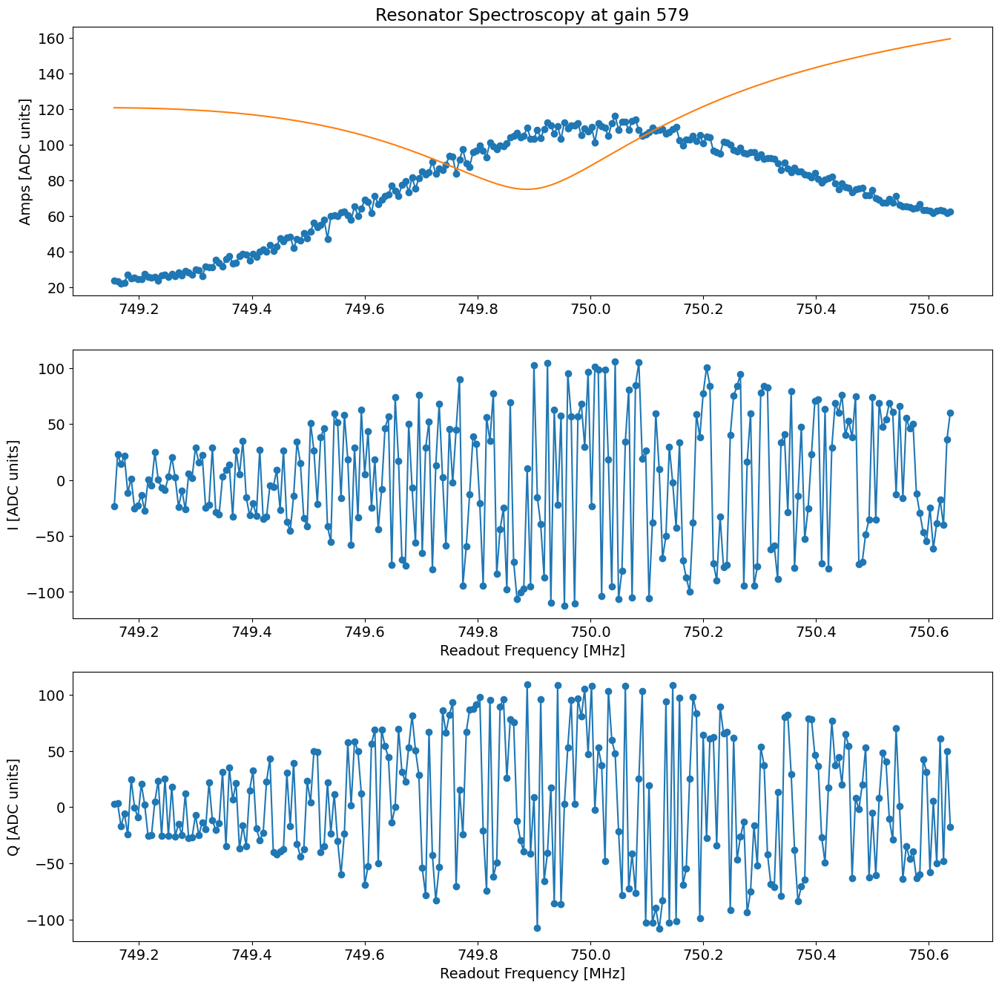

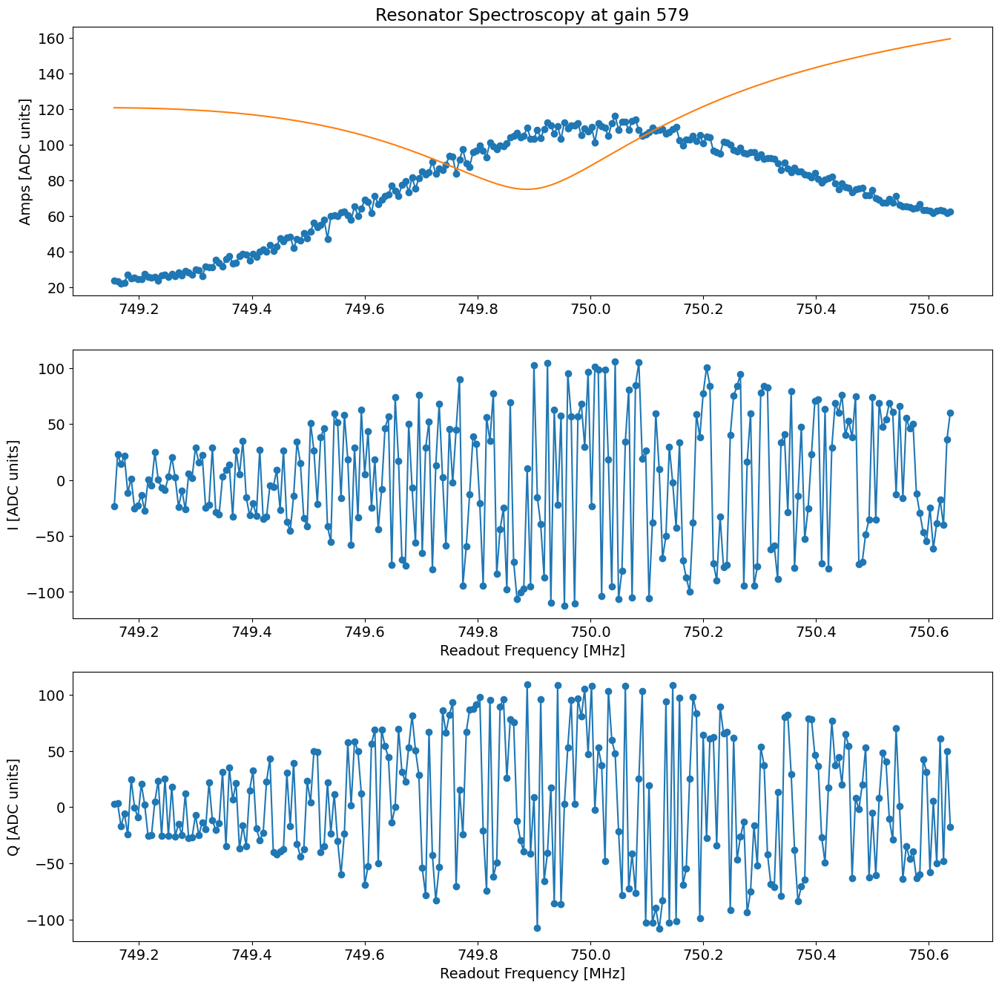

In [104]:
# Execute
# =================================
rspec_runner = CharacterizationRunner(
    station = station,
    ExptClass = meas.ResonatorSpectroscopyExperiment,
    default_expt_cfg = resspec_defaults,
    preprocessor = resspec_preproc,
    postprocessor = None, # resspec_postproc, # uncomment if you want to update the readout freq from this expt
    job_client=client,
)

if expts_to_run['res_spec']:
    rspec = rspec_runner.execute()
    rspec.display()

In [ ]:
# station.preview_config_update()

## Single Shot

In [105]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
singleshot_defaults = AttrDict(dict(    
    reps=5000,
    relax_delay=500,
    check_f=False,
    active_reset=False,
    man_reset=False,
    storage_reset=False,
    qubit=0,
    pulse_manipulate=False,
    cavity_freq=4984.373226159381,
    cavity_gain=400,
    cavity_length=2,
    prepulse=False,
    pre_sweep_pulse=None,
    gate_based=True,
    qubits=[0],
)) # Shouldn't be modifying this on the fly!
# You can use kwargs in the run function to override these values

def singleshot_postproc(station, expt):
    expt.analyze(plot=False, station=station, subdir=station.autocalib_path)
    fids = expt.data['fids']
    confusion_matrix = expt.data['confusion_matrix']
    thresholds_new = expt.data['thresholds']
    angle = expt.data['angle']
    print(fids)

    hardware_cfg = station.hardware_cfg
    hardware_cfg.device.readout.phase = [hardware_cfg.device.readout.phase[0] + angle]
    hardware_cfg.device.readout.threshold = thresholds_new
    hardware_cfg.device.readout.threshold_list = [thresholds_new]
    hardware_cfg.device.readout.Ie = [np.median(expt.data['Ie_rot'])]
    hardware_cfg.device.readout.Ig = [np.median(expt.data['Ig_rot'])]
    if expt.cfg.expt.active_reset:
        hardware_cfg.device.readout.confusion_matrix_with_active_reset = confusion_matrix
    else:
        hardware_cfg.device.readout.confusion_matrix_without_reset = confusion_matrix
    print('Updated readout!')

Job submitted: JOB-20260814-00035 (queue position: 1)

[0.0s] Job JOB-20260814-00035: pending

[3.0s] Job JOB-20260814-00035: running
[WORKER] Loading HistogramExperiment from experiments.single_qubit.single_shot
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00035_HistogramExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 66%|████████████████████████▏            | 3276/5000 [00:06<00:03, 499.11it/s]
[22.1s] Job JOB-20260814-00035: completed
100%|█████████████████████████████████████| 5000/5000 [00:10<00:00, 499.45it/s]
Unrotated:
Ig -26.994594594594595 +/- 27.12044593063958 	 Qg 55.872972972972974 +/- 29.893149533810966 	 Amp g 62.052375024370214
Ie -18.774324324324326 +/- 26.904936834604065 	 Qe -6.855405405405405 +/- 30.309409842898077 	 Amp e 19.9867915661163
Rotated:
Ig -58.974211237169655 +/- 29.927203866077843 	 Qg -19.494384609792746 +/- 2

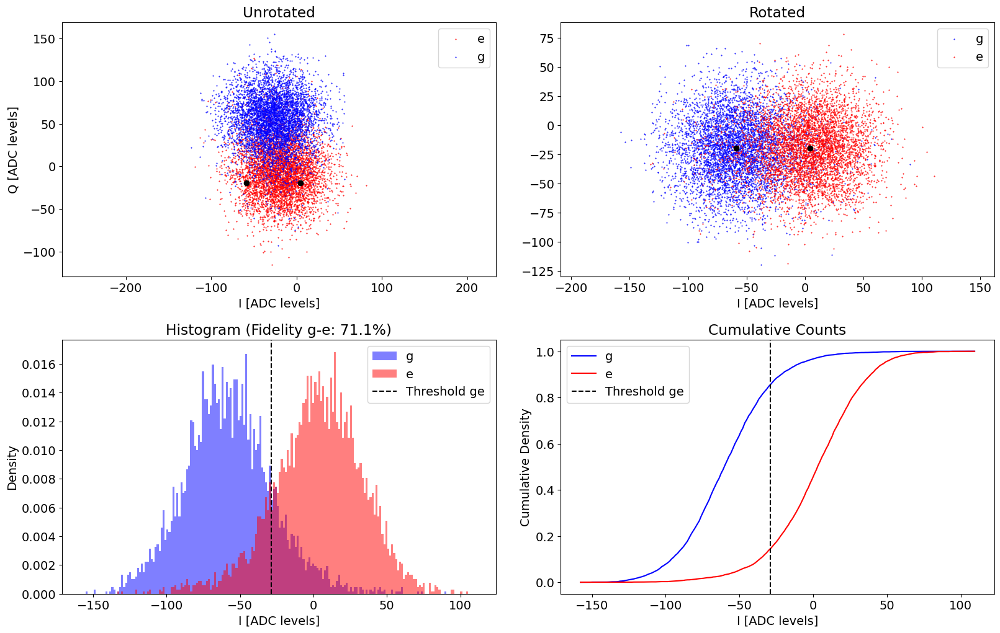

Unrotated:
Ig -26.994594594594595 +/- 27.12044593063958 	 Qg 55.872972972972974 +/- 29.893149533810966 	 Amp g 62.052375024370214
Ie -18.774324324324326 +/- 26.904936834604065 	 Qe -6.855405405405405 +/- 30.309409842898077 	 Amp e 19.9867915661163
Rotated:
Ig -58.974211237169655 +/- 29.927203866077843 	 Qg -19.494384609792746 +/- 27.082862575542908 	 Amp g 62.11270902448896
Ie 4.236472801415333 +/- 30.46669223353179 	 Qe -19.39051251121638 +/- 26.726702292764344 	 Amp e 19.84791367486192


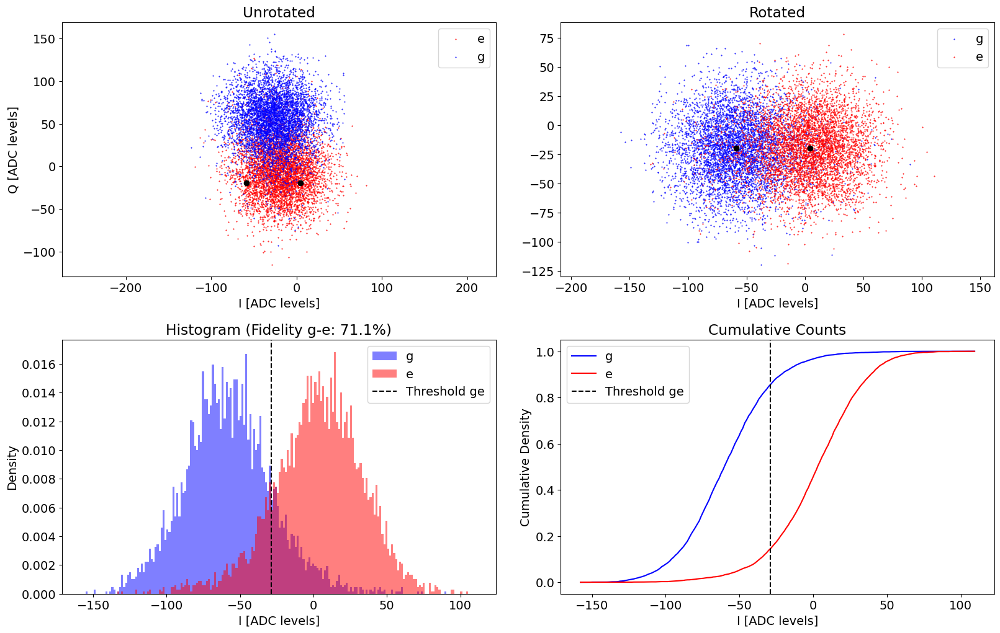

ge fidelity (%): 71.07421484296857
rotation angle (deg): 82.53418985055715
threshold ge: -28.923713626619246


In [106]:
# Execute
# =================================
ss_runner = CharacterizationRunner(
    station = station,
    ExptClass = meas.HistogramExperiment,
    default_expt_cfg = singleshot_defaults,
    postprocessor = singleshot_postproc,
    job_client=client,
)

if expts_to_run['single_shot']:
    ss = ss_runner.execute(
        check_f=False,
        # active_reset=False, # on recalibration of readout, turn off active reset because it will be wrong for selecting when to apply the qubit pulse
        relax_delay=2000,


        reps=5000,
        # active_reset=True,
        # relax_delay=200,
    )
    ss.display(station)

In [107]:
station.snapshot_hardware_config(update_main=True)

[CONFIG] Created new hardware_config version CFG-HW-20260814-00014
[CONFIG] Updated main hardware_config to CFG-HW-20260814-00014


'CFG-HW-20260814-00014'

## Qubit ge

### Pulse-probe

In [37]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
gespec_defaults = AttrDict(dict(    
    # start=center-span/2,  # [MHz]
    # step=span/expts,  # min step ~1 MHz
    expts=200,  # Number of experiments stepping from start
    reps=100,  # Number of averages per point
    rounds=1,  # Number of start to finish sweeps to average over
    length=1,  # Qubit probe constant pulse length [us]
    gain=100,  # Qubit pulse gain
    sigma=0.1,  # Qubit flat top sigma
    qubit=[0],
    qubits=[0],
    prepulse=False,
    pre_sweep_pulse=[],
    gate_based=False,
    relax_delay=250,  # Wait time between experiments [us]
)) # Shouldn't be modifying this on the fly!
# You can use kwargs in the run function to override these values


def gespec_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)

    span = kwargs.pop('span', 10)  # MHz
    center = kwargs.pop('center', station.hardware_cfg.device.qubit.f_ge[0])
    expts = kwargs.pop('expts', default_expt_cfg.expts)

    expt_cfg.start = center - span / 2
    expt_cfg.step = span / expts
    expt_cfg.expts = expts
    
    expt_cfg.update(kwargs)
    return expt_cfg

def gespec_postproc(station, expt):
    old_freq = station.hardware_cfg.device.qubit.f_ge[0]
    station.hardware_cfg.device.qubit.f_ge = [expt.data['fit_avgi'][2]]
    print(f'Updated qubit frequency from {old_freq} to {station.hardware_cfg.device.qubit.f_ge[0]}!')
    station.snapshot_hardware_config(update_main=False)

In [36]:
station.hardware_cfg.device.qubit.f_ge[0]

3565.0322364012964

Job submitted: JOB-20260813-00013 (queue position: 1)

[0.0s] Job JOB-20260813-00013: pending

[2.2s] Job JOB-20260813-00013: running
[WORKER] Loading PulseProbeSpectroscopyExperiment from experiments.single_qubit.pulse_probe_spectroscopy
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260813-00013_PulseProbeSpectroscopyExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 49%|█████████████████▏                 | 9828/20000 [00:02<00:02, 3923.43it/s]
[6.2s] Job JOB-20260813-00013: completed
100%|██████████████████████████████████| 20000/20000 [00:05<00:00, 3938.55it/s]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260813-00013_PulseProbeSpectroscopyExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260813-00013_expt.pkl

Job completed! Data: C:\experiments\260813_calibration_

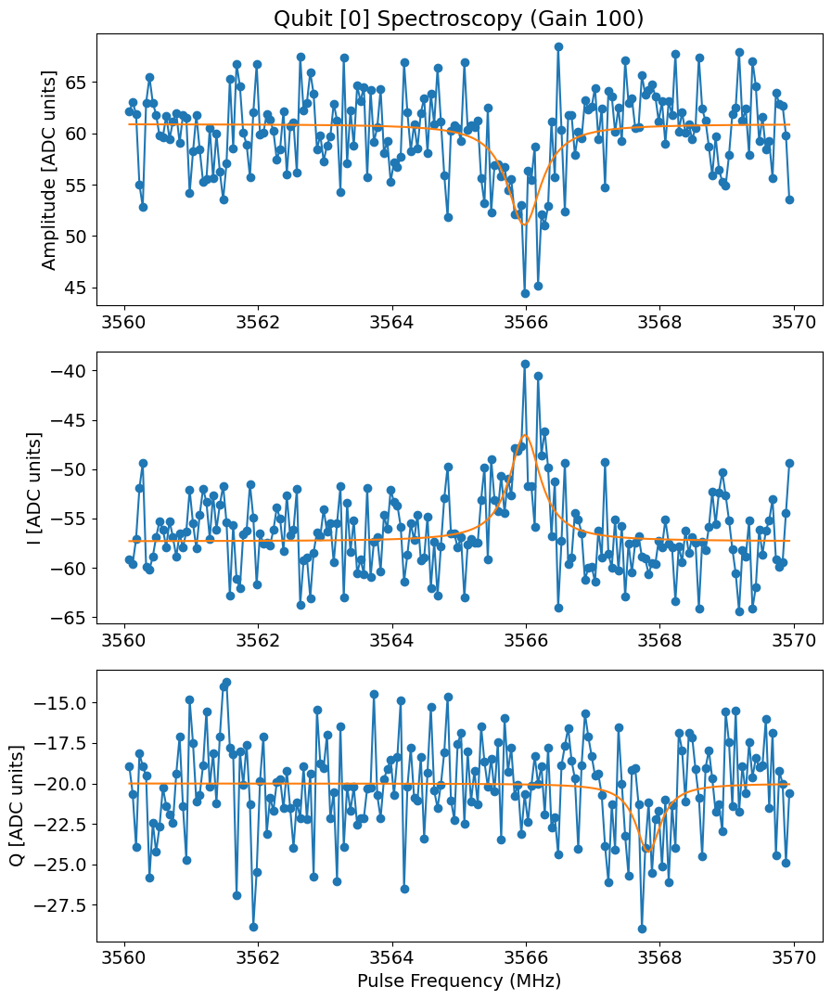

Found peak in amps at [MHz] 3565.9759421813, HWHM 0.30836055890994196
Found peak in I at [MHz] 3565.98591736408, HWHM -0.28278781022251775
Found peak in Q at [MHz] 3567.826656196489, HWHM 0.224580139130542


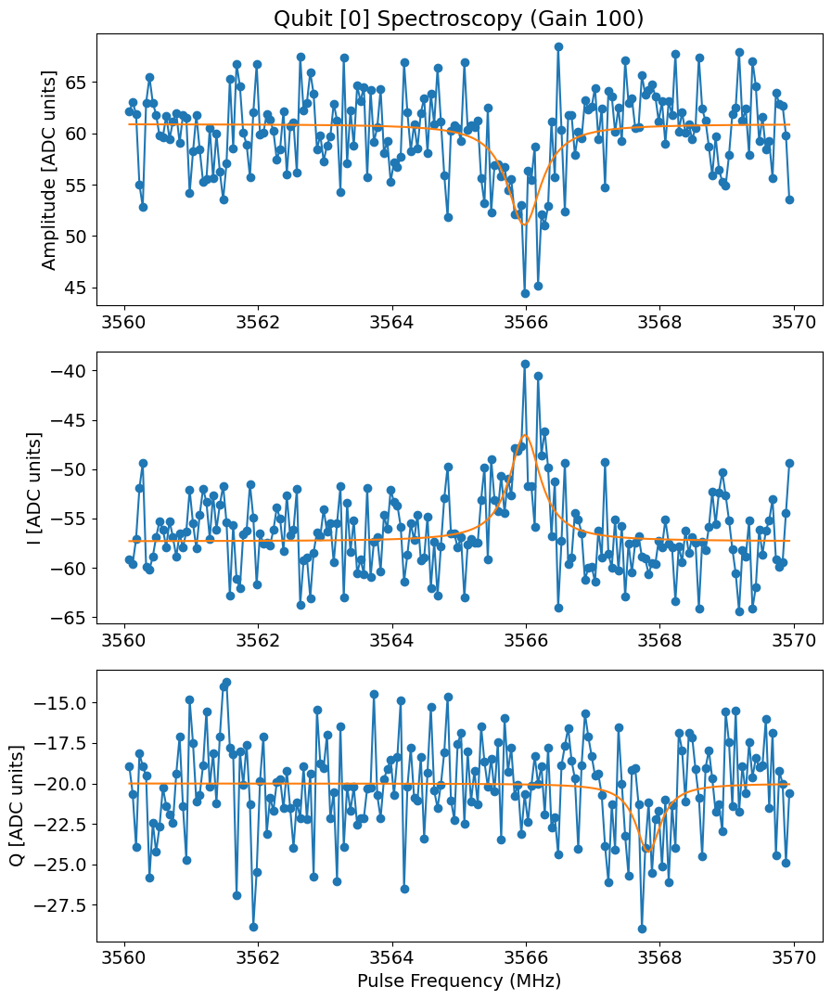

In [38]:
# Execute
# =================================
gespec_runner = CharacterizationRunner(
    station = station,
    ExptClass = meas.PulseProbeSpectroscopyExperiment,
    default_expt_cfg = gespec_defaults,
    preprocessor = gespec_preproc,
    postprocessor = gespec_postproc,
    job_client=client,
)

if expts_to_run['pulse_probe_ge']:
    gespec = gespec_runner.execute(
        # coupler_current=coupler_current,
        span = 10,
        expts = 200
    )
    gespec.display()

In [ ]:
station.hardware_cfg.device.qubit['f_ge']

In [ ]:
station.preview_config_update()
# station.snapshot_hardware_config(update_main=True)

### T2 Ramsey

In [291]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
from sqlalchemy import false


geramsey_defaults = AttrDict(dict(
    ramsey_freq=0.2,  # [MHz]
    start=0.01, # us
    step=0.5,
    expts=101,
    reps=200,
    rounds=1,
    pre_sweep_pulse=None,
    post_sweep_pulse=None,
    if_ef=False,
    ef_init=True, # redundant
    qubits=[0],
    user_defined_freq=[False, 3568.2038290468167, 5304, 0.035],
    f0g1_cavity=0,
    normalize=False,
    active_reset=False,
    man_reset=False,
    storage_reset=False,
    prepulse=None,
    postpulse=None,
    pre_active_reset_pulse=False,
    gate_based=False,
    advance_phase=0,
    echoes=[False, 0],
    relax_delay=200
)) # Shouldn't be modifying this on the fly!
# You can use kwargs in the run function to override these values

def geramsey_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    # Copied over but what's all this below????
    # Which ones are actually used? 
    # Can we straighten out all the nested boolean logic???
    checkEF = False
    qubit_ge_init = False
    qubit_ge_after = False
    if expt_cfg.if_ef:
        checkEF = True
        qubit_ge_init = True if expt_cfg.ef_init else False
        qubit_ge_after = True if expt_cfg.ef_init else False
    expt_cfg.checkEF = checkEF
    expt_cfg.qubit_ge_init = qubit_ge_init
    expt_cfg.qubit_ge_after = qubit_ge_after

    expt_cfg.prepulse = False if expt_cfg.pre_sweep_pulse is None else True if expt_cfg.prepulse is None else expt_cfg.prepulse,
    expt_cfg.postpulse = False if expt_cfg.post_sweep_pulse is None else True if expt_cfg.postpulse is None else expt_cfg.postpulse,
    
    return expt_cfg

def geramsey_postproc(station, expt):
    old_freq = station.hardware_cfg.device.qubit.f_ge[0]
    station.hardware_cfg.device.qubit.f_ge = [
        station.hardware_cfg.device.qubit.f_ge[0] + min(expt.data['f_adjust_ramsey_avgi'])
    ]
    print(f'Updated qubit frequency from {old_freq} to {station.hardware_cfg.device.qubit.f_ge[0]}!')
    station.snapshot_hardware_config(update_main=False)

Job submitted: JOB-20260816-00012 (queue position: 1)

[0.0s] Job JOB-20260816-00012: pending

[3.1s] Job JOB-20260816-00012: running
[WORKER] Loading RamseyExperiment from experiments.single_qubit.t2_ramsey
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260816-00012_RamseyExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
fge is  3566.0861679755944
fef is  3422.630777390371
100%|███████████████████████████████████| 20000/20000 [00:51<00:00, 390.84it/s]
No echoes in the data

[58.7s] Job JOB-20260816-00012: completed
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260816-00012_RamseyExperiment.h5
[h5_safe_data] dropped non-numeric keys: ['fit_envelope_avgi', 'fit_envelope_avgq', 'fit_envelope']
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260816-00012_expt.pkl

Job completed! Data:

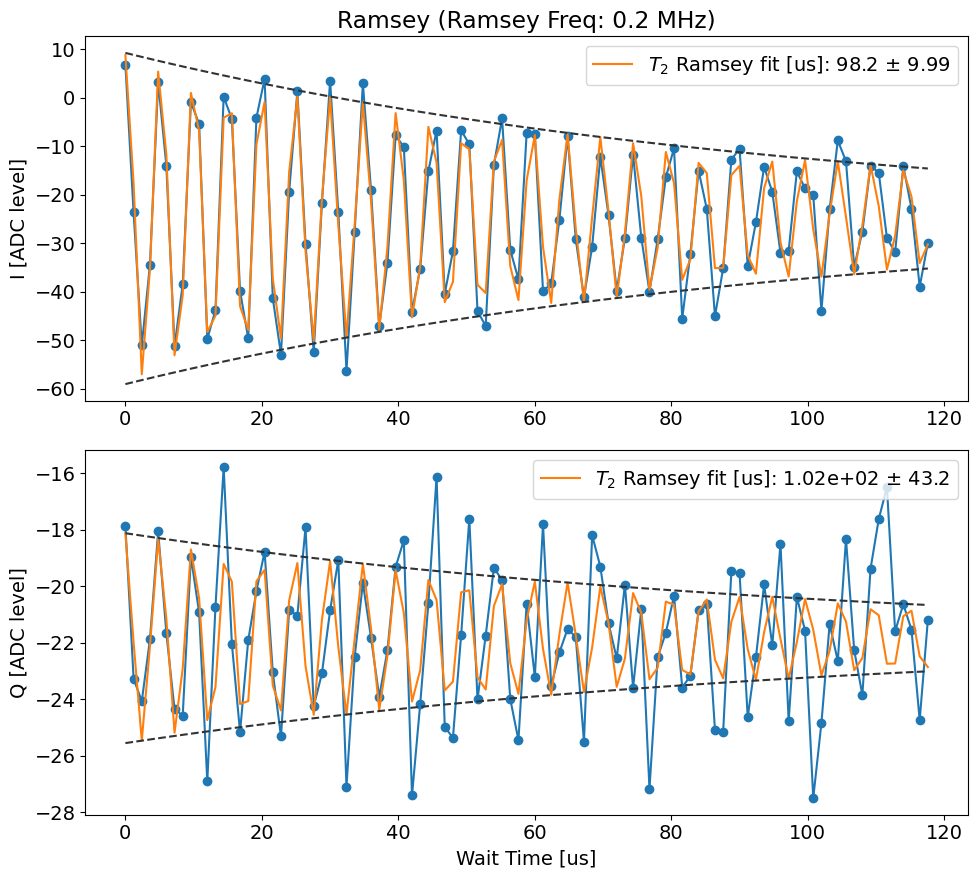

Current pi pulse frequency: 3566.0861679755944
Fit frequency from I [MHz]: 0.20144296780854837 +/- 0.00016872288813931527
Suggested new pi pulse frequency from fit I [MHz]:
 	3566.084725007786
 	3566.487610943403
T2 Ramsey from fit I [us]: 98.21119156359424
Fit frequency from Q [MHz]: 0.20038930188923174 +/- 0.0006687934066123121
Suggested new pi pulse frequencies from fit Q [MHz]:
 	3566.085778673705
 	3566.486557277484
T2 Ramsey from fit Q [us]: 102.07855192731084


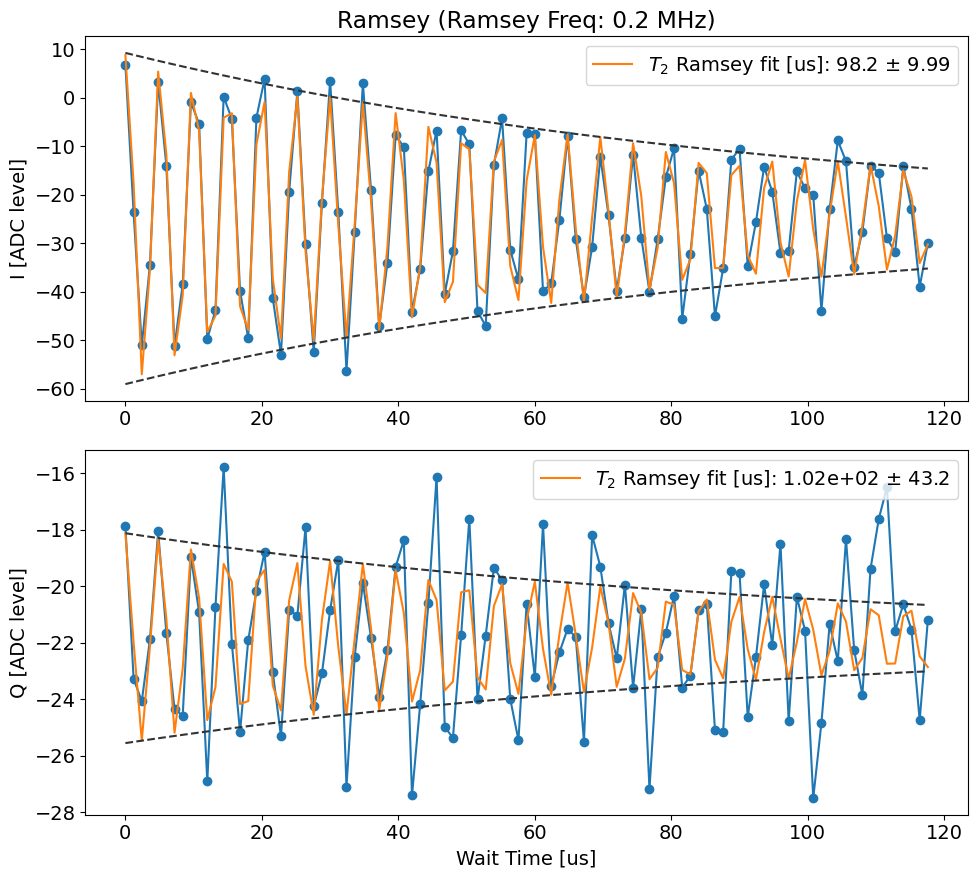

In [293]:
# Execute
# =================================
geramsey_runner = CharacterizationRunner(
    station = station,
    ExptClass = meas.RamseyExperiment,
    default_expt_cfg = geramsey_defaults,
    preprocessor = geramsey_preproc,
    postprocessor = geramsey_postproc,
    job_client=client,
)

if expts_to_run['t2_ge']:
    geramsey = geramsey_runner.execute(
        ramsey_freq = 0.2, #0.2
        step=1.2, #0.4
        active_reset=False,
        relax_delay=2500,
        postprocess=True,
        if_ef=False,
        expts = 100
    )
    geramsey.display()

### Amplitude Rabi

We should probably use a cosine fit with fixed phase=0 instead of decaying sine with varying phase?

In [85]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
amprabi_defaults = AttrDict(dict(
    start=0,
    step=60,
    expts=151,
    reps=200,
    rounds=1,
    sigma_test=None,
    qubit=0,
    pulse_type='gauss',
    drag_beta=0.0,
    pulse_ge_init=False,
    pulse_ge_after=False,
    checkZZ=False,
    checkEF=False,
    qubits=[0],
    flat_length=0,
    normalize=False,
    single_shot=False,
    singleshot_reps=10000,
    span=50,
    user_defined_freq=[False, 3568.203829046816],
    prepulse=False,
    postpulse=False, 
    if_ef=False,  # If true, will check ef frequency and update it
)) # Shouldn't be modifying this on the fly!
# You can use kwargs in the run function to override these values

def amprabi_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    # Copied over but what's all this below????
    # Which ones are actually used? 
    # Can we straighten out all the nested boolean logic???
    pulse_ge = station.hardware_cfg.device.qubit.pulses.pi_ge
    if expt_cfg.sigma_test is None:
        expt_cfg.sigma_test = pulse_ge.sigma[0]
    if expt_cfg.step is None:
        expt_cfg.step = int(pulse_ge.gain[0] / (expt_cfg.expts - 1))
    
    expt_cfg.checkEF = False
    expt_cfg.pulse_ge_init = False
    expt_cfg.pulse_ge_after = False
    if expt_cfg.if_ef:
        expt_cfg.checkEF = True
        expt_cfg.pulse_ge_init = True
        expt_cfg.pulse_ge_after = True
    
    return expt_cfg

def amprabi_postproc(station, expt):
    station.hardware_cfg.device.qubit.pulses.pi_ge.gain = [expt.data['pi_gain_avgi']]
    station.hardware_cfg.device.qubit.pulses.hpi_ge.gain = [expt.data['hpi_gain_avgi']]
    print('Updated qubit ge pi and hpi gaussian gain!')
    station.snapshot_hardware_config(update_main=False)

Job submitted: JOB-20260814-00005 (queue position: 1)

[0.0s] Job JOB-20260814-00005: pending

[2.3s] Job JOB-20260814-00005: running
[WORKER] Loading AmplitudeRabiExperiment from experiments.single_qubit.amplitude_rabi
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00005_AmplitudeRabiExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 98%|██████████████████████████████████▎| 58968/60200 [02:27<00:03, 399.56it/s]
[152.4s] Job JOB-20260814-00005: completed
100%|███████████████████████████████████| 60200/60200 [02:30<00:00, 399.62it/s]
Attempted to init fitparam 0 to 33.934398648648646, which is out of bounds 0 to 25.84757432432432. Instead init to 12.92378716216216
Attempted to init fitparam 4 to -22.72288336176708, which is out of bounds 10.508334102991894 to 71.47133343060158. Instead init to 40.989833766796735
Saving C:\experiments\260813_calibrat

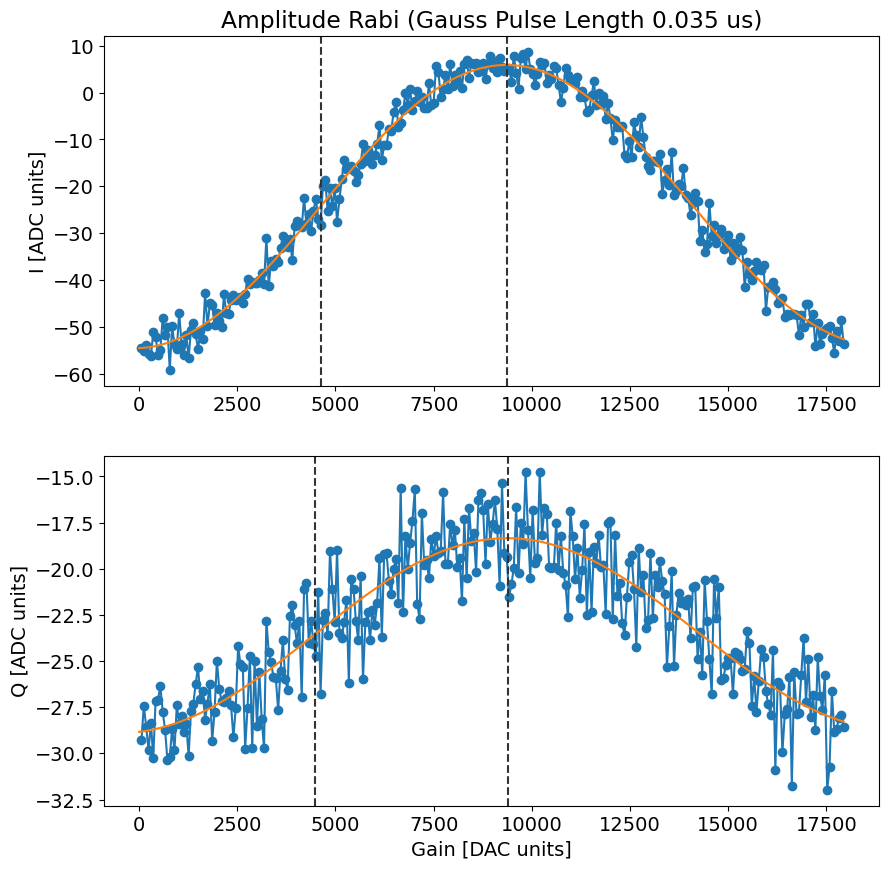

Pi gain from avgi data [dac units]: 9363
	Pi/2 gain from avgi data [dac units]: 4630
Pi gain from avgq data [dac units]: 9388
	Pi/2 gain from avgq data [dac units]: 4468


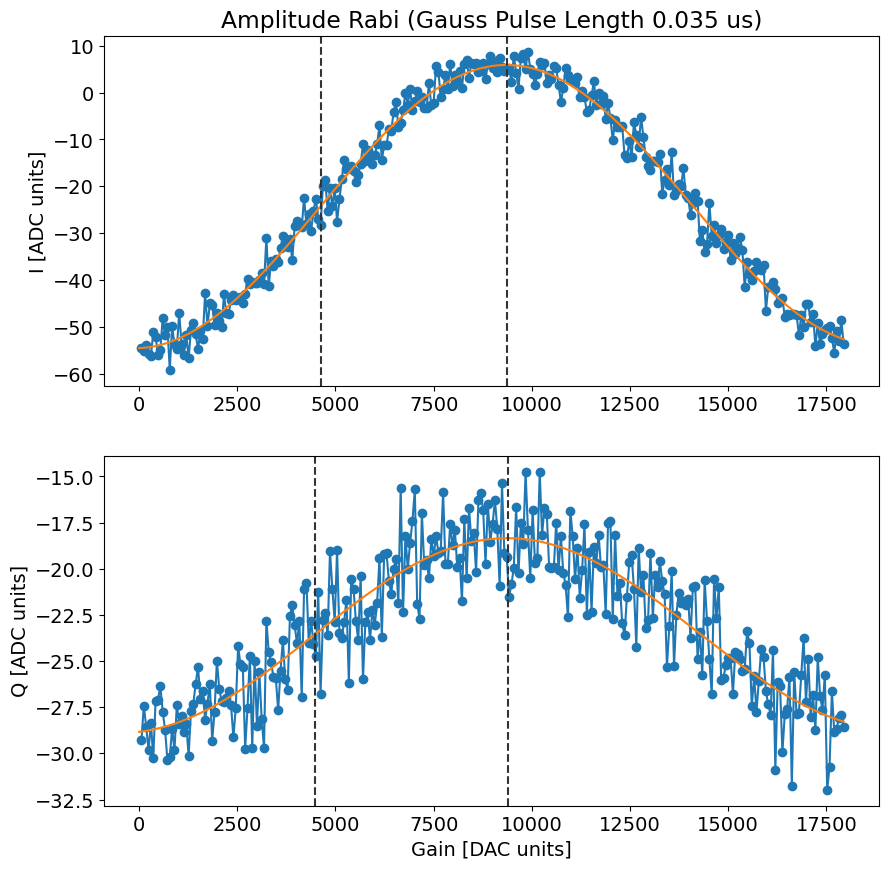

Job submitted: JOB-20260814-00006 (queue position: 1)

[0.0s] Job JOB-20260814-00006: pending

[2.5s] Job JOB-20260814-00006: running
[WORKER] Loading RamseyExperiment from experiments.single_qubit.t2_ramsey
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00006_RamseyExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
fge is  3566.0879602827326
fef is  3422.700418494041
 70%|███████████████████████▉          | 14196/20200 [00:03<00:01, 3511.91it/s]
[8.6s] Job JOB-20260814-00006: completed
100%|██████████████████████████████████| 20200/20200 [00:05<00:00, 3568.64it/s]
No echoes in the data
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00006_RamseyExperiment.h5
[h5_safe_data] dropped non-numeric keys: ['fit_envelope_avgi', 'fit_envelope_avgq', 'fit_envelope']
[WORKER] Saving expt object to: C:\experiments\260813_calibration

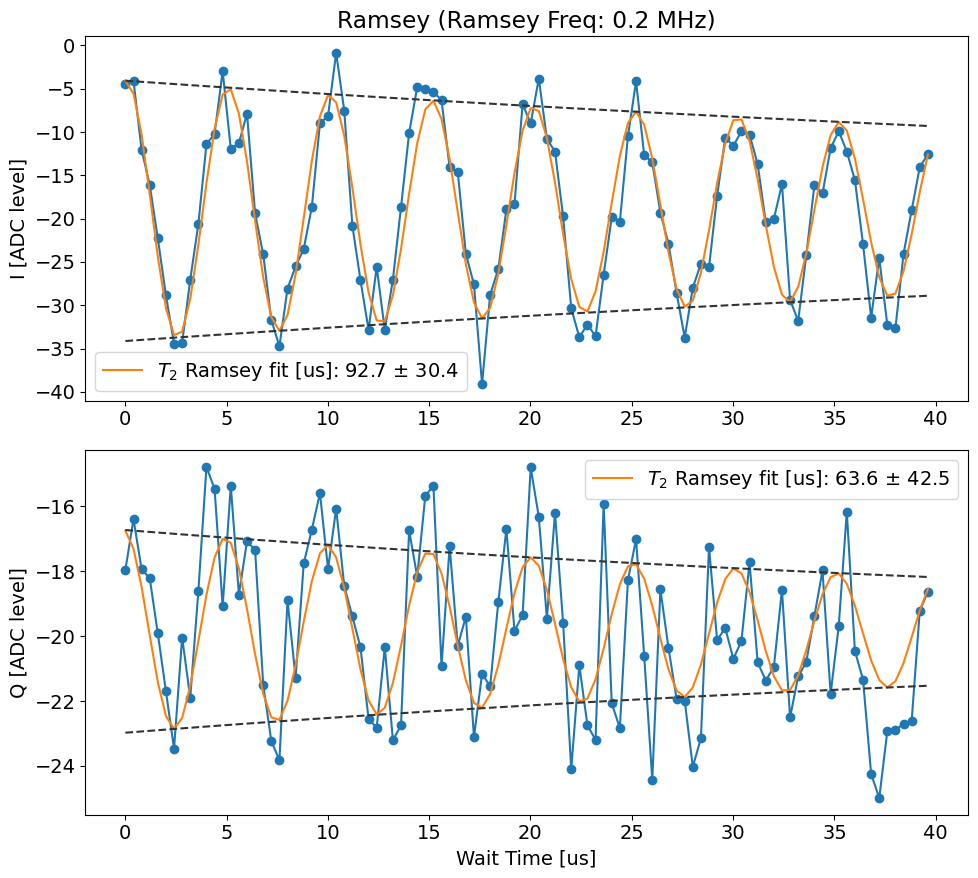

Current pi pulse frequency: 3566.0879602827326
Fit frequency from I [MHz]: 0.19885881483430054 +/- 0.000576465645364644
Suggested new pi pulse frequency from fit I [MHz]:
 	3566.089101467898
 	3566.486819097567
T2 Ramsey from fit I [us]: 92.66879806254869
Fit frequency from Q [MHz]: 0.19884725387732918 +/- 0.0017069001499814055
Suggested new pi pulse frequencies from fit Q [MHz]:
 	3566.0891130288555
 	3566.48680753661
T2 Ramsey from fit Q [us]: 63.622604768948825


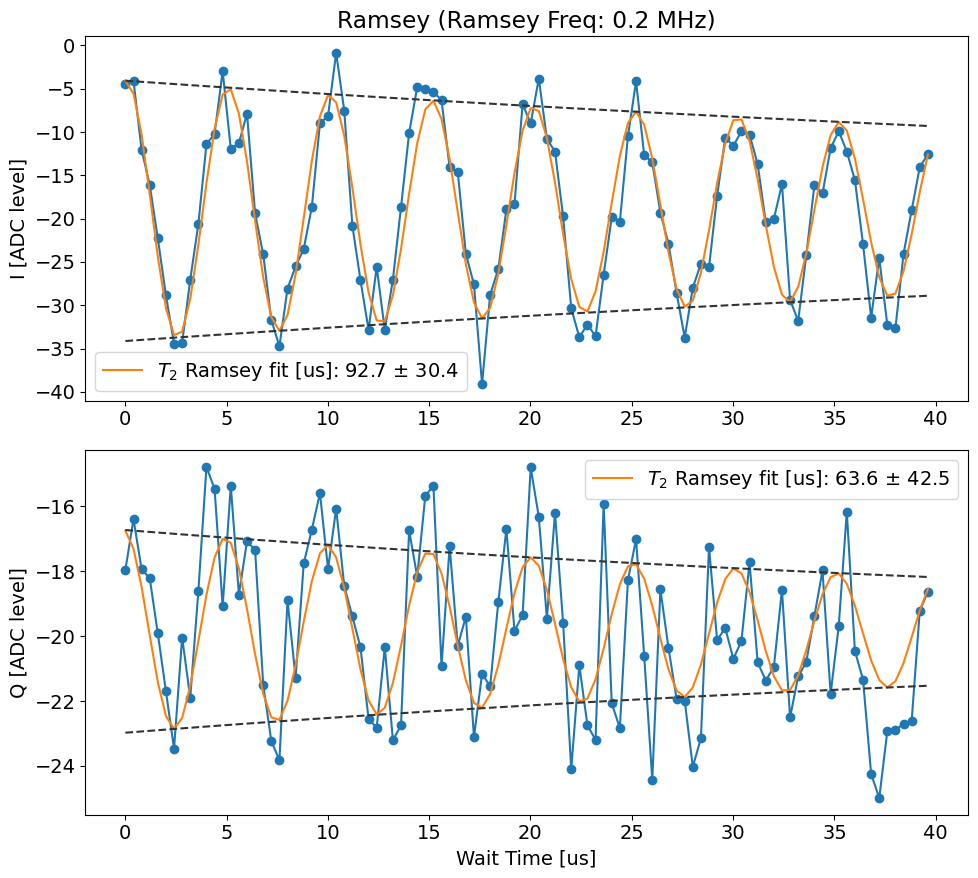

In [86]:
# Execute
# =================================
amprabi_runner = CharacterizationRunner(
    station = station,
    ExptClass = meas.AmplitudeRabiExperiment,
    default_expt_cfg = amprabi_defaults,
    preprocessor = amprabi_preproc,
    postprocessor = amprabi_postproc,
    job_client=client,
)

if expts_to_run['amplitude_ge']:
    amprabi = amprabi_runner.execute(
        relax_delay=2500,
        expts=301,
        postprocess=True,
    )
    amprabi.display()

    t2_ramsey_ge_after_amp = geramsey_runner.execute(
        ramsey_freq = 0.2, #0.2,
        step = 0.4, #0.4,
        active_reset = True,
        relax_delay=250,
    )
    t2_ramsey_ge_after_amp.display()


In [87]:
station.preview_config_update()
# station.snapshot_hardware_config(update_main=True)

Comparing configurations:
Parent config file: C:\python\multimode_expts\configs\versions\hardware_config\CFG-HW-20260813-00031.yml
Key 'device.qubit.f_ge' differs:
  Old value (config1): [3566.0497306277534]
  New value (config2): [3566.089101467898]
Key 'device.qubit.pulses.pi_ge.gain' differs:
  Old value (config1): [9447]
  New value (config2): [9363]
Key 'device.qubit.pulses.hpi_ge.gain' differs:
  Old value (config1): [4725]
  New value (config2): [4630]


### Error Amplification

In [ ]:
# Error Amplification - Runner Pattern with CharacterizationRunner
# =====================================
error_amp_defaults = AttrDict(dict(
    reps=100,
    rounds=1,
    qubit=0,
    n_pulses=10,
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    relax_delay=2500,
    start=0,
    expts=10,
    step=100,
    parameter_to_test='gain',  # 'gain' or 'frequency'
    pulse_type=['qubit', 'ge', 'pi', 0],
    # Multiphoton-specific parameters
    man_no=1,  # Manipulate mode number
    pulse_name='pi',  # 'pi' or 'hpi'
))


def error_amp_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    
    expt_cfg.qubits = [expt_cfg.qubit]
    
    return expt_cfg

def error_amp_postproc(station, expt, state_fin='g'):
    """Update config based on error amplification results.
    
    For multiphoton transitions, updates the multiphoton config.
    For standard qubit calibration, updates the qubit pulse params.
    """
    expt_cfg = expt.cfg.expt
    parameter = expt_cfg.parameter_to_test
    pulse_name = expt_cfg.pulse_type[2]  # 'pi' or 'hpi'
    transition_key = expt_cfg.pulse_type[1] # 'ge' or 'ef'
    print(f'Processing error amplification for parameter: {parameter}, pulse: {pulse_name}')


    if state_fin == 'e':
        expt.analyze(data=expt.data, state_fin='e')
        expt.display(data=expt.data, state_fin='e')

    
    # Get the optimal value from the experiment data
    # Error amplification typically finds the value that minimizes error
    if 'optimal_value' in expt.data:
        optimal_val = expt.data['optimal_value']

    if 'fit_avgi' in expt.data:
        print('parameter:', parameter)
        if parameter == 'frequency':
            optimal_val = expt.data['fit_avgi'][2]
        elif parameter == 'gain':
            optimal_val = int(expt.data['fit_avgi'][2])
        else: 
            raise ValueError(f"Unknown parameter to test: {parameter}")

    else:
        # If no automatic extraction, user needs to analyze manually
        print('No automatic optimal value extraction. Please analyze the data manually.')
        return
    
    # Standard qubit update
    pulse_key = f'{pulse_name}_{transition_key}'
    freq_key = f"f_{transition_key}"
    if parameter == 'frequency':
        old_val = station.hardware_cfg.device.qubit[freq_key][0]
        station.hardware_cfg.device.qubit[freq_key][0] = optimal_val
        print(f'Updated qubit {freq_key} {parameter}: {old_val} -> {optimal_val}')
    elif parameter == 'gain':
        old_val = station.hardware_cfg.device.qubit.pulses[pulse_key]['gain'][0]
        station.hardware_cfg.device.qubit.pulses[pulse_key]['gain'][0] = optimal_val
        print(f'Updated qubit {pulse_key} {parameter}: {old_val} -> {optimal_val}')
        


In [ ]:
error_amp_runner_qubit = CharacterizationRunner(
    station=station,
    ExptClass=meas.ErrorAmplificationExperiment,
    default_expt_cfg=error_amp_defaults,
    preprocessor=error_amp_preproc,
    postprocessor=error_amp_postproc,
    job_client=client,
    use_queue=True,
)

#### Frequency

In [ ]:
expts = 50 #50
band = 1 #2
freq_start = station.hardware_cfg.device.qubit['f_ge'][0] - band
# freq_start = 3569 - band
step = 2 * band / expts
print(f'Frequency start: {freq_start}, Step: {step}')



error_amp = error_amp_runner_qubit.execute(
    parameter_to_test='frequency',
    step=2 * band / expts, 
    start=freq_start,
    expts=expts,
    reps=50,
    pulse_type=['qubit', 'ge', 'pi', 0],
    # n_pulses=20,
)


#### Amplitude

In [ ]:
band = 500
expts = 25
gain_start = station.hardware_cfg.device.qubit.pulses.pi_ge.gain[0] - band
# gain_start = 10000
step = 2 * band / expts
print(f'Gain start: {gain_start}, Step: {step}')

error_amp = error_amp_runner_qubit.execute(
    parameter_to_test='gain',
    step=step,
    start=gain_start,
    expts=expts,
    reps=50,
    pulse_type=['qubit', 'ge', 'pi', 0],
)

### T1

In [46]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
t1_ge_defaults = AttrDict(dict(
    start=0,
    step=20,
    expts=100,
    reps=100,
    rounds=1,
    qubit=0,
    qubit_ef=False,
    normalize=False,
    relax_delay=2500,
))

def t1_ge_postproc(station, expt):
    station.hardware_cfg.device.qubit.T1 = [expt.data['fit_avgi'][3]]
    print('Updated qubit T1!')
    station.snapshot_hardware_config(update_main=False)


Job submitted: JOB-20260813-00020 (queue position: 1)

[0.0s] Job JOB-20260813-00020: pending

[2.1s] Job JOB-20260813-00020: running
[WORKER] Loading T1Experiment from experiments.single_qubit.t1
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260813-00020_T1Experiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 82%|█████████████████████████████▍      | 8190/10000 [00:27<00:06, 282.91it/s]
[36.3s] Job JOB-20260813-00020: completed
100%|███████████████████████████████████| 10000/10000 [00:34<00:00, 286.27it/s]
C:\python\multimode_expts\fitting\fitting.py:67: OptimizeWarning: Covariance of the parameters could not be estimated
  pOpt, pCov = sp.optimize.curve_fit(expfunc, xdata, ydata, p0=fitparams, maxfev=200000)
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260813-00020_T1Experiment.h5
[WORKER] Saving expt object to: C:\experiments\2608

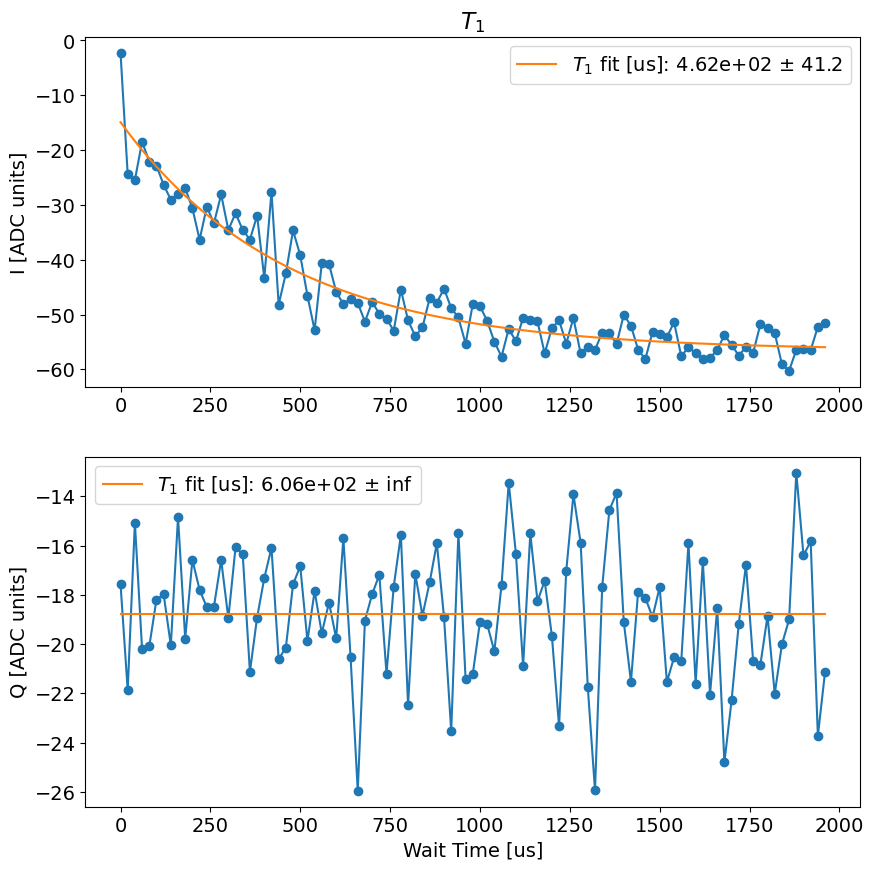

Fit T1 avgi [us]: 462.2047818490185
Fit T1 avgq [us]: 605.7700798421799


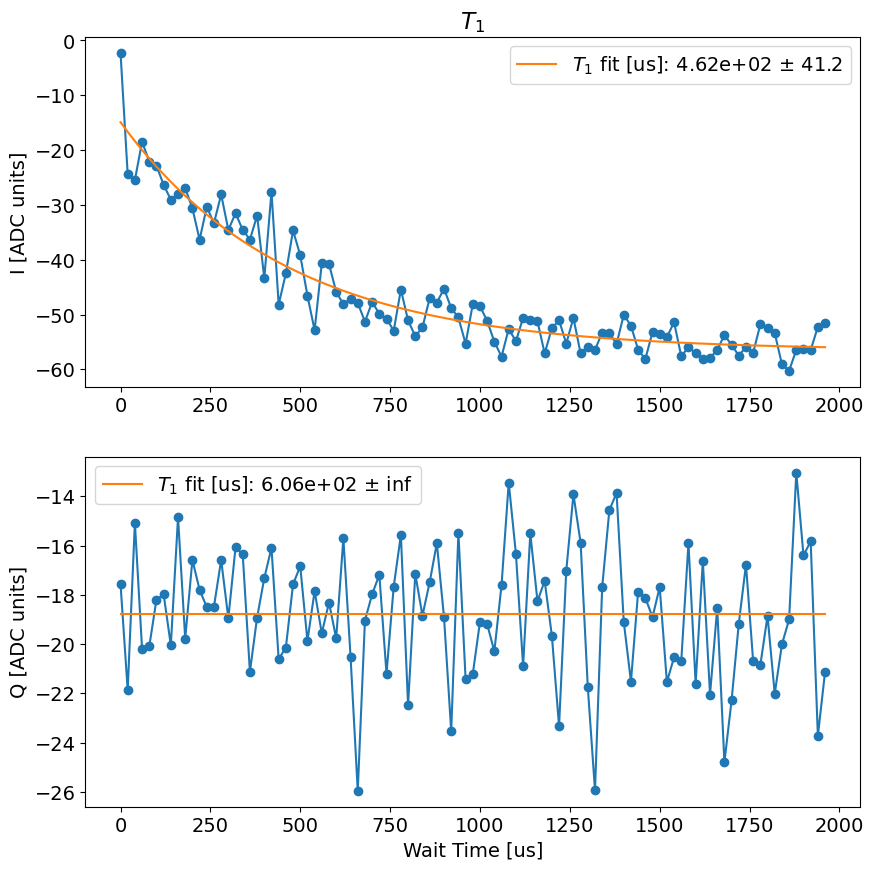

In [47]:
# Execute
# =================================
t1_ge_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.t1.T1Experiment,
    default_expt_cfg=t1_ge_defaults,
    postprocessor=t1_ge_postproc,
    job_client=client,
)

if expts_to_run['t1_ge']:
    t1_ge = t1_ge_runner.execute()
    t1_ge.display()

In [ ]:
station.preview_config_update()
# station.snapshot_hardware_config(update_main=True)

## Qubit ef

### Pulse-probe

In [52]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
efspec_defaults = AttrDict(dict(
    start=3415,
    step=0.05,
    expts=500,
    reps=200,
    rounds=1,
    length=1,
    gain=100,
    qubit_f=False,
    qubit=0,
    cavity_drive=False,
    wait_qubit=False,
    relax_delay=500,
))

def efspec_postproc(station, expt):
    old_freq = station.hardware_cfg.device.qubit.f_ef[0]
    station.hardware_cfg.device.qubit.f_ef = [expt.data['fit_avgi'][2]]
    print(f'Updated qubit ef frequency from {old_freq} to {station.hardware_cfg.device.qubit.f_ef[0]}!')
    station.snapshot_hardware_config(update_main=False)

Job submitted: JOB-20260813-00023 (queue position: 1)

[0.0s] Job JOB-20260813-00023: pending

[2.8s] Job JOB-20260813-00023: running
[WORKER] Loading PulseProbeEFSpectroscopyExperiment from experiments.single_qubit.pulse_probe_ef_spectroscopy
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260813-00023_PulseProbeEFSpectroscopyExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 97%|███████████████████████████████▉ | 96642/100000 [00:48<00:01, 1984.06it/s]
[53.6s] Job JOB-20260813-00023: completed
100%|████████████████████████████████| 100000/100000 [00:50<00:00, 1985.60it/s]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260813-00023_PulseProbeEFSpectroscopyExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260813-00023_expt.pkl

Job completed! Data: C:\experiments\260813_ca

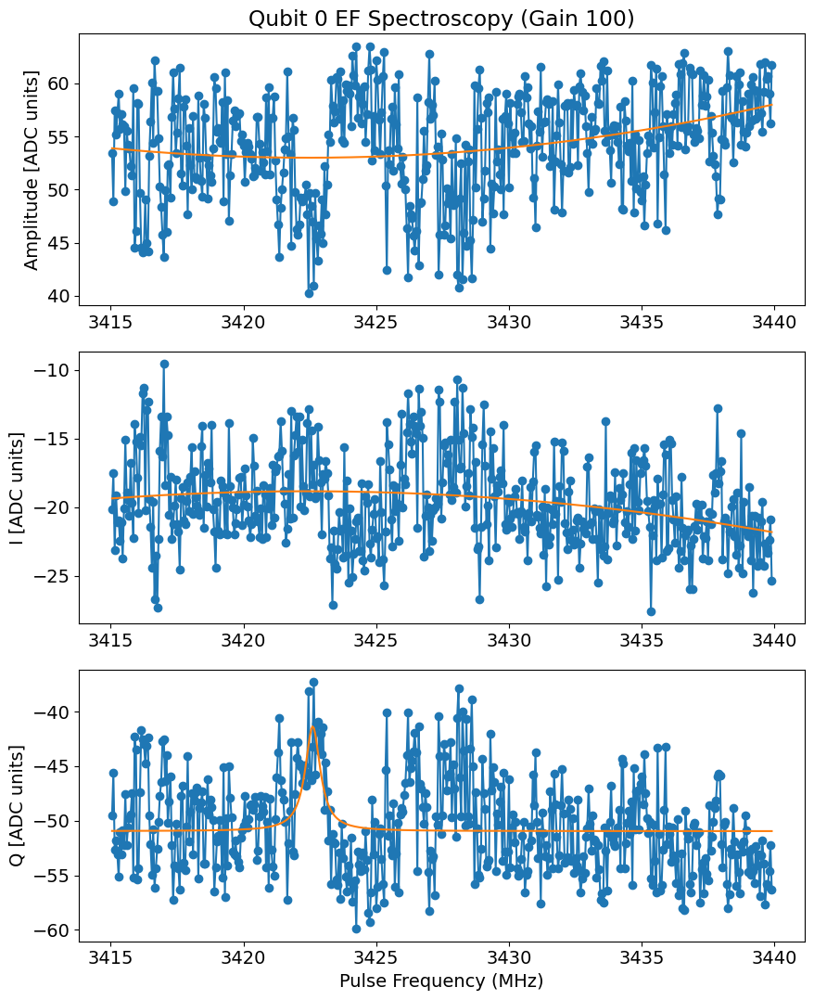

Found peak in amps at [MHz] 3422.430678100487, HWHM 833.2492224547926
Found peak in I at [MHz] 3422.386968087162, HWHM 992.881190488306
Found peak in Q at [MHz] 3422.6090426205983, HWHM 0.34248207703179456


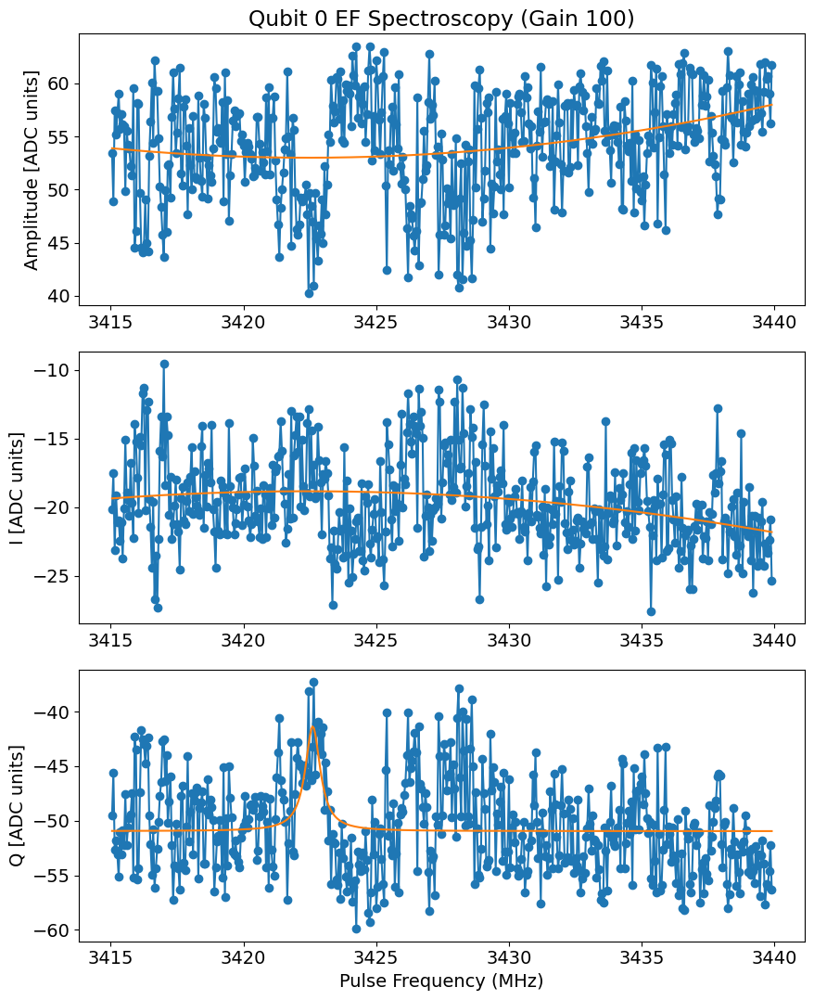

In [53]:
# Execute
# =================================
efspec_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.PulseProbeEFSpectroscopyExperiment,
    default_expt_cfg=efspec_defaults,
    postprocessor=efspec_postproc,
    job_client=client,
)

if expts_to_run['pulse_probe_ef']:
    qspec_ef = efspec_runner.execute(
    expts=500)
    qspec_ef.display()

### T2 Ramsey

In [88]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
# Reuse ge defaults but with if_ef=True
eframsey_defaults = AttrDict(deepcopy(geramsey_defaults))
eframsey_defaults.if_ef = True
eframsey_defaults.ef_init = True
eframsey_defaults.ramsey_freq = 3  # Typical ef ramsey frequency

def eframsey_postproc(station, expt):
    old_freq = station.hardware_cfg.device.qubit.f_ef[0]
    station.hardware_cfg.device.qubit.f_ef = [
        station.hardware_cfg.device.qubit.f_ef[0] + min(expt.data['f_adjust_ramsey_avgi'])
    ]
    print(f'Updated qubit ef frequency from {old_freq} to {station.hardware_cfg.device.qubit.f_ef[0]}!')
    station.snapshot_hardware_config(update_main=False)

Job submitted: JOB-20260814-00007 (queue position: 1)

[0.0s] Job JOB-20260814-00007: pending

[2.1s] Job JOB-20260814-00007: running
[WORKER] Loading RamseyExperiment from experiments.single_qubit.t2_ramsey
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00007_RamseyExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
fge is  3566.089101467898
fef is  3422.700418494041
 93%|████████████████████████████████▍  | 18564/20000 [00:46<00:03, 397.43it/s]
[53.0s] Job JOB-20260814-00007: completed
100%|███████████████████████████████████| 20000/20000 [00:50<00:00, 397.43it/s]
No echoes in the data
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00007_RamseyExperiment.h5
[h5_safe_data] dropped non-numeric keys: ['fit_envelope_avgi', 'fit_envelope_avgq', 'fit_envelope']
[WORKER] Saving expt object to: C:\experiments\260813_calibration

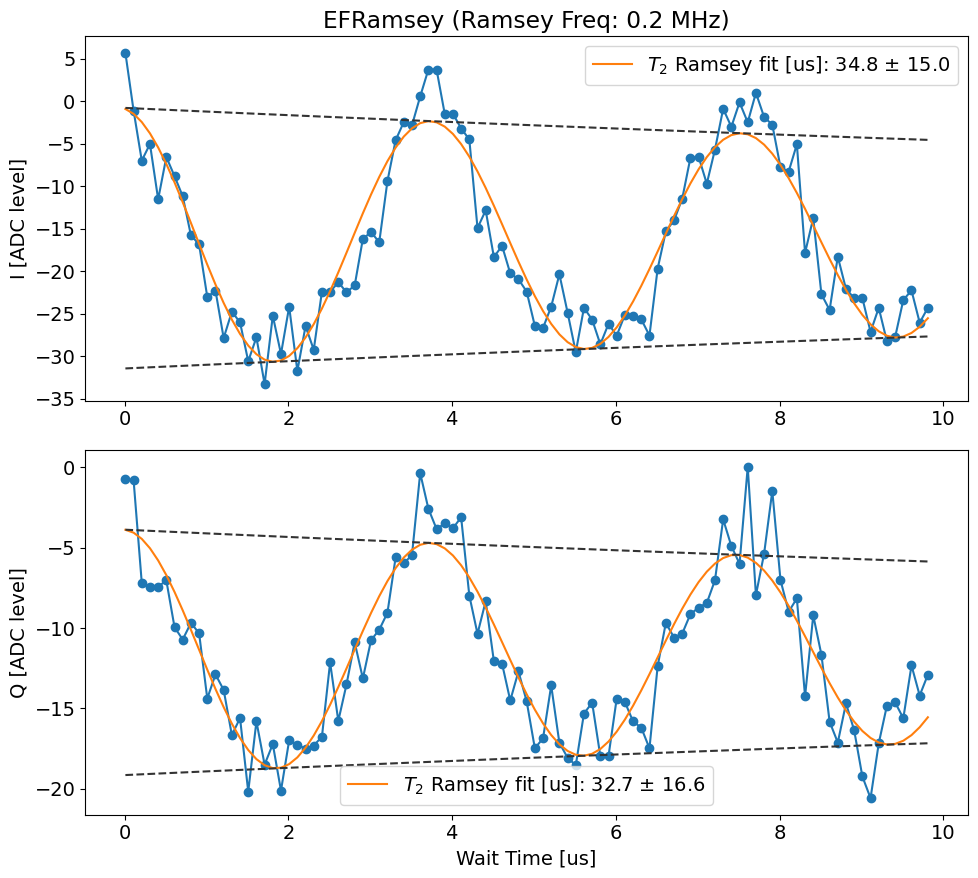

Current pi pulse frequency: 3422.700418494041
Fit frequency from I [MHz]: 0.26307407451478526 +/- 0.0021400270610534245
Suggested new pi pulse frequency from fit I [MHz]:
 	3422.6373444195265
 	3423.1634925685557
T2 Ramsey from fit I [us]: 34.81880934681112
Fit frequency from Q [MHz]: 0.2670752052456027 +/- 0.0026936000911010212
Suggested new pi pulse frequencies from fit Q [MHz]:
 	3422.6333432887955
 	3423.1674936992868
T2 Ramsey from fit Q [us]: 32.68370548286703


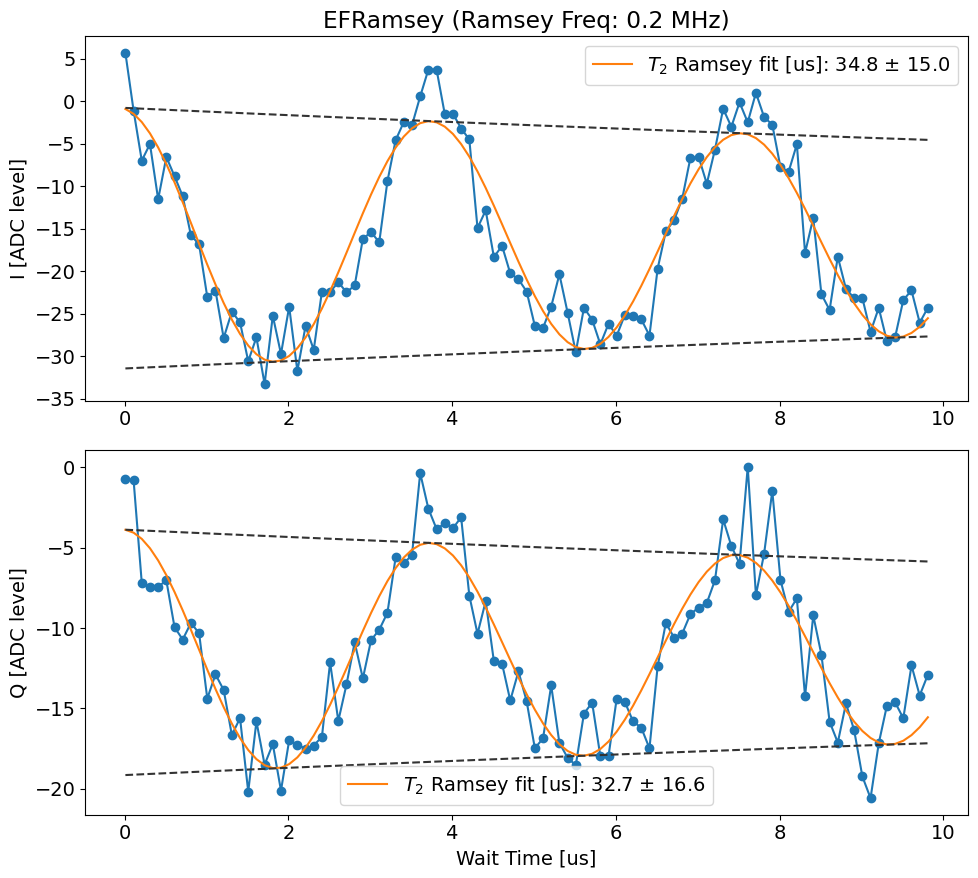

In [89]:
# Execute
# =================================
eframsey_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.RamseyExperiment,
    default_expt_cfg=eframsey_defaults,
    preprocessor=geramsey_preproc,  # Reuse ge preprocessor
    postprocessor=eframsey_postproc,
    job_client=client,
)

if expts_to_run['t2_ef']:
    t2ramsey_ef = eframsey_runner.execute(
        ramsey_freq=0.2, #0.2
        step = 0.1, #0.4 0.2
        relax_delay=2500,
        active_reset=True,
        expts = 100
    )
    t2ramsey_ef.display()

### Amplitude Rabi

We should probably use a cosine fit with fixed phase=0 instead of decaying sine with varying phase?

In [90]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
# Reuse ge defaults but with if_ef=True
efamprabi_defaults = AttrDict(deepcopy(amprabi_defaults))
efamprabi_defaults.if_ef = True
efamprabi_defaults.step = 40  # Typical ef amplitude step
efamprabi_defaults.expts = 150

def efamprabi_postproc(station, expt):
    station.hardware_cfg.device.qubit.pulses.pi_ef.gain = [expt.data['pi_gain_avgi']]
    station.hardware_cfg.device.qubit.pulses.hpi_ef.gain = [expt.data['hpi_gain_avgi']]
    print('Updated qubit ef pi and hpi gaussian gain!')
    station.snapshot_hardware_config(update_main=False)

Job submitted: JOB-20260814-00008 (queue position: 1)

[0.0s] Job JOB-20260814-00008: pending

[2.0s] Job JOB-20260814-00008: running
[WORKER] Loading AmplitudeRabiExperiment from experiments.single_qubit.amplitude_rabi
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00008_AmplitudeRabiExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 98%|█████████████████████████████████▍| 98280/100000 [04:05<00:04, 399.57it/s]
[253.3s] Job JOB-20260814-00008: completed
100%|█████████████████████████████████| 100000/100000 [04:10<00:00, 399.57it/s]
Attempted to init fitparam 4 to -22.344103486486485, which is out of bounds -5.056050359360333 to 70.60268407550268. Instead init to 32.773316858071176
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00008_AmplitudeRabiExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibr

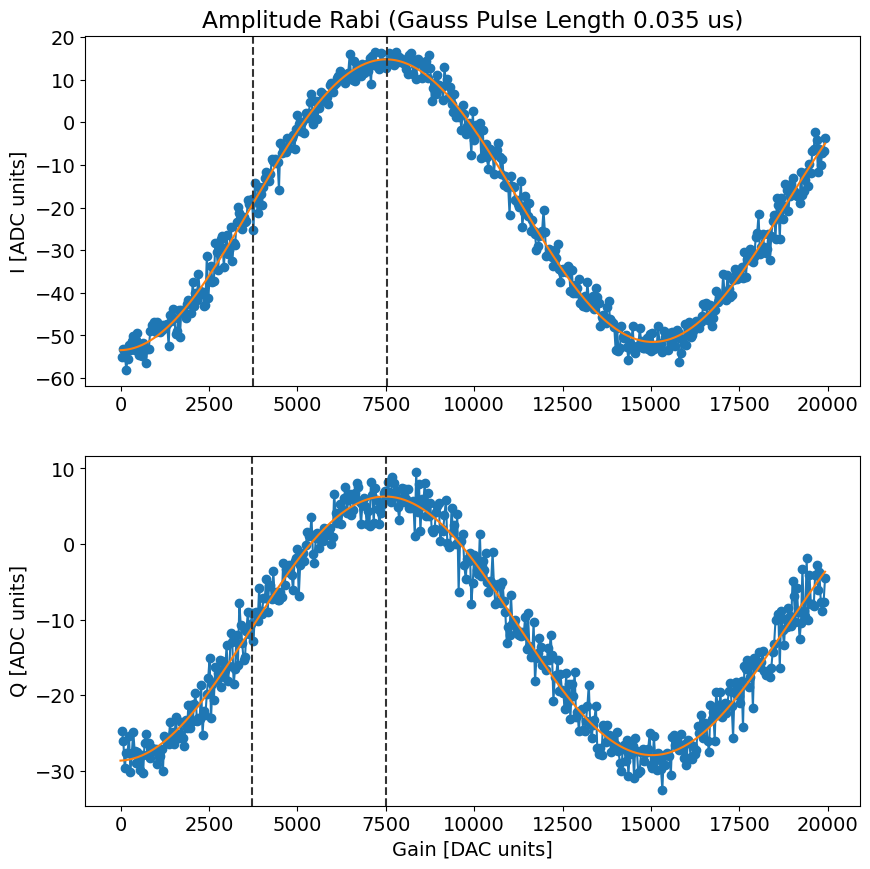

Pi gain from avgi data [dac units]: 7531
	Pi/2 gain from avgi data [dac units]: 3760
Pi gain from avgq data [dac units]: 7498
	Pi/2 gain from avgq data [dac units]: 3723


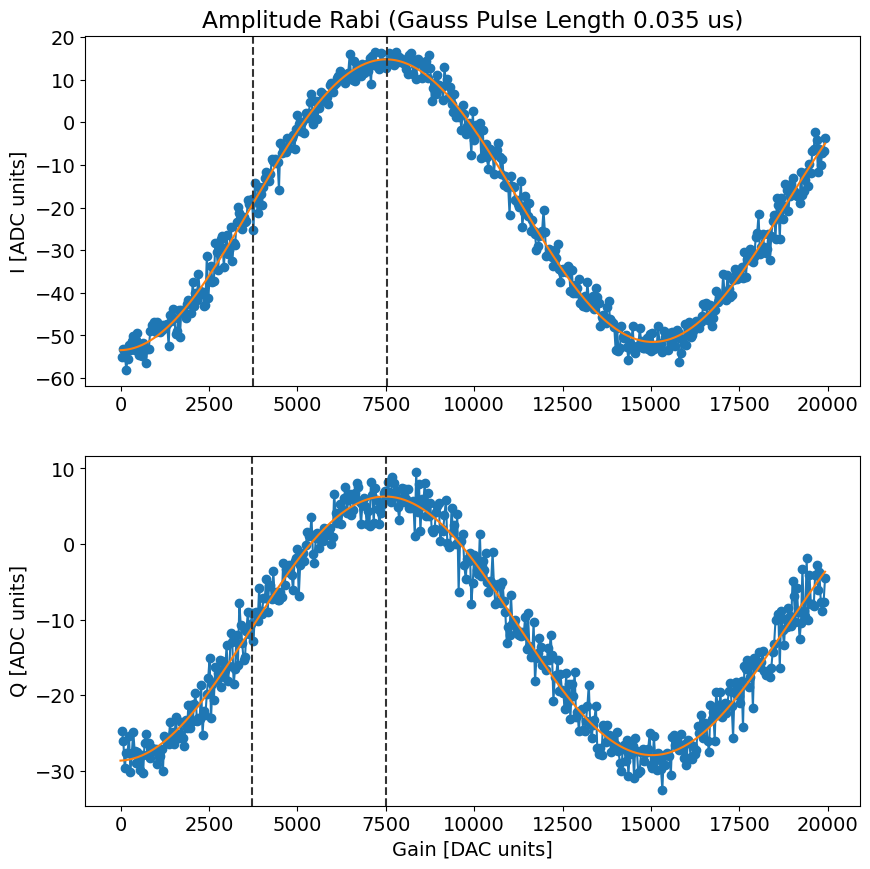

Job submitted: JOB-20260814-00009 (queue position: 1)

[0.0s] Job JOB-20260814-00009: pending

[3.4s] Job JOB-20260814-00009: running
[WORKER] Loading RamseyExperiment from experiments.single_qubit.t2_ramsey
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00009_RamseyExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
fge is  3566.089101467898
fef is  3422.6373444195265
 89%|███████████████████████████████▏   | 18018/20200 [00:45<00:05, 398.38it/s]
[52.9s] Job JOB-20260814-00009: completed
100%|███████████████████████████████████| 20200/20200 [00:50<00:00, 398.84it/s]
No echoes in the data
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00009_RamseyExperiment.h5
[h5_safe_data] dropped non-numeric keys: ['fit_envelope_avgi', 'fit_envelope_avgq', 'fit_envelope']
[WORKER] Saving expt object to: C:\experiments\260813_calibratio

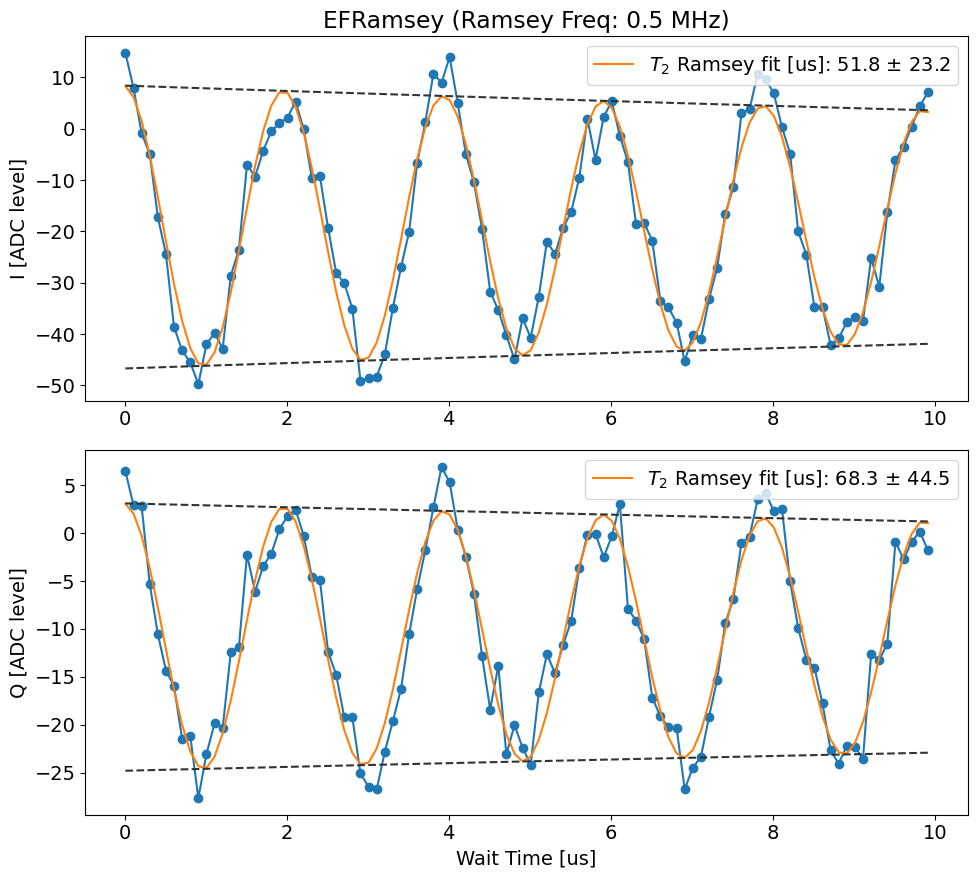

Current pi pulse frequency: 3422.6373444195265
Fit frequency from I [MHz]: 0.5065670291555793 +/- 0.0014626399658638828
Suggested new pi pulse frequency from fit I [MHz]:
 	3422.630777390371
 	3423.643911448682
T2 Ramsey from fit I [us]: 51.82222237322337
Fit frequency from Q [MHz]: 0.5065504115863924 +/- 0.0016193916880177552
Suggested new pi pulse frequencies from fit Q [MHz]:
 	3422.63079400794
 	3423.643894831113
T2 Ramsey from fit Q [us]: 68.31159944898606


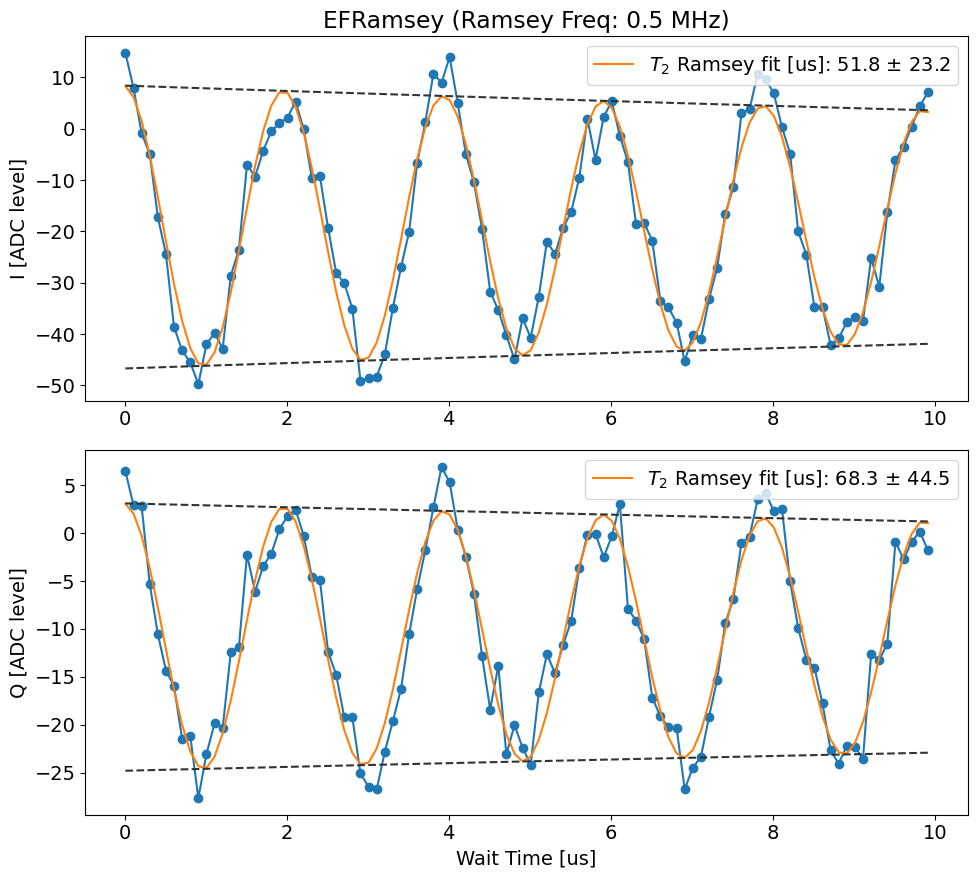

In [91]:
# Execute
# =================================
efamprabi_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.AmplitudeRabiExperiment,
    default_expt_cfg=efamprabi_defaults,
    preprocessor=amprabi_preproc,  # Reuse ge preprocessor
    postprocessor=efamprabi_postproc,
    job_client=client,
)

if expts_to_run['amplitude_ef']:
    amprabi_ef = efamprabi_runner.execute(
                relax_delay=2500,
                expts = 500
    )           
    amprabi_ef.display()
    
    # After amplitude calibration, do another T2 Ramsey to fine tune frequency
    t2_ramsey_ef_after_amp = eframsey_runner.execute(
        ramsey_freq=0.5,
        step = 0.1,
        relax_delay=2500,
    )
    t2_ramsey_ef_after_amp.display()

### Error Amplification

In [ ]:
# Error Amplification - Runner Pattern with CharacterizationRunner
# =====================================
error_amp_defaults = AttrDict(dict(
    reps=100,
    rounds=1,
    qubit=0,
    n_pulses=10,
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    relax_delay=2500,
    start=0,
    expts=10,
    step=100,
    parameter_to_test='gain',  # 'gain' or 'frequency'
    pulse_type=['qubit', 'ge', 'pi', 0],
    # Multiphoton-specific parameters
    man_no=1,  # Manipulate mode number
    pulse_name='pi',  # 'pi' or 'hpi'
))


def error_amp_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    
    expt_cfg.qubits = [expt_cfg.qubit]
    
    return expt_cfg

def error_amp_postproc(station, expt, state_fin='g'):
    """Update config based on error amplification results.
    
    For multiphoton transitions, updates the multiphoton config.
    For standard qubit calibration, updates the qubit pulse params.
    """
    expt_cfg = expt.cfg.expt
    parameter = expt_cfg.parameter_to_test
    pulse_name = expt_cfg.pulse_type[2]  # 'pi' or 'hpi'
    transition_key = expt_cfg.pulse_type[1] # 'ge' or 'ef'
    print(f'Processing error amplification for parameter: {parameter}, pulse: {pulse_name}')


    if state_fin == 'e':
        expt.analyze(data=expt.data, state_fin='e')
        expt.display(data=expt.data, state_fin='e')

    
    # Get the optimal value from the experiment data
    # Error amplification typically finds the value that minimizes error
    if 'optimal_value' in expt.data:
        optimal_val = expt.data['optimal_value']

    if 'fit_avgi' in expt.data:
        print('parameter:', parameter)
        if parameter == 'frequency':
            optimal_val = expt.data['fit_avgi'][2]
        elif parameter == 'gain':
            optimal_val = int(expt.data['fit_avgi'][2])
        else: 
            raise ValueError(f"Unknown parameter to test: {parameter}")

    else:
        # If no automatic extraction, user needs to analyze manually
        print('No automatic optimal value extraction. Please analyze the data manually.')
        return
    
    # Standard qubit update
    pulse_key = f'{pulse_name}_{transition_key}'
    freq_key = f"f_{transition_key}"
    if parameter == 'frequency':
        old_val = station.hardware_cfg.device.qubit[freq_key][0]
        station.hardware_cfg.device.qubit[freq_key][0] = optimal_val
        print(f'Updated qubit {freq_key} {parameter}: {old_val} -> {optimal_val}')
    elif parameter == 'gain':
        old_val = station.hardware_cfg.device.qubit.pulses[pulse_key]['gain'][0]
        station.hardware_cfg.device.qubit.pulses[pulse_key]['gain'][0] = optimal_val
        print(f'Updated qubit {pulse_key} {parameter}: {old_val} -> {optimal_val}')
        
error_amp_runner_qubit = CharacterizationRunner(
    station=station,
    ExptClass=meas.ErrorAmplificationExperiment,
    default_expt_cfg=error_amp_defaults,
    preprocessor=error_amp_preproc,
    postprocessor=error_amp_postproc,
    job_client=client,
    use_queue=True,
)

#### Frequency

In [ ]:
expts = 50 #50
band = 1 #2
freq_start = station.hardware_cfg.device.qubit['f_ef'][0] - band
# freq_start = 3569 - band
step = 2 * band / expts
print(f'Frequency start: {freq_start}, Step: {step}')



error_amp = error_amp_runner_qubit.execute(
    parameter_to_test='frequency',
    step=2 * band / expts, 
    start=freq_start,
    expts=expts,
    reps=50,
    pulse_type=['qubit', 'ef', 'pi', 0],
    # n_pulses=20,
)


#### Amplitude

In [ ]:
band = 500
expts = 25
gain_start = station.hardware_cfg.device.qubit.pulses.pi_ef.gain[0] - band
# gain_start = 10000
step = 2 * band / expts
print(f'Gain start: {gain_start}, Step: {step}')

error_amp = error_amp_runner_qubit.execute(
    parameter_to_test='gain',
    step=step,
    start=gain_start,
    expts=expts,
    reps=50,
    pulse_type=['qubit', 'ef', 'pi', 0],
)

### T1

In [61]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
t1_ef_defaults = AttrDict(dict(
    start=0,
    step=5,
    expts=100,
    reps=50,
    rounds=1,
    qubit=0,
    qubit_ef=True,
    normalize=False,
    relax_delay=2500,
))

def t1_ef_postproc(station, expt):
    station.hardware_cfg.device.qubit.T1_ef = [expt.data['fit_avgq'][3]]
    print('Updated qubit T1 ef!')
    station.snapshot_hardware_config(update_main=False)

Job submitted: JOB-20260813-00030 (queue position: 1)

[1.7s] Job JOB-20260813-00030: running
[WORKER] Loading T1Experiment from experiments.single_qubit.t1
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260813-00030_T1Experiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.5mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 66%|████████████████████████▏            | 3276/5000 [00:08<00:04, 373.20it/s]
[16.0s] Job JOB-20260813-00030: completed
100%|█████████████████████████████████████| 5000/5000 [00:13<00:00, 363.52it/s]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260813-00030_T1Experiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260813-00030_expt.pkl

Job completed! Data: C:\experiments\260813_calibration_after_recooldown\data\JOB-20260813-00030_T1Experiment.h5
Updated qubit T1 ef!
[CONFIG] Created new hardware_config versio

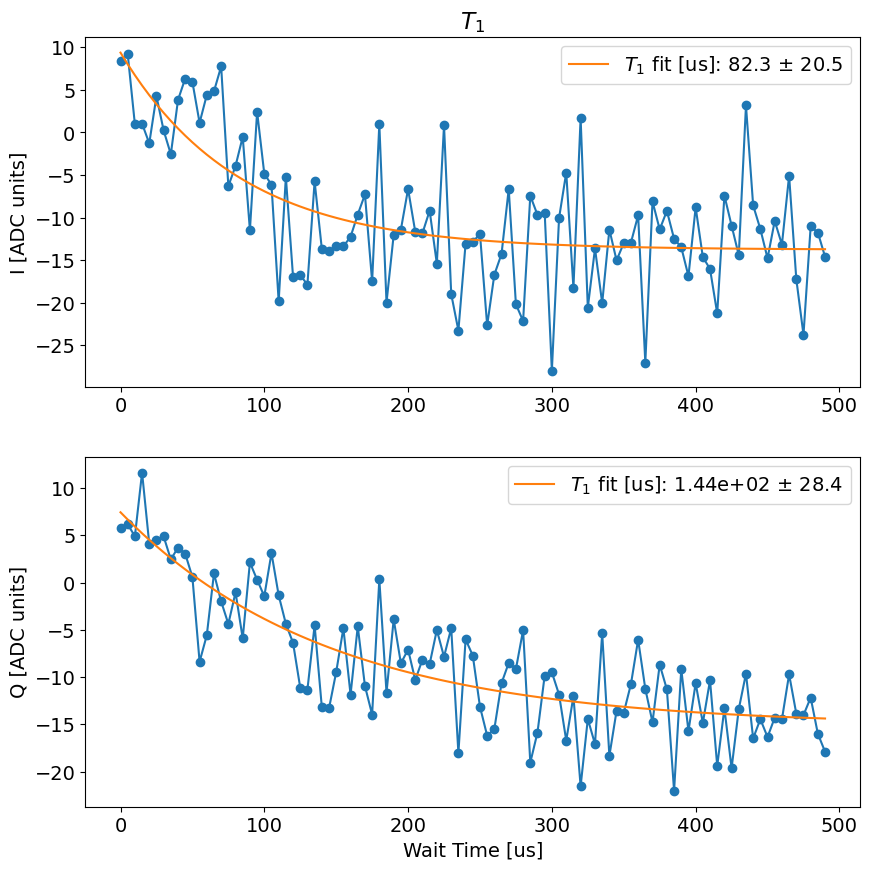

Fit T1 avgi [us]: 82.33714592708984
Fit T1 avgq [us]: 144.4942636280997


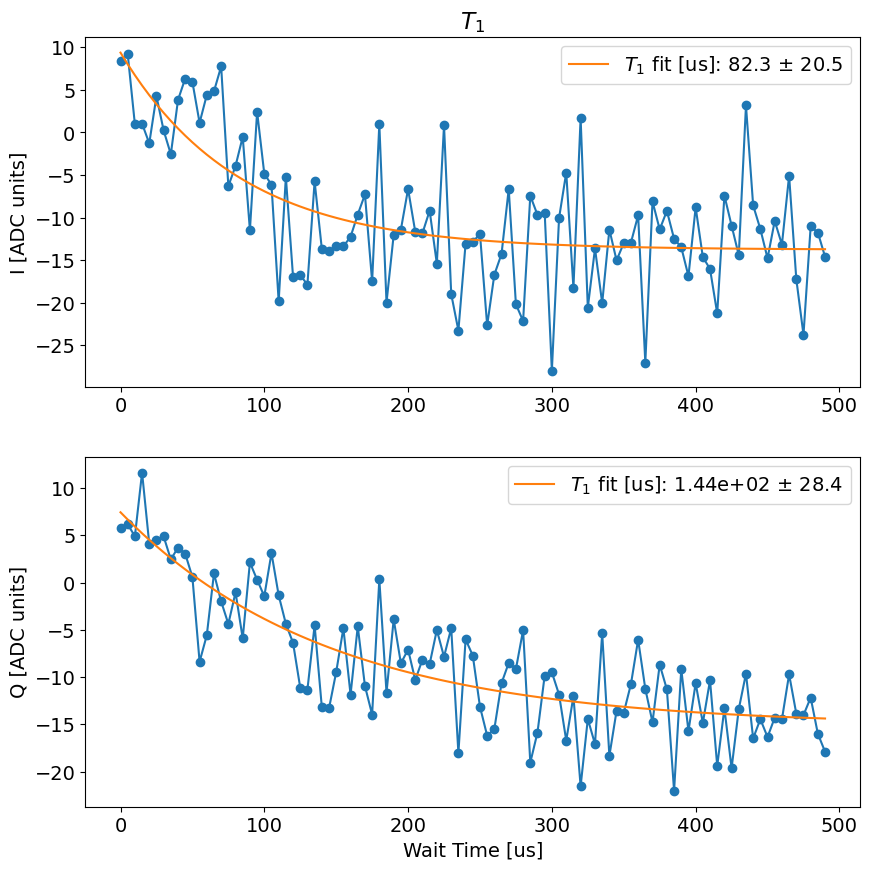

In [62]:
# Execute
# =================================
t1_ef_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.T1Experiment,
    default_expt_cfg=t1_ef_defaults,
    postprocessor=t1_ef_postproc,
    job_client=client,
)

if expts_to_run['t1_ef']:
    t1_ef = t1_ef_runner.execute()
    t1_ef.display()

In [ ]:
station.preview_config_update()
# station.snapshot_hardware_config(update_main=True)

In [ ]:
station.snapshot_hardware_config()

## Slow pi ge calibration

Run the fixed-gain length Rabi first, then the slow-pulse Ramsey. Both postprocessors update only the in-memory station config. Save YAML manually after the calibration is finished.

In [ ]:
from pathlib import Path
import fitting.fitting as fitter
from fitting.fit_display_classes import LengthRabiFitting, RamseyFitting
from experiments.qsim.t2_cavity_fluxexcursion import (
    SlowLengthRabiProgram,
    SlowPiGeRamseyProgram,
)


slow_pi_ge_length_defaults = AttrDict(dict(
    reps=200,
    rounds=1,
    qubits=[0],
    swept_params=['length_to_sweep'],
    length_to_sweeps=np.linspace(0.01, 30., 151).tolist(),
    active_reset=False,
    prepulse=False,
    postpulse=False,
    init_stor=0,
    ro_stor=0,
    normalize=False,
    relax_delay=2500,
))


def slow_pi_ge_length_preproc(
        station, default_expt_cfg, fixed_gain=None, lengths=None, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    pulse = station.hardware_cfg.device.qubit.pulses.slow_pi_ge
    if pulse.type[0] != 'flat_top':
        raise ValueError(
            f"slow_pi_ge must be flat_top, got {pulse.type[0]!r}"
        )

    if fixed_gain is not None:
        pulse.gain[0] = int(fixed_gain)
    if lengths is not None:
        expt_cfg.length_to_sweeps = np.asarray(
            lengths, dtype=float
        ).tolist()

    print(
        'slow_pi_ge fixed gain =', pulse.gain[0],
        ', ramp sigma =', pulse.sigma[0], 'us'
    )
    return expt_cfg


def slow_pi_ge_length_postproc(station, expt):
    analysis = LengthRabiFitting(
        data=expt.data,
        config=expt.cfg,
        station=station,
    )
    analysis.analyze()

    i_range = np.ptp(np.asarray(expt.data['avgi'], dtype=float))
    q_range = np.ptp(np.asarray(expt.data['avgq'], dtype=float))
    fit_channel = 'avgi' if i_range >= q_range else 'avgq'
    fit = np.asarray(
        expt.data[f'fit_{fit_channel}'], dtype=float
    ).copy()

    pi_length, hpi_length = analysis._calculate_pi_lengths(fit)
    period = 1. / abs(fit[1])
    first_length = float(np.min(expt.data['xpts']))
    while hpi_length < first_length:
        pi_length += period
        hpi_length += period

    last_length = float(np.max(expt.data['xpts']))
    if pi_length > last_length:
        raise RuntimeError(
            f'Fitted pi length {pi_length:.6f} us is outside '
            f'the measured range ending at {last_length:.6f} us'
        )

    pulse = station.hardware_cfg.device.qubit.pulses.slow_pi_ge
    old_length = float(pulse.length[0])
    pulse.length[0] = float(pi_length)

    expt.data['slow_pi_ge_fit_channel'] = fit_channel
    expt.data['pi_length'] = float(pi_length)
    expt.data['hpi_length'] = float(hpi_length)
    print(
        f'Updated in-memory slow_pi_ge length: '
        f'{old_length:.6f} -> {pi_length:.6f} us'
    )
    print(f'slow_pi_ge hpi length: {hpi_length:.6f} us')
    print('YAML was not written.')


In [ ]:
slow_pi_ge_length_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=SlowLengthRabiProgram,
    default_expt_cfg=slow_pi_ge_length_defaults,
    preprocessor=slow_pi_ge_length_preproc,
    postprocessor=slow_pi_ge_length_postproc,
    job_client=client,
    use_queue=True,
)


In [ ]:
# Keep the gain low and calibrate the pulse by changing its length.
# slow_pi_ge_fixed_gain = 15
slow_pi_ge_lengths = np.linspace(0.01, 30., 151)

slow_pi_ge_length_rabi = slow_pi_ge_length_runner.execute(
    # fixed_gain=slow_pi_ge_fixed_gain,
    lengths=slow_pi_ge_lengths,
    postprocess=True,
)

x = np.asarray(slow_pi_ge_length_rabi.data['xpts'], dtype=float)
x_fit = np.linspace(x.min(), x.max(), 1000)
pi_length = float(slow_pi_ge_length_rabi.data['pi_length'])
hpi_length = float(slow_pi_ge_length_rabi.data['hpi_length'])
file_name = Path(slow_pi_ge_length_rabi.fname).name

fig, axes = plt.subplots(2, 1, figsize=(9, 8), sharex=True)
for ax, channel, label in zip(
        axes, ['avgi', 'avgq'], ['I', 'Q']
):
    ax.plot(x, slow_pi_ge_length_rabi.data[channel], 'o-', label=label)
    fit = slow_pi_ge_length_rabi.data[f'fit_{channel}']
    ax.plot(x_fit, fitter.decaysin(x_fit, *fit), label='fit')
    ax.axvline(hpi_length, color='0.3', ls='--', label='hpi')
    ax.axvline(pi_length, color='0.3', ls=':', label='pi')
    ax.set_ylabel(f'{label} [ADC units]')
    ax.legend()

axes[0].set_title(file_name)
axes[-1].set_xlabel('slow pi ge flat-top length (us)')
plt.tight_layout()
plt.show()


### Slow-pulse Ramsey

In [ ]:
slow_pi_ge_ramsey_defaults = AttrDict(dict(
    ramsey_freq=0.2,
    wait_times=(
        0.01 + 0.2 * np.arange(101)
    ).tolist(),
    hpi_length=None,
    reps=200,
    rounds=1,
    qubits=[0],
    swept_params=['wait_time'],
    active_reset=False,
    prepulse=False,
    postpulse=False,
    init_stor=0,
    ro_stor=0,
    normalize=False,
    relax_delay=2500,
    checkEF=False,
    echoes=[False, 0],
))


def slow_pi_ge_ramsey_preproc(
        station, default_expt_cfg, wait_times=None, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)

    if wait_times is not None:
        expt_cfg.wait_time_sweeps = np.asarray(
            wait_times, dtype=float
        ).tolist()
    if expt_cfg.hpi_length is None:
        raise ValueError(
            'Pass the hpi_length measured by the slow length Rabi'
        )

    return expt_cfg


def slow_pi_ge_ramsey_postproc(station, expt):
    analysis = RamseyFitting(
        data=expt.data,
        config=expt.cfg,
        station=station,
    )
    analysis.analyze()

    i_range = np.ptp(np.asarray(expt.data['avgi'], dtype=float))
    q_range = np.ptp(np.asarray(expt.data['avgq'], dtype=float))
    fit_channel = 'avgi' if i_range >= q_range else 'avgq'
    frequency_correction = float(min(
        expt.data[f'f_adjust_ramsey_{fit_channel}'],
        key=abs,
    ))

    old_frequency = float(
        station.hardware_cfg.device.qubit.f_ge[0]
    )
    new_frequency = old_frequency + frequency_correction
    station.hardware_cfg.device.qubit.f_ge[0] = new_frequency

    expt.data['slow_pi_ge_fit_channel'] = fit_channel
    expt.data['drive_frequency'] = old_frequency
    expt.data['frequency_correction'] = frequency_correction
    print(
        f'Updated in-memory qubit f_ge: '
        f'{old_frequency:.9f} -> {new_frequency:.9f} MHz'
    )
    print('YAML was not written.')


In [ ]:
slow_pi_ge_ramsey_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    ExptProgram=SlowPiGeRamseyProgram,
    default_expt_cfg=slow_pi_ge_ramsey_defaults,
    preprocessor=slow_pi_ge_ramsey_preproc,
    postprocessor=slow_pi_ge_ramsey_postproc,
    job_client=client,
    use_queue=True,
)


In [ ]:
# Repeat length Rabi -> Ramsey as needed.
slow_pi_ge_ramsey_freq = 0.2
slow_pi_ge_ramsey_wait_times = (
    0.01 + 0.2 * np.arange(101)
)
slow_pi_ge_hpi_length = float(
    slow_pi_ge_length_rabi.data['hpi_length']
)

slow_pi_ge_ramsey = slow_pi_ge_ramsey_runner.execute(
    ramsey_freq=slow_pi_ge_ramsey_freq,
    wait_times=slow_pi_ge_ramsey_wait_times,
    hpi_length=slow_pi_ge_hpi_length,
    postprocess=True,
)



In [ ]:

slow_pi_ge_ramsey_analysis = RamseyFitting(
    data=slow_pi_ge_ramsey.data,
    config=slow_pi_ge_ramsey.cfg,
    station=station,
)



slow_pi_ge_ramsey_analysis.display(
    f_test=slow_pi_ge_ramsey.data['drive_frequency'],
    title_str=Path(slow_pi_ge_ramsey.fname).stem,
)

# Manipulate

## Spectroscopy

In [373]:
f0g1spec_defaults = AttrDict(dict(
    start=None,  # Will be computed in preprocessor from ds_storage
    step=0.2,
    expts=200,
    reps=100,
    rounds=1,
    length=1,
    gain=3000,
    pulse_type='gaussian',
    qubit_f=True,
    qubits=[0],
    prepulse=False,
    relax_delay=200,
))

def f0g1spec_preproc(station, default_expt_cfg, man_mode_no=1, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.man_mode_no = man_mode_no  # Store for postprocessor
    expt_cfg.update(kwargs)
    
    # Compute start frequency from dataset if not provided
    if expt_cfg.start is None:
        expt_cfg.start = station.ds_storage.get_freq('M' + str(man_mode_no)) - 20
    
    return expt_cfg

def f0g1spec_postproc(station, expt):
    man_mode_no = expt.cfg.expt.man_mode_no
    station.ds_storage.update_freq('M' + str(man_mode_no), expt.data['fit_avgi'][2])
    station.hardware_cfg.device.multiphoton['pi']['fn-gn+1']['frequency'][0] = expt.data['fit_avgi'][2]
    print(f"Updated man f0g1 freq to: {station.ds_storage.get_freq('M' + str(man_mode_no))}")
    station.snapshot_hardware_config(update_main=False)
    station.snapshot_man1_storage_swap(update_main=False)

In [ ]:
# station.yoko_coupler.ramp_current(0.5e-3, sweeprate=0.0001)

Running pulse probe f0g1 for mode 1
Job submitted: JOB-20260817-00157 (queue position: 1)

[0.0s] Job JOB-20260817-00157: pending

[2.2s] Job JOB-20260817-00157: running
[WORKER] Loading PulseProbeF0g1SpectroscopyExperiment from experiments.single_qubit.pulse_probe_f0g1_spectroscopy
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00157_PulseProbeF0g1SpectroscopyExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 90%|███████████████████████████████▌   | 18018/20000 [00:45<00:04, 399.52it/s]
[57.3s] Job JOB-20260817-00157: completed
100%|███████████████████████████████████| 20000/20000 [00:50<00:00, 399.44it/s]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00157_PulseProbeF0g1SpectroscopyExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260817-0

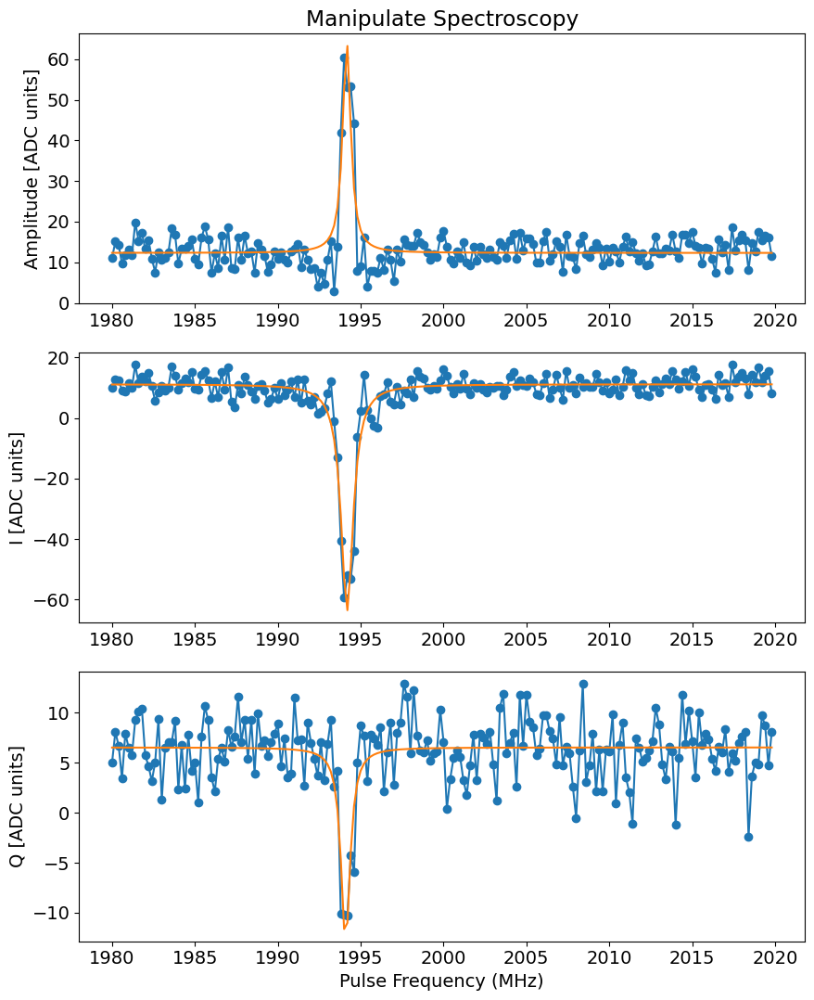

Found peak in amps at [MHz] 1994.15869067624, HWHM 0.29288205679874363
Found peak in I at [MHz] 1994.1814652226217, HWHM -0.4458579074798011
Found peak in Q at [MHz] 1994.0894434142422, HWHM 0.33550960992198753


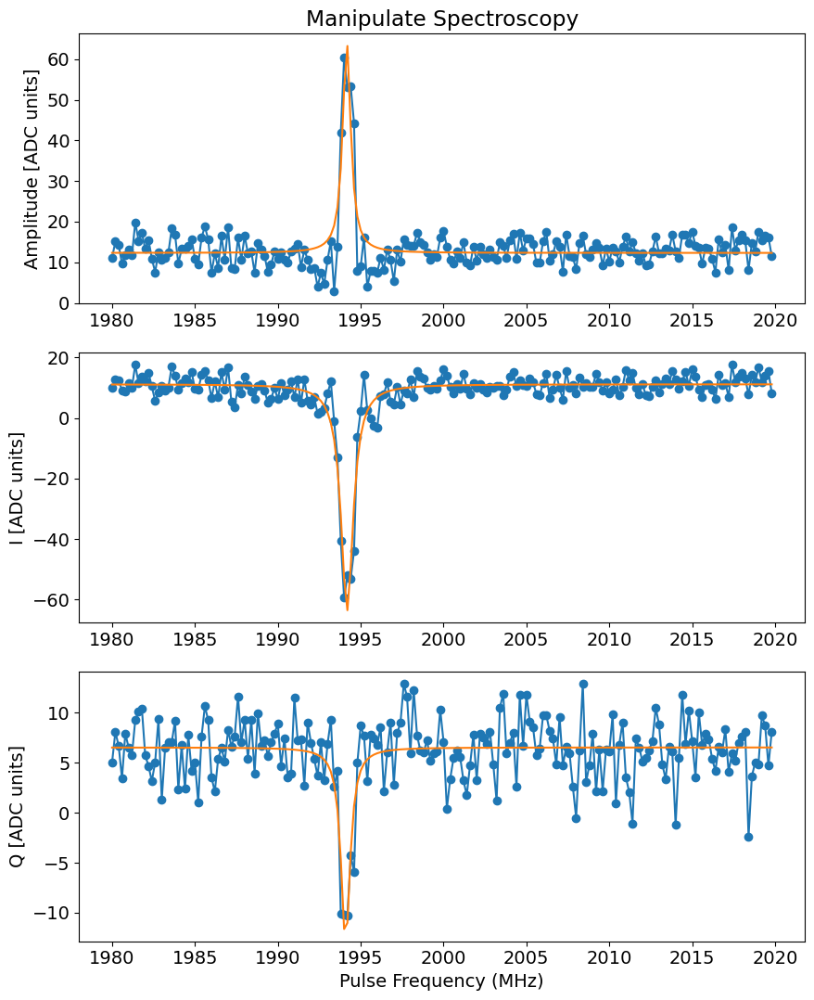

In [374]:
# Execute
# =================================
f0g1spec_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.PulseProbeF0g1SpectroscopyExperiment,
    default_expt_cfg=f0g1spec_defaults,
    preprocessor=f0g1spec_preproc,
    postprocessor=f0g1spec_postproc,
    job_client=client,
)

man_specs = [None] * len(expts_to_run['man_modes'])

for i in range(len(expts_to_run['man_modes'])):
    if expts_to_run['pulse_probe_f0g1']:
        print(f'Running pulse probe f0g1 for mode {i+1}')
        man_specs[i] = f0g1spec_runner.execute(
            man_mode_no=i+1,
            go_kwargs=dict(progress=True),
            relax_delay=2500,
            start = 1980
        )
        man_specs[i].display()


In [ ]:
station.update_all_station_snapshots()
# station.snapshot_hardware_config(update_main=True)
# station.snapshot_multiphoton_config(update_main=True)

## Find Frequency (Chevron)


In [399]:
chevron_defaults = AttrDict(dict(
    start=0, # time start in us
    step=0.1, # time step in us
    expts=25, # number of time points
    reps=100,
    rounds=1,
    qubits=[0],
    gain=None, # Leave as None to use current value in dataset
    ramp_sigma=0.005,
    use_arb_waveform=False,
    pi_ge_before=True,
    pi_ef_before=True,
    pi_ge_after=False,
    normalize=False,
    active_reset=False,
    check_man_reset=[False, 0],
    check_man_reset_pi=[],
    prepulse=False,
    pre_sweep_pulse=[],
    err_amp_reps=0,
    swap_lossy=False,
))


def f0g1_chevron_postproc(station, mother_expt):
    expt_cfg = mother_expt.cfg.expt
    expt_cfg.man_mode_no = 1
    stor_name = f'M{expt_cfg.man_mode_no}'

    from fitting.fit_display_classes import ChevronFitting

    chevron_analysis = ChevronFitting(
        frequencies=mother_expt.data['freq_sweep'],
        time=mother_expt.data['xpts'][0],
        response_matrix=mother_expt.data['avgi'],
        config=station.hardware_cfg,
        station=station,
    )

    chevron_analysis.analyze()
    
    best_freq = chevron_analysis.results.get('best_frequency_contrast')
        
    if best_freq:
        print(f"Best frequency found: {best_freq:.4f} MHz")
        station.ds_storage.update_freq(stor_name, best_freq)
        station.hardware_cfg.device.multiphoton['pi']['fn-gn+1']['frequency'][0] = best_freq
        print(f"Updated {stor_name} frequency to {best_freq:.4f} MHz (ds_storage and hardware_cfg)")

        pi_len = abs(np.pi / chevron_analysis.results['best_fit_params_period']['omega'])
        station.ds_storage.update_pi(stor_name, pi_len)
        station.hardware_cfg.device.multiphoton['pi']['fn-gn+1']['length'][0] = pi_len
        print('Updated the pi length to:', pi_len, "(ds_storage and hardware_cfg)")

        station.ds_storage.update_h_pi(stor_name, pi_len / 2)
        print('Updated the h_pi length to:', pi_len / 2, "(ds_storage)")

        gain = expt_cfg.get('gain', station.ds_storage.get_gain(stor_name))
        station.ds_storage.update_gain(stor_name, gain)
        station.hardware_cfg.device.multiphoton['pi']['fn-gn+1']['gain'][0] = gain
        print('Updated gain to:', gain)
    mother_expt.analysis = chevron_analysis
    chevron_analysis.display_results()
    station.snapshot_man1_storage_swap(update_main=False)
    station.snapshot_hardware_config(update_main=False)


runner = SweepRunner(
    station=station,
    ExptClass=meas.LengthRabiGeneralF0g1Experiment,
    default_expt_cfg=chevron_defaults,
    sweep_param='freq',
    live_plot=False,
    # preprocessor=my_preproc,
    # postprocessor=f0g1_chevron_postproc,
    job_client=client,
)

Sweep: freq from 1991.1814652226217 to 1997.1814652226217 (11 pts)
  File: C:\experiments\260813_calibration_after_recooldown\data\00006_LengthRabiGeneralF0g1Experiment_sweep.h5
  Submitting 11 jobs...
Job submitted: JOB-20260817-00158 (queue position: 1)
Job submitted: JOB-20260817-00159 (queue position: 2)
Job submitted: JOB-20260817-00160 (queue position: 3)
Job submitted: JOB-20260817-00161 (queue position: 4)
Job submitted: JOB-20260817-00162 (queue position: 5)
Job submitted: JOB-20260817-00163 (queue position: 6)
Job submitted: JOB-20260817-00164 (queue position: 7)
Job submitted: JOB-20260817-00165 (queue position: 8)
Job submitted: JOB-20260817-00166 (queue position: 9)
Job submitted: JOB-20260817-00167 (queue position: 10)
Job submitted: JOB-20260817-00168 (queue position: 11)
  All 11 jobs submitted. Waiting for results...
  [1/11] freq=1991.1815 [WORKER] Loading LengthRabiGeneralF0g1Experiment from experiments.single_qubit.length_rabi_f0g1_general
[WORKER] Creating experime

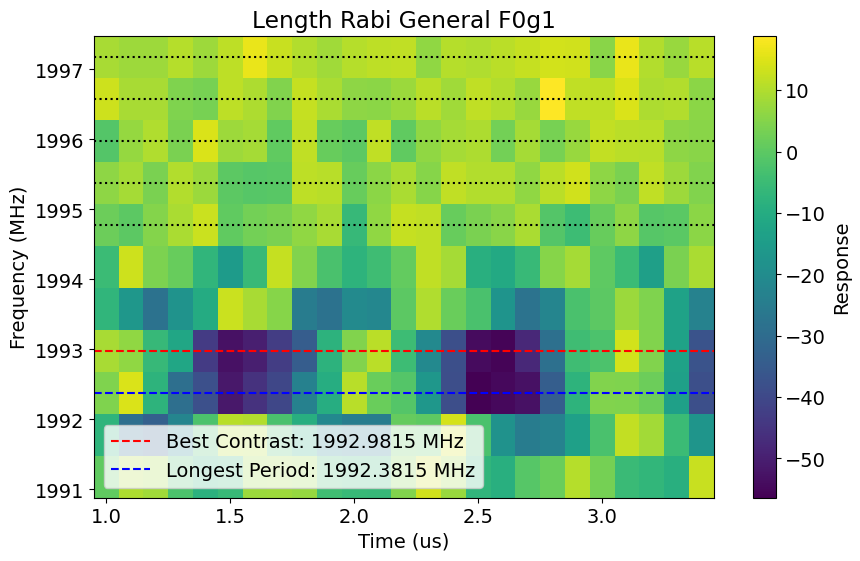

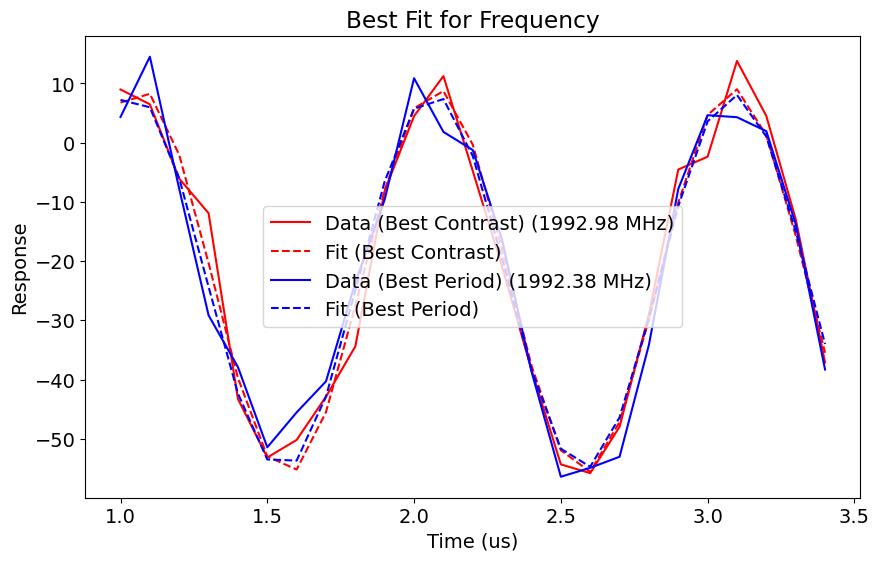

[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\Jonginn\QubitCalibration\2026\08\2026-08-17.md


In [376]:
# coarse sweep
f0g1_chevron = runner.execute(
    sweep_start=station.ds_storage.get_freq('M1') - 3,
    sweep_stop=station.ds_storage.get_freq('M1') + 3,
    sweep_npts=11,
    gain = station.ds_storage.get_gain('M1'),
    start = 1, # time start in us
    batch=True,
)

uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
Best frequency found: 1992.9815 MHz
Updated M1 frequency to 1992.9815 MHz (ds_storage and hardware_cfg)
Updated the pi length to: 0.5122622412794292 (ds_storage and hardware_cfg)
Updated the h_pi length to: 0.2561311206397146 (ds_storage)
Updated gain to: 8000


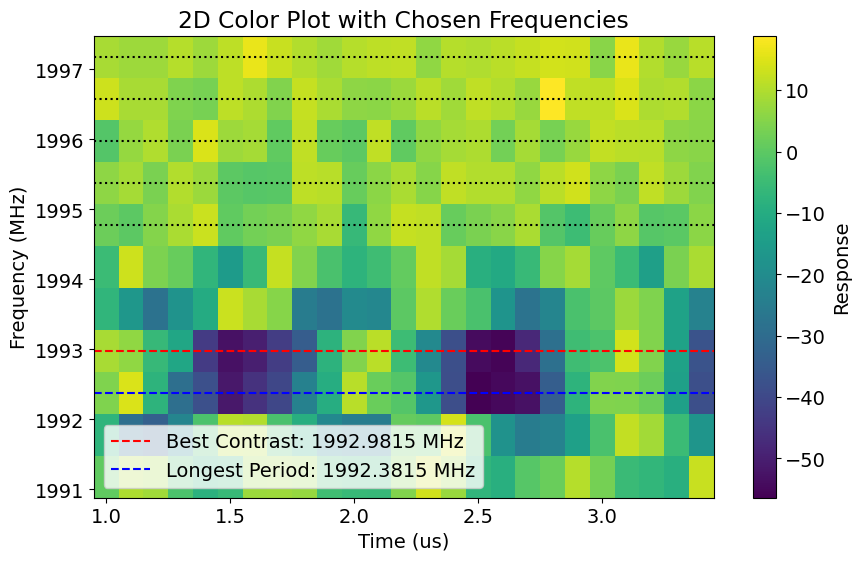

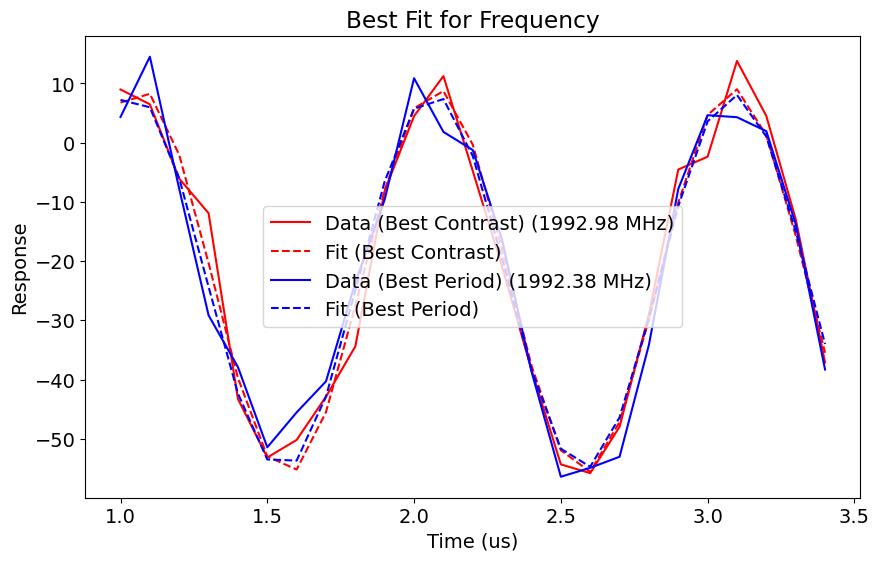

[CONFIG] Created new man1_storage_swap version CFG-M1-20260817-00051
[CONFIG] Created new hardware_config version CFG-HW-20260817-00027


In [377]:
f0g1_chevron_postproc(station, f0g1_chevron)

Sweep: freq from 1992.4814652226216 to 1993.4814652226216 (11 pts)
  File: C:\experiments\260813_calibration_after_recooldown\data\00007_LengthRabiGeneralF0g1Experiment_sweep.h5
  Submitting 11 jobs...
Job submitted: JOB-20260817-00169 (queue position: 1)
Job submitted: JOB-20260817-00170 (queue position: 2)
Job submitted: JOB-20260817-00171 (queue position: 3)
Job submitted: JOB-20260817-00172 (queue position: 4)
Job submitted: JOB-20260817-00173 (queue position: 5)
Job submitted: JOB-20260817-00174 (queue position: 6)
Job submitted: JOB-20260817-00175 (queue position: 7)
Job submitted: JOB-20260817-00176 (queue position: 8)
Job submitted: JOB-20260817-00177 (queue position: 9)
Job submitted: JOB-20260817-00178 (queue position: 10)
Job submitted: JOB-20260817-00179 (queue position: 11)
  All 11 jobs submitted. Waiting for results...
  [1/11] freq=1992.4815 [WORKER] Loading LengthRabiGeneralF0g1Experiment from experiments.single_qubit.length_rabi_f0g1_general
[WORKER] Creating experime

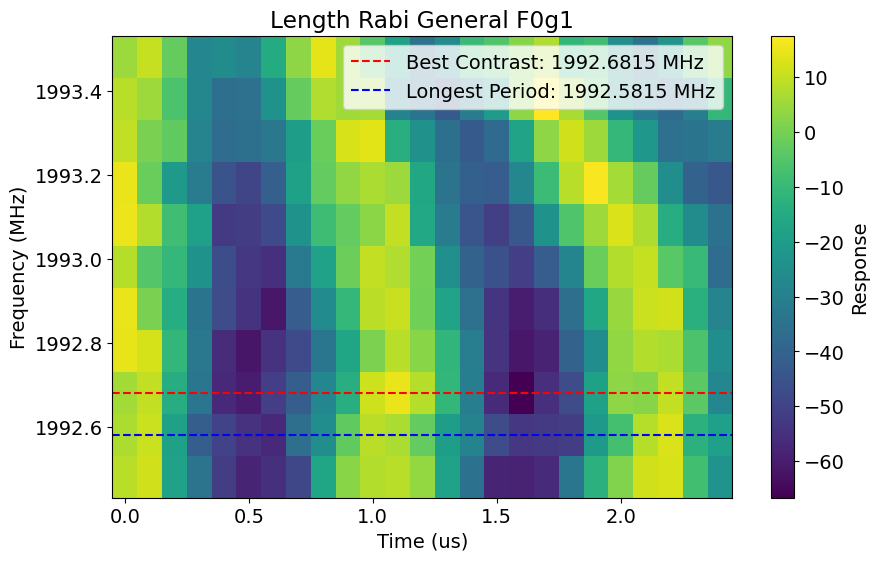

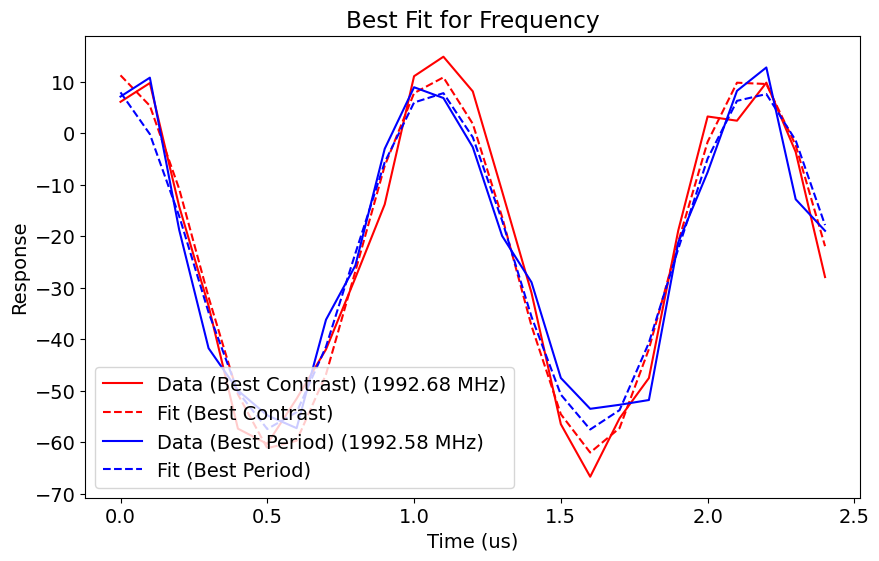

[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\Jonginn\QubitCalibration\2026\08\2026-08-17.md


In [378]:
# fine sweep
f0g1_chevron = runner.execute(
    sweep_start=station.ds_storage.get_freq('M1') - 0.5,
    sweep_stop=station.ds_storage.get_freq('M1') + 0.5,
    sweep_npts=11,
    gain = station.ds_storage.get_gain('M1'),
    # start = 1, # time start in us
    # coupler_current=coupler_current,
    reps=75,
    batch=True,
)

Best frequency found: 1992.6815 MHz
Updated M1 frequency to 1992.6815 MHz (ds_storage and hardware_cfg)
Updated the pi length to: 0.5476647844018241 (ds_storage and hardware_cfg)
Updated the h_pi length to: 0.27383239220091204 (ds_storage)
Updated gain to: 8000


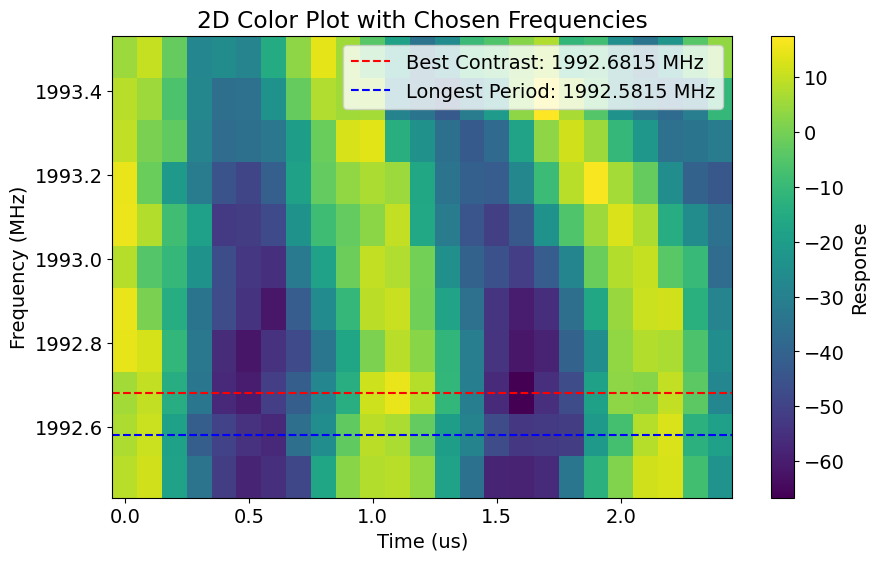

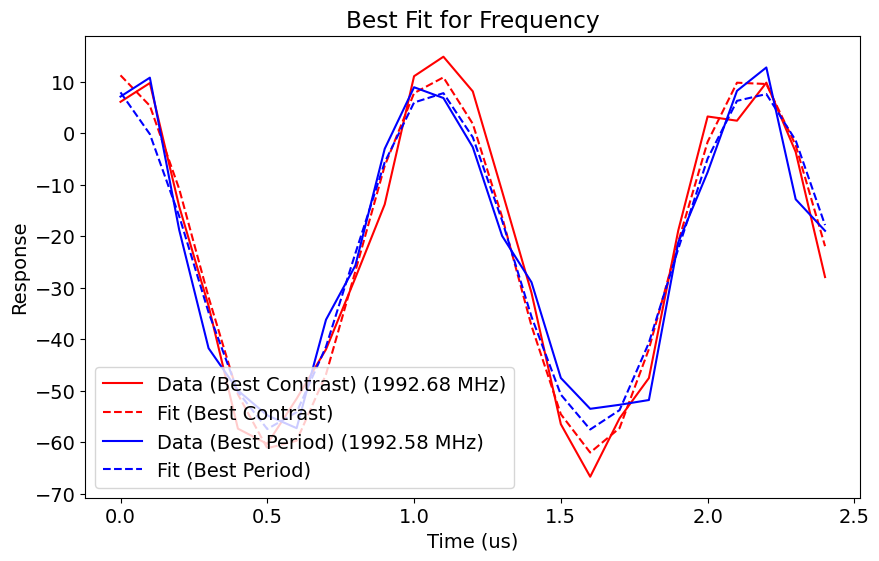

[CONFIG] Created new man1_storage_swap version CFG-M1-20260817-00052
[CONFIG] Created new hardware_config version CFG-HW-20260817-00028


In [379]:
f0g1_chevron_postproc(station, f0g1_chevron)

In [ ]:
# station.hard

## Error amplification

In [168]:
# freq_to_update = 2001.6025
# length_to_update = 0.5850045121893807

# station.hardware_cfg.device.multiphoton.pi['fn-gn+1'].frequency[0] = freq_to_update
# station.hardware_cfg.device.multiphoton.pi['fn-gn+1'].length[0] = length_to_update
# station.ds_storage.update_freq('M1', freq_to_update)
# station.ds_storage.update_pi('M1', length_to_update)
# station.ds_storage.update_h_pi('M1', length_to_update / 2)

Job submitted: JOB-20260817-00191 (queue position: 1)

[0.0s] Job JOB-20260817-00191: pending

[2.0s] Job JOB-20260817-00191: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00191_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 86%|█████████████████████████████████████▋      | 6/7 [02:01<00:20, 20.19s/it]
[145.2s] Job JOB-20260817-00191: completed
100%|████████████████████████████████████████████| 7/7 [02:21<00:00, 20.18s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00191_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260817-00191_expt.pkl

Job completed! Data: C:\experiments\260813_calibration

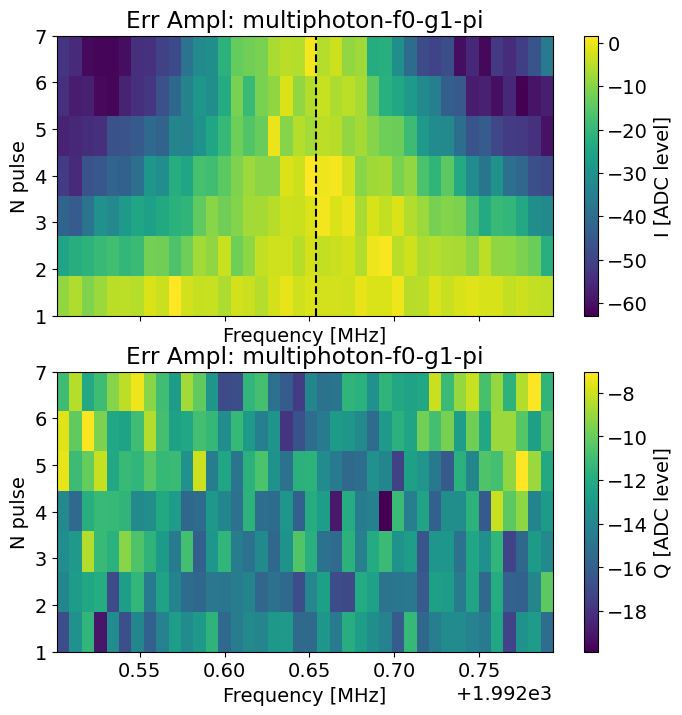

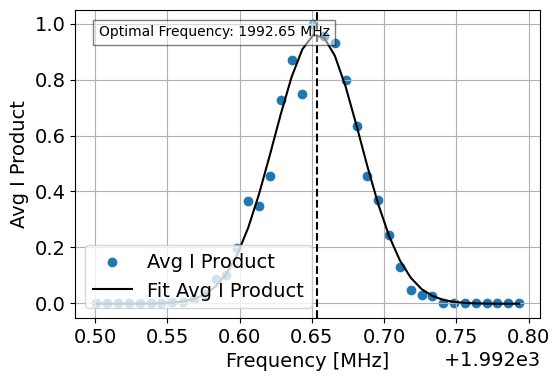

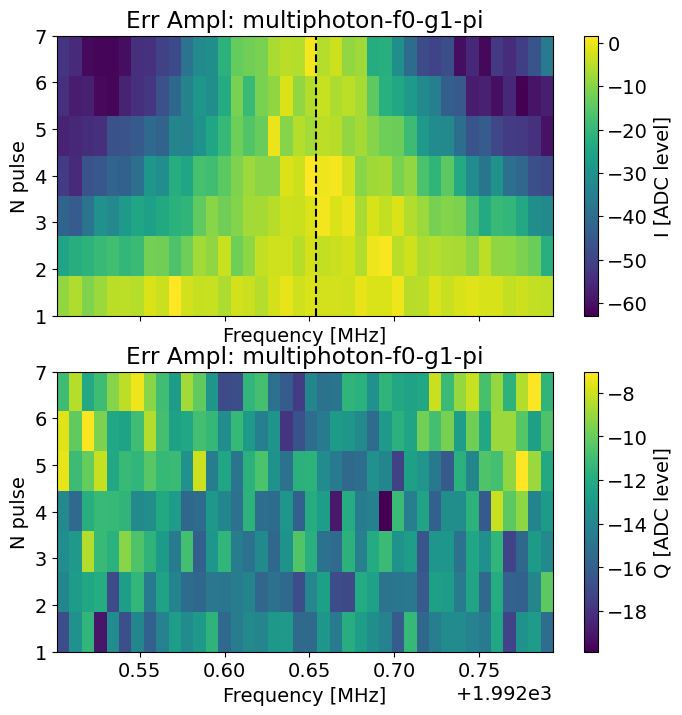

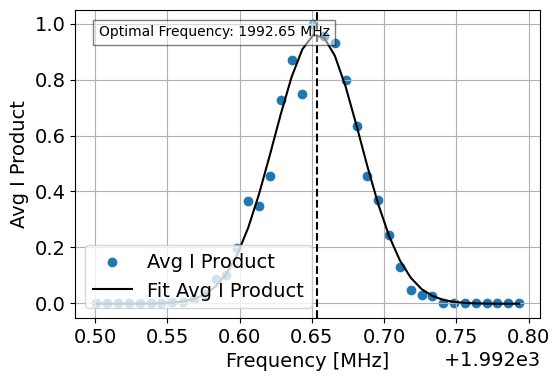

In [387]:
# Manipulate/Error Amplification - New Pattern with CharacterizationRunner
span = 0.3
expts = 40


center_freq = station.ds_storage.get_freq('M1')
start = center_freq - span/2
steps = span/expts


# Configuration defaults
error_amp_defaults = AttrDict(dict(
    start=start,
    expts=expts,
    step=steps, # 0.025
    # start=1984,
    # expts=40,
    # step=0.025, # 0.025
    reps=100,
    rounds=1,
    qubit=0,
    qubits=[0],
    n_pulses=7,
    sideband = 'f0-g1', #should be in the format of 'fn-gn+1' 
    parameter_to_test='frequency',
    pulse_type= None, # if this is None, will be set to ['multiphoton', sideband, 'pi', 0] in preproc
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    relax_delay=2500,
))

def error_amp_preproc(station, 
                      default_expt_cfg, 
                      **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    if expt_cfg.pulse_type is None:
        expt_cfg.pulse_type = ['multiphoton', expt_cfg.sideband, 'pi', 0]
    return expt_cfg

def error_amp_postproc(station, expt):
    """
    Postprocessor for error amplification.
    Analyze with custom parameters.
    """
    sideband = expt.cfg.expt.sideband
    _sideband = sideband[0] + 'n' + '-' + sideband[3] + 'n+1'
    i = int(sideband[1])
    # Perform analysis with state_fin='e' as in original code
    expt.analyze(data=expt.data, state_fin='e')
    # expt.display(data=expt.data, state_fin='e')
    print('Error amplification analysis complete')

    print(f"Man {sideband} pi frequency before update:", 
          station.hardware_cfg.device.multiphoton['pi'][_sideband]['frequency'][i])
    station.hardware_cfg.device.multiphoton['pi'][_sideband]['frequency'][i] = expt.data['fit_avgi'][2]
    print(f"Man {sideband} pi frequency after update:", 
          station.hardware_cfg.device.multiphoton['pi'][_sideband]['frequency'][i])
    if i > 0:
        print("WARNING! No update will occur! The update in this cell was meant for the csv which does not have multiphoton params. To update the multiphoton params, please run the multiphoton calibration notebook instead.")
    else:
        station.ds_storage.update_freq('M1', expt.data['fit_avgi'][2])
        print("Updated the ds_storage frequency to:", station.ds_storage.get_freq('M1'))
    station.snapshot_hardware_config(update_main=False)
    station.snapshot_multiphoton_config(update_main=False)

# Create runner
error_amp_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ErrorAmplificationExperiment,
    default_expt_cfg=error_amp_defaults,
    preprocessor=error_amp_preproc,
    postprocessor=error_amp_postproc,
    job_client=client,
)

# Example execution

# Run with analyze=False, display=False initially
# Postprocessor will handle custom analysis
error_amp_exp = error_amp_runner.execute(
    reps = 200, #100
    go_kwargs = dict(analyze=False, display=False),
    postprocess=True  # This will call postprocessor which does the custom analysis
)

error_amp_exp.display()

## Length Rabi f0g1 (Update time)

In [381]:
# Define defaults, smart config preprocessing and post-measurement updates
# =====================================
lenrabi_f0g1_defaults = AttrDict(dict(
    start=None,  # Will be computed in preprocessor (soc.cycles2us(3))
    step=0.01,
    qubits=[0],
    expts=150,
    reps=100,
    rounds=1,
    gain=8000,
    freq=None,  # Will be set from ds_storage in preprocessor
    use_arb_waveform=False,
    pi_ge_before=True,
    pi_ef_before=True,
    pi_ge_after=True,
    normalize=False,
    active_reset=False,
    man_reset=True,
    stor_reset=True,
    check_man_reset=[False, 0],
    swap_lossy=False,
    check_man_reset_pi=[],
    prepulse=False,
    pre_sweep_pulse=[],
    err_amp_reps=0,
    relax_delay=5000,
))

def lenrabi_f0g1_preproc(station, default_expt_cfg, man_mode_no=1, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.man_mode_no = man_mode_no  # Store for postprocessor
    expt_cfg.update(kwargs)
    
    # Compute start and freq from soc and ds_storage if not provided
    if expt_cfg.start is None:
        expt_cfg.start = station.soccfg.cycles2us(3)
    if expt_cfg.freq is None:
        expt_cfg.freq = station.ds_storage.get_freq('M' + str(man_mode_no))
    
    return expt_cfg

# def lenrabi_f0g1_postproc(station, expt):
#     man_mode_no = expt.cfg.expt.man_mode_no
    
#     # Get analysis results from the LengthRabiFitting object stored in expt
#     if hasattr(expt, '_length_rabi_analysis'):
#         analysis = expt._length_rabi_analysis
#         pi_length = analysis.results['pi_length']
#         pi2_length = analysis.results['pi2_length']
#         gain = expt.cfg.expt.gain
#         freq = expt.cfg.expt.freq

       
#         station.ds_storage.update_all('M' + str(man_mode_no), freq, None, pi_length, pi2_length, gain)
#         print(f'Updated dataset M{man_mode_no}: pi_length={pi_length:.4f}, pi2_length={pi2_length:.4f}, gain={gain}')

#         station.snapshot_hardware_config(update_main=False)
#         station.snapshot_multiphoton_config(update_main=False)

def lenrabi_f0g1_postproc(station, expt):
    man_mode_no = expt.cfg.expt.man_mode_no
    
    # Get analysis results from the LengthRabiFitting object stored in expt
    if hasattr(expt, '_length_rabi_analysis'):
        analysis = expt._length_rabi_analysis
        pi_length = analysis.results['pi_length']
        pi2_length = analysis.results['pi2_length']
        gain = expt.cfg.expt.gain
        freq = expt.cfg.expt.freq

        station.ds_storage.update_freq('M' + str(man_mode_no), freq)
        station.ds_storage.update_pi('M' + str(man_mode_no), pi_length)
        station.ds_storage.update_h_pi('M' + str(man_mode_no), pi2_length)
        station.ds_storage.update_gain('M' + str(man_mode_no), gain)
        print(f'Updated dataset M{man_mode_no}: pi_length={pi_length:.4f}, pi2_length={pi2_length:.4f}, gain={gain}')

        station.snapshot_hardware_config(update_main=False)
        station.snapshot_multiphoton_config(update_main=False)

Running length rabi for mode 1
Job submitted: JOB-20260817-00181 (queue position: 1)

[0.0s] Job JOB-20260817-00181: pending

[2.8s] Job JOB-20260817-00181: running
[WORKER] Loading LengthRabiGeneralF0g1Experiment from experiments.single_qubit.length_rabi_f0g1_general
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00181_LengthRabiGeneralF0g1Experiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 98%|███████████████████████████████████████▏| 147/150 [01:27<00:01,  1.70it/s]
[92.6s] Job JOB-20260817-00181: completed
100%|████████████████████████████████████████| 150/150 [01:29<00:00,  1.68it/s]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00181_LengthRabiGeneralF0g1Experiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260817-00181_expt.pkl

Job comple

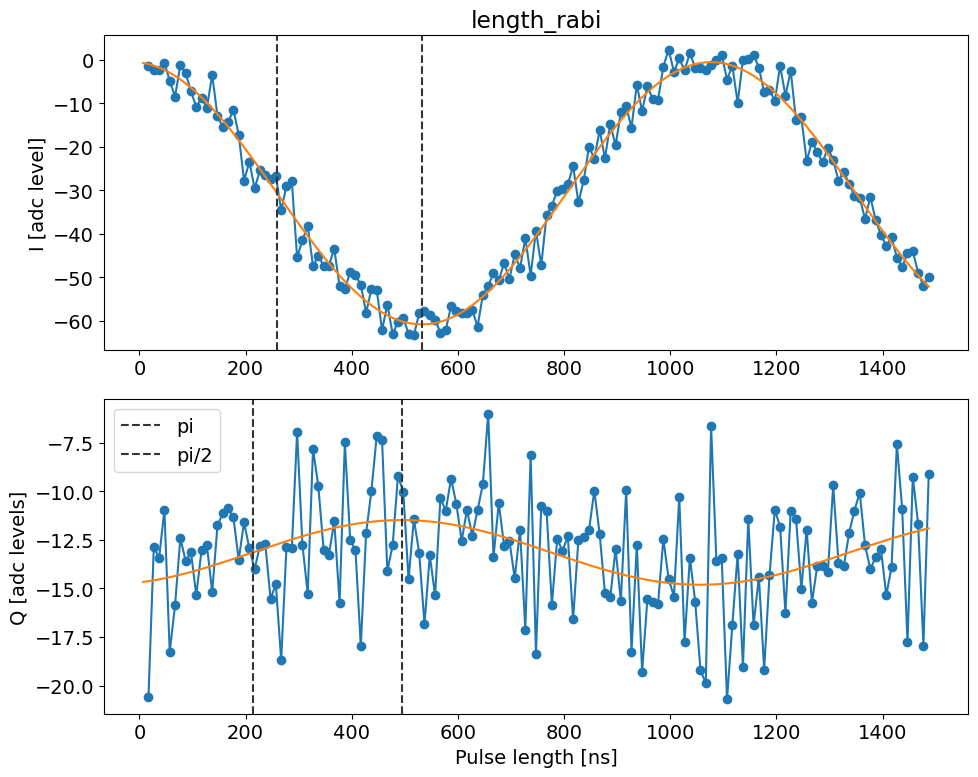

p1: 0.9172204960724272
p2: 94.38018886333367
Pi length: 0.5318599080612356
Pi/2 length: 0.2592973115312742
p1: 0.8894788759034556
p2: -68.24997490773433
Pi length: 0.4942031514645075
Pi/2 length: 0.21313970322233128


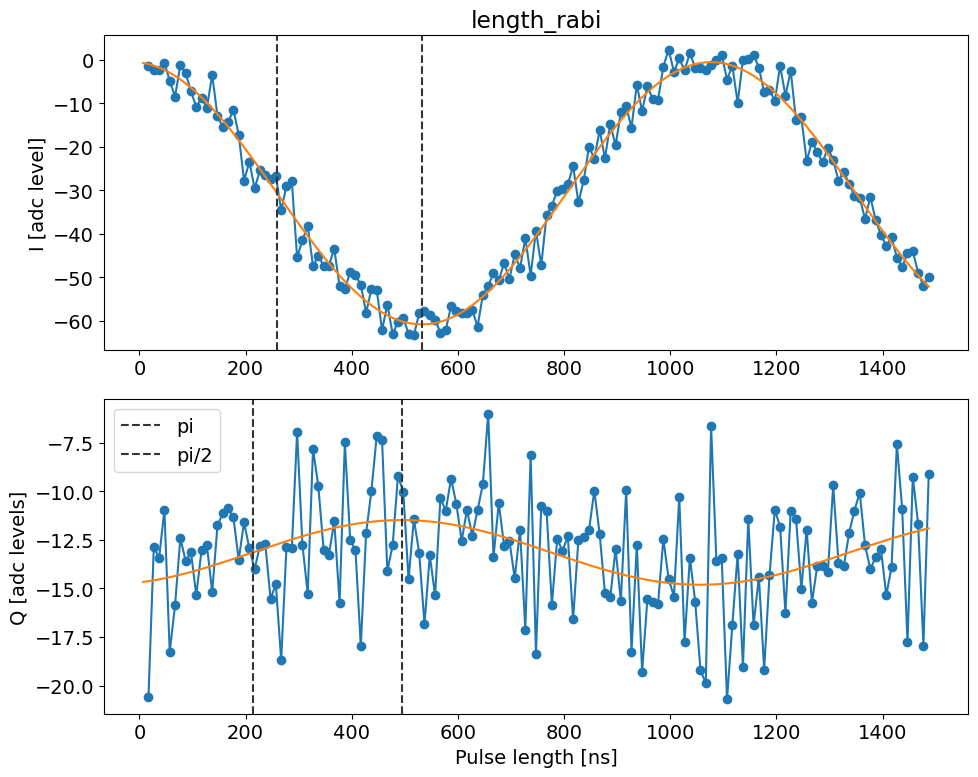

In [382]:
# Execute
# =================================
lenrabi_f0g1_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.LengthRabiGeneralF0g1Experiment,
    default_expt_cfg=lenrabi_f0g1_defaults,
    preprocessor=lenrabi_f0g1_preproc,
    postprocessor=lenrabi_f0g1_postproc,
    job_client=client,
)

len_rabis_mans = [None] * len(expts_to_run['man_modes'])

for i in range(len(expts_to_run['man_modes'])):
    if expts_to_run['length_rabi'] or expts_to_run['length_rabi_sweep']:
        print(f'Running length rabi for mode {i+1}')
        len_rabis_mans[i] = lenrabi_f0g1_runner.execute(
            man_mode_no=i+1,
            go_kwargs=dict(progress=True),
            step=0.01,
        )
        len_rabis_mans[i].display()


## --- Manipulate sections below not refactored ---

## Chi between qubit and Manipulate 

### ge

In [ ]:
mm_base_dummy = MM_dual_rail_base(config_thisrun, soc)
prep_man_pi = mm_base_dummy.prep_man_photon(1)
mm_base_dummy.get_prepulse_creator(prep_man_pi).pulse

In [ ]:
from experiments.MM_dual_rail_base import MM_dual_rail_base
import numpy as np

# the do function contains 2 calls to ramsey, one with no prepulse and one with prepulse 
# that initializes manipulation mode to 1 state
# do_t2_ramsey_ge is already defined in previous cells and can be used directly

# Add active_reset, relax_delay, expts as arguments and pass them to do_t2_ramsey_ge
def do_chi(config_thisrun, expt_path, config_path, prepulse=None, standard_ramsey=True,
           man_mode_no=1, active_reset=False, relax_delay=2500, expts=100):
    """
    Run two Ramsey experiments: one standard, one with a prepulse that initializes manipulation mode 1.
    Returns both experiment objects.
    """
    # Standard Ramsey (no prepulse)
    if standard_ramsey:
        t2ramsey_no_prepulse = do_t2_ramsey_ge(
            config_thisrun, expt_path, config_path,
            pre_sweep_pulse=None, post_sweep_pulse=None,
            step_size=0.1,
            active_reset=active_reset,
            relax_delay=relax_delay,
            expts=expts
        )
    else: 
        t2ramsey_no_prepulse = None

    # Ramsey with prepulse (initialize manipulation mode 1)
    if prepulse is None:
        mm_base_dummy = MM_dual_rail_base(config_thisrun, soc)
        prep_man_pi = mm_base_dummy.prep_man_photon(man_mode_no)
        prepulse = mm_base_dummy.get_prepulse_creator(prep_man_pi).pulse.tolist()

    t2ramsey_with_prepulse = do_t2_ramsey_ge(
        config_thisrun, expt_path, config_path,
        pre_sweep_pulse=prepulse, post_sweep_pulse=None,
        step_size=0.1,
        active_reset=active_reset,
        relax_delay=relax_delay,
        expts=expts
    )

    return t2ramsey_no_prepulse, t2ramsey_with_prepulse


def update_chi(t2_ramsey_original, t2_ramsey_prepulse, config_thisrun, man_mode_no=1):
    """
    Update config_thisrun.device.qubit.chi for the given manipulation mode.
    """
    f_without_prepulse = t2_ramsey_original.data['f_adjust_ramsey_avgi'][0]
    f_with_prepulse = t2_ramsey_prepulse.data['f_adjust_ramsey_avgi'][0]
    chi = f_with_prepulse - f_without_prepulse
    print('Chi:', chi)
    config_thisrun.device.manipulate.chi_ge[man_mode_no - 1] = chi
    config_thisrun.device.manipulate.revival_time[man_mode_no-1] = np.abs(np.pi/(2 * np.pi * chi))
    print('Delay time (mus):', config_thisrun.device.manipulate.revival_time[man_mode_no-1] )


In [ ]:
t2_ramsey_original, t2_ramsey_prepulse = None, None
# Run the chi experiments/__pycache__/
if expts_to_run['chi_ge']:
    t2_ramsey_original, t2_ramsey_prepulse = do_chi(config_thisrun, expt_path, config_path, standard_ramsey=True)
    # analyze and display the results
    t2_ramsey_original.analyze(fitparams=[300, None, None, None, None, None])
    t2_ramsey_original.display()
    t2_ramsey_prepulse.analyze(fitparams=[300, None, None, None, None, None])
    t2_ramsey_prepulse.display() 
    # update the config_thisrun with the chi value
    update_chi(t2_ramsey_original, t2_ramsey_prepulse, config_thisrun, man_mode_no=1)
    print('Only doing it for mode 1')

In [ ]:
# config_thisrun.device.manipulate.revival_time[0] = np.pi/(2 * np.pi * config_thisrun.device.manipulate.chi[0])

### ef

In [ ]:
from experiments.MM_dual_rail_base import MM_dual_rail_base

# the do function contains 2 calls to ramsey, one with no prepulse and one with prepulse 
# that initializes manipulation mode to 1 state
def do_chi_f(config_thisrun, expt_path, config_path, 
           man_mode_no=1):
    """
    Run two Ramsey experiments: one standard, one with a prepulse that initializes manipulation mode 1.
    Returns both experiment objects.
    """

    
    mm_base_dummy = MM_dual_rail_base(config_thisrun, soc)
    prep_man_pi = mm_base_dummy.prep_man_photon(man_mode_no)
    # Add qubit ge prepulse and postpulse for ef (ge init)
    qubit_ge_prepulse = [['qubit', 'ge', 'pi', 0]]
    prep_man_pi_prepulse = mm_base_dummy.get_prepulse_creator(prep_man_pi).pulse.tolist()
    prepulse =  mm_base_dummy.get_prepulse_creator(prep_man_pi + qubit_ge_prepulse ).pulse.tolist() 
    postpulse  = mm_base_dummy.get_prepulse_creator(qubit_ge_prepulse).pulse.tolist()

    # Add chi to frequency of qubit ge 
    # prepulse[0][-1] += config_thisrun.device.manipulate.chi[man_mode_no - 1]
    # postpulse[0][-1] += config_thisrun.device.manipulate.chi[man_mode_no - 1]

    # Do an ef and ge ramsey with this prepulse 
    # Run ge Ramsey 
    
    
    t2ramsey_no_prepulse_ge = do_t2_ramsey_ge(config_thisrun,
        expt_path,
        config_path,
        step_size=0.1,
        pre_sweep_pulse=prep_man_pi_prepulse,
        post_sweep_pulse=None)
    # Run ef Ramsey with prepulse and postpulse
    t2ramsey_with_prepulse_ef = do_t2_ramsey_ef(
        config_thisrun,
        expt_path,
        config_path,
        pre_sweep_pulse=prepulse,
        post_sweep_pulse=postpulse,
        step_size=0.1,
        ef_init=False  # Do not initialize ef, we are already in ef state
    )
    

    return t2ramsey_no_prepulse_ge, t2ramsey_with_prepulse_ef

def update_chi_ef(t2_standard_ramsey, t2_prepulsed_ramsey, config_thisrun, man_mode_no=1):
    """
    Update config_thisrun.device.qubit.chi for the given manipulation mode.
    """
    f_with_prepulse = t2_prepulsed_ramsey.data['f_adjust_ramsey_avgi'][0]
    f_without_prepulse = t2_standard_ramsey.data['f_adjust_ramsey_avgi'][0]
    chi_ef = f_with_prepulse - f_without_prepulse
    print('Chi:', chi_ef)
    config_thisrun.device.manipulate.chi_ef[man_mode_no - 1] = chi_ef


In [ ]:
man_mode_no = 1
t2ge_ramsey_forchief, t2ef_ramsey_forchief = None, None
t2ef_standard_ramsey_forchief = None
if expts_to_run['chi_ef']:
    
    #get standard ef ramsey 
    t2ef_standard_ramsey_forchief = do_t2_ramsey_ef(config_thisrun, expt_path, config_path)
    # analyze and display the results
    t2ef_standard_ramsey_forchief.analyze(fitparams=[300, None, None, None, None, None])
    t2ef_standard_ramsey_forchief.display(title_str='T2_ef_standard_for_chief')

    # Now ramseys with man photon prepulse
    config_thisrun_chief = deepcopy(config_thisrun)
    config_thisrun_chief.device.qubit.f_ge[0] += config_thisrun.device.manipulate.chi_ge[man_mode_no - 1]
    t2ge_ramsey_forchief, t2ef_ramsey_forchief = do_chi_f(config_thisrun_chief, expt_path, config_path)
    # analyze and display the results
    t2ge_ramsey_forchief.analyze(fitparams=[300, None, None, None, None, None])
    t2ge_ramsey_forchief.display(title_str='T2_ge_for_chief_tocheck_this_is_correctly_at_ramsey_freq')
    t2ef_ramsey_forchief.analyze(fitparams=[300, None, None, None, None, None])
    t2ef_ramsey_forchief.display(title_str='T2_ef_for_chief')
    # update the config_thisrun with the chi value
    update_chi_ef(t2ef_standard_ramsey_forchief, t2ef_ramsey_forchief, config_thisrun)


## Parity Delay
NOT Implemented yet: We can use chi to estimate parity waiting time pi/chi but can also fine tune it using this experiment

Basically Length rabi analysis 

In [383]:
parity_delay_defaults = AttrDict(dict(
    start=0.01,
    step=0.05,
    expts=50,
    reps=250,
    rounds=1,
    qubits=[0],
    parity_fast=True,
    normalize=False,
    active_reset=False,
    man_reset=True,
    gate_based=False,
    storage_reset=True,
    man_mode_no=1,
    relax_delay=2500, 
    param_to_calib='length', # length or ac_stark_shift 
    shift_sign=1, # 1 or -1 for ac stark shift direction
    ))

mm_base_calib = MM_dual_rail_base(station.hardware_cfg, station.soccfg)


def parity_delay_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    if 'param_to_calib' in expt_cfg and expt_cfg.param_to_calib =='ac_stark_shift':
        expt_cfg.prepulse = False
        expt_cfg.pre_sweep_pulse = []
    elif 'param_to_calib' in expt_cfg and expt_cfg.param_to_calib =='length':
        expt_cfg.prepulse = True
        pre_sweep_pulse = mm_base_calib.prep_man_photon(man_no=expt_cfg.man_mode_no, photon_no=1)
        pre_sweep_pulse = mm_base_calib.get_prepulse_creator(pre_sweep_pulse, station.hardware_cfg).pulse.tolist()
        expt_cfg.pre_sweep_pulse = pre_sweep_pulse
    return expt_cfg

def parity_delay_postproc(station, expt):
    from fitting.fit_display_classes import LengthRabiFitting
    # Analyze the data
    length_rabi_analysis = LengthRabiFitting(expt.data, config = expt.cfg)
    length_rabi_analysis.analyze(fitparams = [100, 1, 0, None, None, None])
    length_rabi_analysis.display(title_str='Length Rabi General F0g1')
    expt_cfg = expt.cfg.expt
    man_mode_no = expt_cfg.man_mode_no
    shift_sign = expt_cfg.shift_sign


    if expt_cfg.param_to_calib == 'length':
        delay = length_rabi_analysis.results['pi_length']
        print(f'Fitted revival time: {delay} us')
        old_delay = station.hardware_cfg.device.manipulate.revival_time[man_mode_no - 1]
        station.hardware_cfg.device.manipulate.revival_time[man_mode_no - 1] = delay
        print(f'Updated revival time for mode {man_mode_no}: {old_delay} -> {station.hardware_cfg.device.manipulate.revival_time[man_mode_no - 1]}')

    elif expt_cfg.param_to_calib == 'ac_stark_shift': 
        freq = length_rabi_analysis.data['fit_avgi'][1]
        print(f'Fitted ac Stark shift: {freq} MHz')
        old_freq = station.hardware_cfg.device.manipulate.revival_stark_shift[man_mode_no - 1]
        station.hardware_cfg.device.manipulate.revival_stark_shift[man_mode_no - 1] += shift_sign * freq
        print(f'Updated ac Stark shift for mode {man_mode_no}: {old_freq} -> {station.hardware_cfg.device.manipulate.revival_stark_shift[man_mode_no - 1]}')

    


### Calibrate first the AC stark shift

Manipulate in 0, qubit should not rotate

this is calibrating the virtual Z to correct from rotating frame to bare frame

In [364]:
parity_delay_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ParityDelayExperiment,
    default_expt_cfg=parity_delay_defaults,
    postprocessor=parity_delay_postproc,
    preprocessor=parity_delay_preproc,
    job_client=client,
    use_queue=True,
)

parity_delay_ac_stark = parity_delay_runner.execute(
    param_to_calib='ac_stark_shift', 
    go_kwargs=dict(analyze=False, display=False),
    step=0.2,
    expts=100,
    reps=100,
    shift_sign=1,
    # coupler_current=0.0,
)

Job submitted: JOB-20260817-00150 (queue position: 1)

[0.0s] Job JOB-20260817-00150: pending

[INTERRUPT] Keyboard interrupt received for job JOB-20260817-00150
[INTERRUPT] ERROR: Job is currently running on worker
[INTERRUPT] Cannot interrupt running jobs remotely
[INTERRUPT] The job will continue running until completion
[INTERRUPT] Check status later with: client.get_status('JOB-20260817-00150')


KeyboardInterrupt: 

Confirming the correction is in the right direction

In [ ]:
parity_delay_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ParityDelayExperiment,
    default_expt_cfg=parity_delay_defaults,
    preprocessor=parity_delay_preproc,
    job_client=client,
    use_queue=True,
)

parity_delay_ac_stark = parity_delay_runner.execute(
    param_to_calib='ac_stark_shift', 
    go_kwargs=dict(analyze=False, display=False),
    step=0.2,
    expts=100,
    reps=100,
    shift_sign=1,
    # coupler_current=0.0,
)

In [ ]:
parity_delay_ac_stark.display(fit=False)

### Now parity length after the AC stark shift is calibrated

Job submitted: JOB-20260817-00182 (queue position: 1)

[0.0s] Job JOB-20260817-00182: pending

[2.0s] Job JOB-20260817-00182: running
[WORKER] Loading ParityDelayExperiment from experiments.single_qubit.parity_delay
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00182_ParityDelayExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 99%|████████████████████████████████████████▌| 99/100 [01:01<00:00,  1.63it/s]
[65.4s] Job JOB-20260817-00182: completed
100%|████████████████████████████████████████| 100/100 [01:01<00:00,  1.62it/s]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00182_ParityDelayExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260817-00182_expt.pkl

Job completed! Data: C:\experiments\260813_calibration_after_recooldown\data\JOB-20

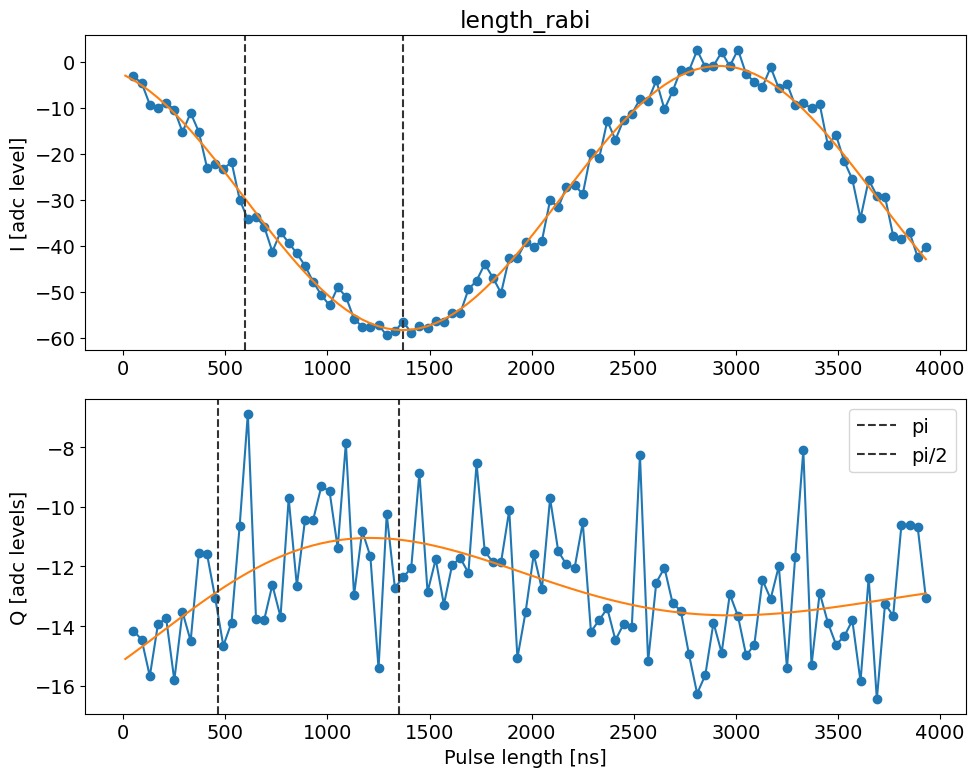

Fitted revival time: 1.3688781461150603 us
Updated revival time for mode 1: 1.4996106335931787 -> 1.3688781461150603
[runner] experiment.display() failed: too many values to unpack (expected 4)
[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\Jonginn\QubitCalibration\2026\08\2026-08-17.md


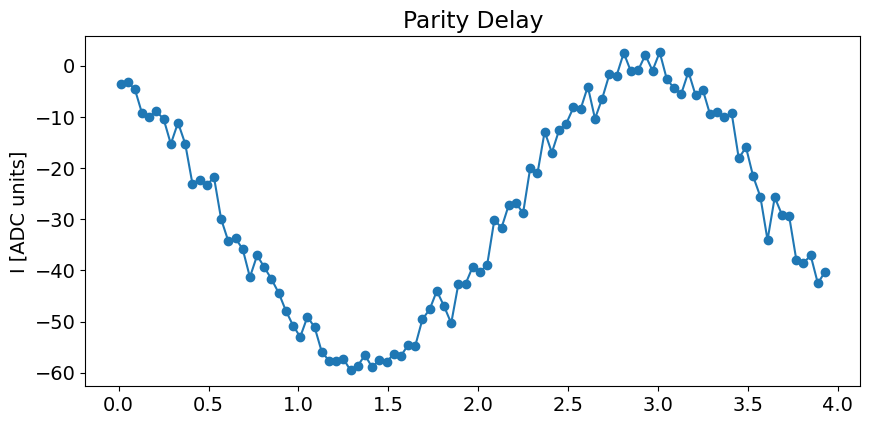

In [384]:
parity_delay_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ParityDelayExperiment,
    default_expt_cfg=parity_delay_defaults,
    postprocessor=parity_delay_postproc,
    preprocessor=parity_delay_preproc,
    job_client=client,
    use_queue=True,
)

parity_delay_ac_stark = parity_delay_runner.execute(
    param_to_calib='length', 
    go_kwargs=dict(analyze=False, display=False),
    step=0.04,
    expts=100,
    reps=200,
    parity_fast = False
)

In [385]:
station.update_all_station_snapshots()

[CONFIG] Created new hardware_config version CFG-HW-20260817-00030
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260817-00054
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260814-00076
Config snapshots for current station:
  hardware_config: CFG-HW-20260817-00030
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260817-00054
  floquet_storage_swap: CFG-FL-20260814-00076


{'hardware_config': 'CFG-HW-20260817-00030',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260817-00054',
 'floquet_storage_swap': 'CFG-FL-20260814-00076'}

## T1

In [ ]:
t1_manipulate_defaults = AttrDict(dict(
    start=0,
    step=8,
    expts=120,
    reps=500,
    rounds=1,
    man_mode_no=1,
    f0g1_param=None,
    cavity_prepulse=[False, 300, 1.5],
    f0g1_prep=True,
    resolved_pi=False,
    qubit=0,
    normalize=False,
))


def t1_manipulate_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    
    if expt_cfg.f0g1_param is None:
        pulse_param = station.hardware_cfg.device.multiphoton.pi['fn-gn+1']
        expt_cfg.f0g1_param = [pulse_param['frequency'][0],
                               pulse_param['gain'][0],
                                 pulse_param['length'][0], 
                                 pulse_param['sigma'][0],
        ]

    expt_cfg.cavity = expt_cfg.man_mode_no

    return expt_cfg


t1_manipulate_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.t1_cavity.T1CavityExperiment,
    default_expt_cfg=t1_manipulate_defaults,
    preprocessor=t1_manipulate_preproc,
    job_client=client,
)

In [ ]:
t1_manipulate = t1_manipulate_runner.execute()

In [ ]:
t1_manipulate.analyze()
t1_manipulate.display()

## T2

prepares man in + and does ramsey with this

In [ ]:
cross_kerr_stor = 7
cross_kerr_init_fock = 0

prep_cross_kerr = dict(
    parity_meas=True,
    use_auto_prep=True, 
    prepulse=False,
)
if cross_kerr_init_fock == 1:
    prep_cross_kerr.update(dict(
        prepulse=True,
        pre_sweep_pulse = [
            ['qubit', 'ge', 'pi', 0,],
            ['qubit', 'ef', 'pi', 0,], # qubit in f
            ['man', 'M1', 'pi', 0,], # f0-g1 --> man in 1
            ['storage', f'M1-S{cross_kerr_stor}', 'pi', 0,],
        ]
    ))

### First calibrate the stark shift and residual detuning on the + state during the f0-g1

In [ ]:
t2_manipulate_defaults = AttrDict(dict(
    start=0,
    step=0.01,
    expts=300,
    reps=200,
    rounds=1,
    mode='manipulate',
    man_mode_no=1,
    qubits=[0],
    ramsey_freq=20,
))


t2_manipulate_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.t2_cavity_mode.CavityModeRamseyExperiment,
    default_expt_cfg=t2_manipulate_defaults,
    # preprocessor=t2_manipulate_preproc,
    job_client=client,
)

In [ ]:
t2_manipulate = t2_manipulate_runner.execute(**prep_cross_kerr)

In [ ]:
t2_manipulate.analyze()
t2_manipulate.display()
fit_ac_freq = t2_manipulate.data['f_adjust_ramsey_avgi'][0]
print("fit freq MHz", fit_ac_freq)

### Ac stark shift adjustment

Slight correction of the ac stark shift correction at long times

In [ ]:
t2_manipulate_2_defaults = AttrDict(dict(
    start=0,
    step=0.1,
    expts=100,
    reps=200,
    rounds=1,
    mode='manipulate',
    man_mode_no=1,
    qubits=[0],
    ramsey_freq=fit_ac_freq + 2, # the added part is the effective additional calibration we can do
))


t2_manipulate_2_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.t2_cavity_mode.CavityModeRamseyExperiment,
    default_expt_cfg=t2_manipulate_2_defaults,
    # preprocessor=t2_manipulate_preproc,
    job_client=client,
)

In [ ]:
t2_manipulate_2 = t2_manipulate_2_runner.execute(**prep_cross_kerr)
t2_manipulate_2.analyze()
t2_manipulate_2.display()

In [ ]:
effective_ramsey_freq = t2_manipulate_2.cfg.expt.ramsey_freq - fit_ac_freq
fitted_freq = t2_manipulate_2.data['fit_avgi'][1]
freq_update = sorted(
    (effective_ramsey_freq - fitted_freq, effective_ramsey_freq + fitted_freq), key=abs)
fit_ac_freq_fine = fit_ac_freq + freq_update[0] # sign could be + or -...
# fit_ac_freq_fine = t2_manipulate_2.data['f_adjust_ramsey_avgi'][0]
print("Make sure to double check the adjustment sign above is correct by running the next cell with 0 additional virtual ramsey!")
print("fit freq MHz updated", fit_ac_freq_fine)

### Proper t2

In [ ]:
t2_manipulate_3_defaults = AttrDict(dict(
    start=0,
    step=5,
    expts=100,
    reps=200,
    rounds=1,
    mode='manipulate',
    man_mode_no=1,
    qubits=[0],
    ramsey_freq=fit_ac_freq_fine + 0.01,
))


t2_manipulate_3_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.single_qubit.t2_cavity_mode.CavityModeRamseyExperiment,
    default_expt_cfg=t2_manipulate_3_defaults,
    # preprocessor=t2_manipulate_3_preproc,
    job_client=client,
)

In [ ]:
print(prep_cross_kerr)

In [ ]:
t2_manipulate_3 = t2_manipulate_3_runner.execute(

    # high kerr point
    start=0,
    step=5,
    expts=100,
    ramsey_freq=fit_ac_freq_fine + 0.010,

    **prep_cross_kerr
    )
t2_manipulate_3.analyze()
t2_manipulate_3.display()

# Storage

In [388]:
# Storage Spectroscopy - New Pattern with CharacterizationRunner
from experiments.MM_dual_rail_base import MM_dual_rail_base


def get_storage_mode_parameters(ds_storage, config_thisrun, man_mode_no, stor_mode_no):
    """Get pulse parameters for a given storage mode."""
    stor_name = 'M' + str(man_mode_no) + '-S' + str(stor_mode_no)
    freq = ds_storage.get_freq(stor_name)
    gain = ds_storage.get_gain(stor_name)
    pi_len = ds_storage.get_pi(stor_name)
    h_pi_len = ds_storage.get_h_pi(stor_name)
    # flux_low_ch = config_thisrun.hw.soc.dacs.flux_low.ch
    # flux_high_ch = config_thisrun.hw.soc.dacs.flux_high.ch
    # ch = flux_low_ch if freq < 1000 else flux_high_ch
    ch = 'low' if freq < 1800 else 'high'

    mm_base_dummy = MM_dual_rail_base(config_thisrun, soccfg=station.soccfg)
    prep_man_pi = mm_base_dummy.prep_man_photon(man_mode_no)
    prepulse = mm_base_dummy.get_prepulse_creator(prep_man_pi).pulse.tolist()
    postpulse = mm_base_dummy.get_prepulse_creator(prep_man_pi[-1:-3:-1]).pulse.tolist()

    return freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse

## Man-Stor Spectroscopy

In [406]:
# Configuration defaults
stor_spec_defaults = AttrDict(dict(
    step=0.08,  # bw/expts = 20/250
    expts=250,
    reps=200,
    qubit=[0],
    qubits=[0], # oh well
    man_mode_no=1, 
    stor_mode_no=1, 
    bw=20, 
    flux_drive_ch = None, # if None, will default to value in ds_storage
    flux_drive_gain = None, # if None, will default to value in ds_storage
    flux_drive_duration=5,
    prepulse=True,
    postpulse=True,
    active_reset=False,
    relax_delay=500,
))

def stor_spec_preproc(station, default_expt_cfg, **kwargs):
    """Preprocessor for storage spectroscopy."""
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    
    # Get storage mode parameters
    freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse = get_storage_mode_parameters(
        station.ds_storage, station.hardware_cfg, expt_cfg.man_mode_no, expt_cfg.stor_mode_no
    )
    # # manually chaning freq for testing
    if kwargs.get("center_freq", 0) != 0:
        print(" manually chaning freq for testing")
        freq = expt_cfg.center_freq
    
    
    # Set sweep range centered on current frequency
    expt_cfg.start = freq - expt_cfg.bw/2
    expt_cfg.step = expt_cfg.bw / expt_cfg.expts
    # Override flux drive channel and gain if specified
    if expt_cfg.flux_drive_gain:
        gain = expt_cfg.flux_drive_gain
    if expt_cfg.flux_drive_ch:
        ch = expt_cfg.flux_drive_ch
    
    gain = int(0.5 * gain)
    expt_cfg.flux_drive = [ch, 1, gain, expt_cfg.flux_drive_duration]
    # [ch, freq_placeholder, gain, length(us)]

    # and prepulse/postpulse
    expt_cfg.pre_sweep_pulse = prepulse
    expt_cfg.post_sweep_pulse = postpulse
    
    print(f'Storage spectroscopy for M{expt_cfg.man_mode_no}-S{expt_cfg.stor_mode_no}: freq={freq:.3f} MHz, bw={expt_cfg.bw} MHz')
    
    return expt_cfg

def stor_spec_postproc(station, expt):
    """Postprocessor for storage spectroscopy - updates frequency."""
    man_mode_no = expt.cfg.expt.man_mode_no
    stor_mode_no = expt.cfg.expt.stor_mode_no
    stor_name = f'M{man_mode_no}-S{stor_mode_no}'
    new_freq = expt.data['fit_avgi'][2]
    station.ds_storage.update_freq(stor_name, new_freq)
    print(f'Updated frequency for {stor_name}: {new_freq:.4f} MHz')

# Create runner
stor_spec_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.FluxSpectroscopyF0g1Experiment,
    default_expt_cfg=stor_spec_defaults,
    preprocessor=stor_spec_preproc,
    postprocessor=stor_spec_postproc,
    job_client=client,
)


Running storage spectroscopy for mode 4
Storage spectroscopy for M1-S4: freq=868.352 MHz, bw=20 MHz
Job submitted: JOB-20260817-00344 (queue position: 1)

[0.0s] Job JOB-20260817-00344: pending

[2.0s] Job JOB-20260817-00344: running
[WORKER] Loading FluxSpectroscopyF0g1Experiment from experiments.single_qubit.rf_flux_spectroscopy_f0g1
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00344_FluxSpectroscopyF0g1Experiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 98%|███████████████████████████████████████▏| 245/250 [01:17<00:01,  3.23it/s]
[81.6s] Job JOB-20260817-00344: completed
100%|████████████████████████████████████████| 250/250 [01:19<00:00,  3.15it/s]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00344_FluxSpectroscopyF0g1Experiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration

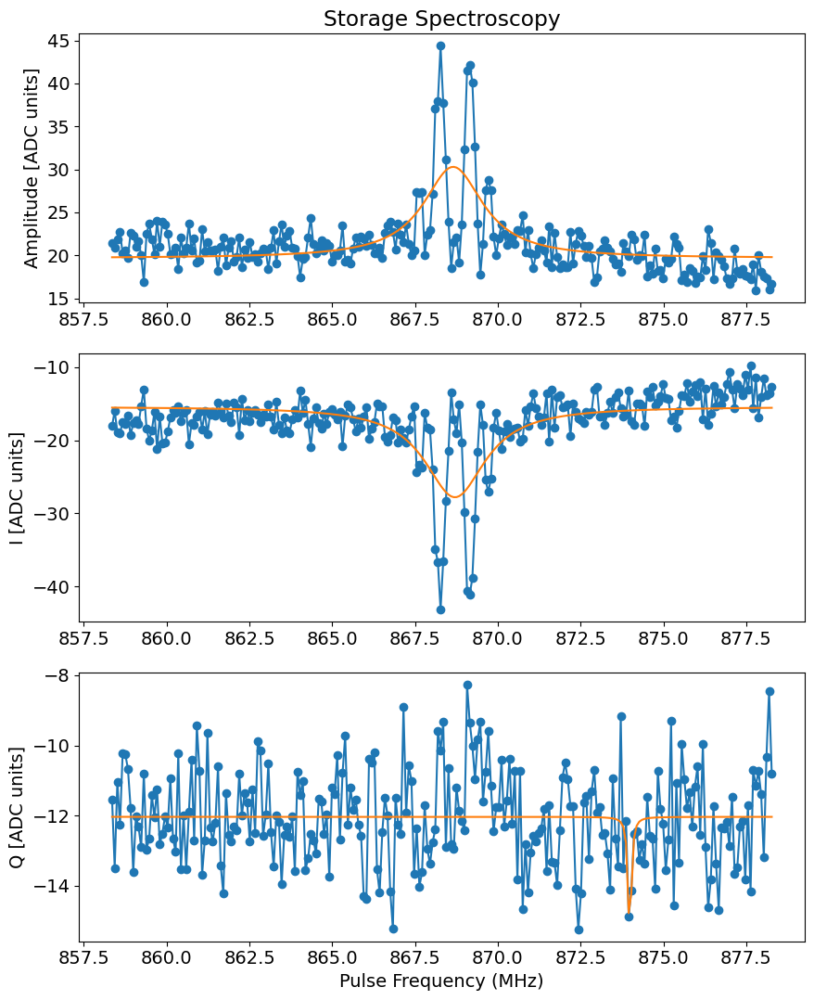

Found peak in amps at [MHz] 868.6522538630263, HWHM 1.1031161712699724
Found peak in I at [MHz] 868.7059619351489, HWHM 1.1225752322825102
Found peak in Q at [MHz] 873.9845326488035, HWHM 0.05699287788248173


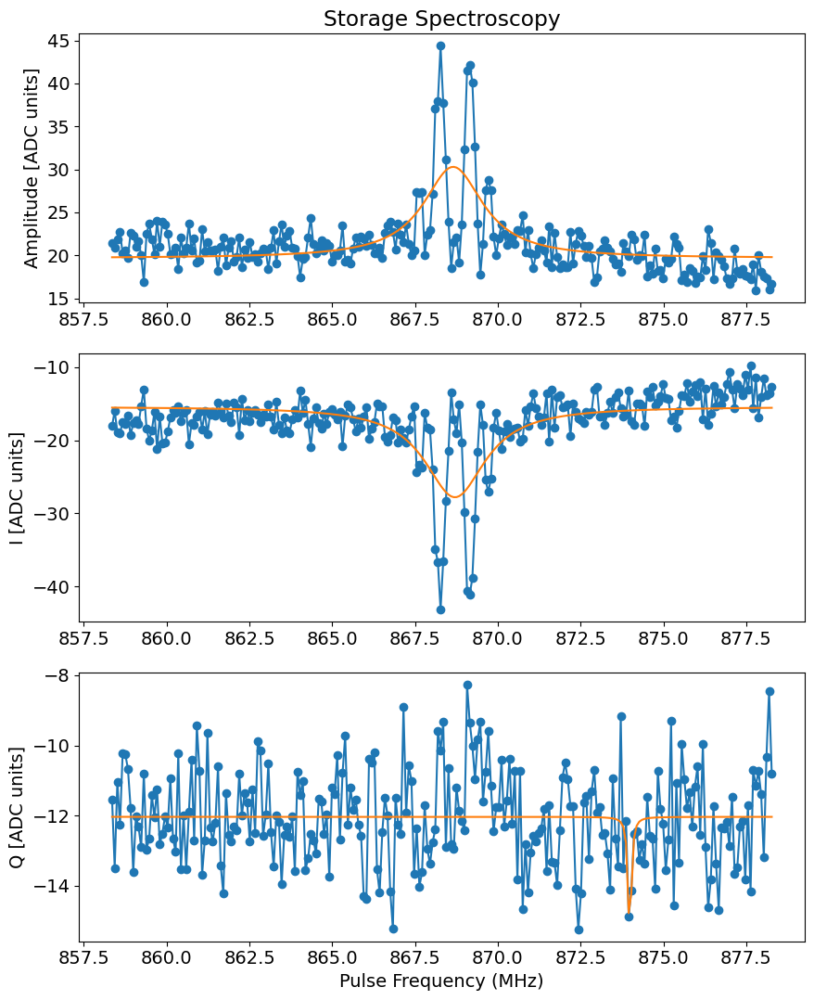

Running storage spectroscopy for mode 5
Storage spectroscopy for M1-S5: freq=1044.491 MHz, bw=20 MHz
Job submitted: JOB-20260817-00345 (queue position: 1)

[0.0s] Job JOB-20260817-00345: pending

[2.1s] Job JOB-20260817-00345: running
[WORKER] Loading FluxSpectroscopyF0g1Experiment from experiments.single_qubit.rf_flux_spectroscopy_f0g1
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00345_FluxSpectroscopyF0g1Experiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 99%|███████████████████████████████████████▋| 248/250 [01:18<00:00,  3.23it/s]
[83.6s] Job JOB-20260817-00345: completed
100%|████████████████████████████████████████| 250/250 [01:19<00:00,  3.15it/s]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00345_FluxSpectroscopyF0g1Experiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibratio

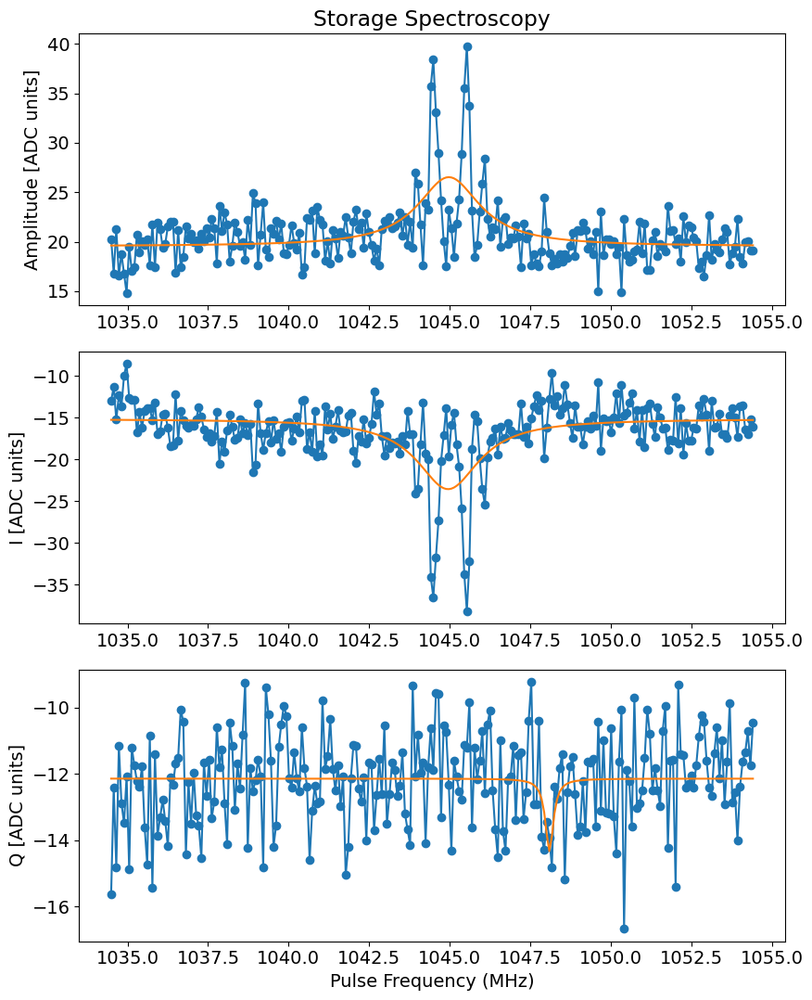

Found peak in amps at [MHz] 1044.972616346598, HWHM 1.1827999812713617
Found peak in I at [MHz] 1044.9508184969184, HWHM 1.1794444154194779
Found peak in Q at [MHz] 1048.0941266351597, HWHM 0.15083284762643806


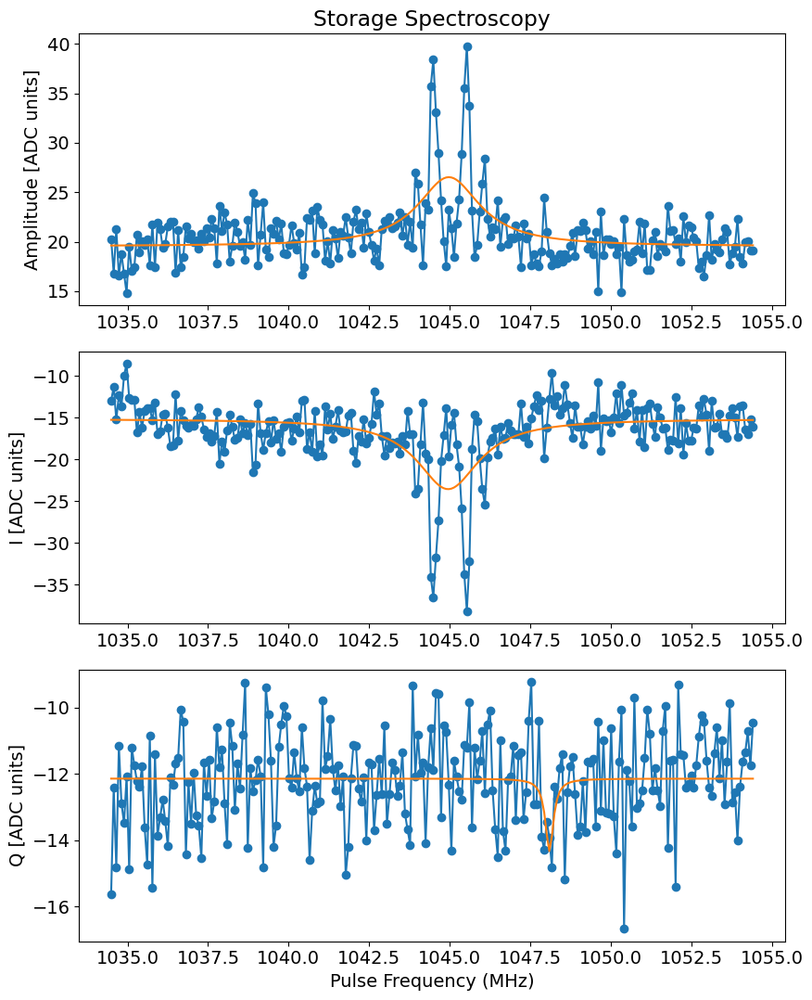

Running storage spectroscopy for mode 6
Storage spectroscopy for M1-S6: freq=1236.196 MHz, bw=20 MHz
Job submitted: JOB-20260817-00346 (queue position: 1)

[0.0s] Job JOB-20260817-00346: pending

[2.6s] Job JOB-20260817-00346: running
[WORKER] Loading FluxSpectroscopyF0g1Experiment from experiments.single_qubit.rf_flux_spectroscopy_f0g1
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00346_FluxSpectroscopyF0g1Experiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 98%|███████████████████████████████████████▎| 246/250 [01:18<00:01,  3.18it/s]
[83.2s] Job JOB-20260817-00346: completed
100%|████████████████████████████████████████| 250/250 [01:19<00:00,  3.14it/s]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00346_FluxSpectroscopyF0g1Experiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibratio

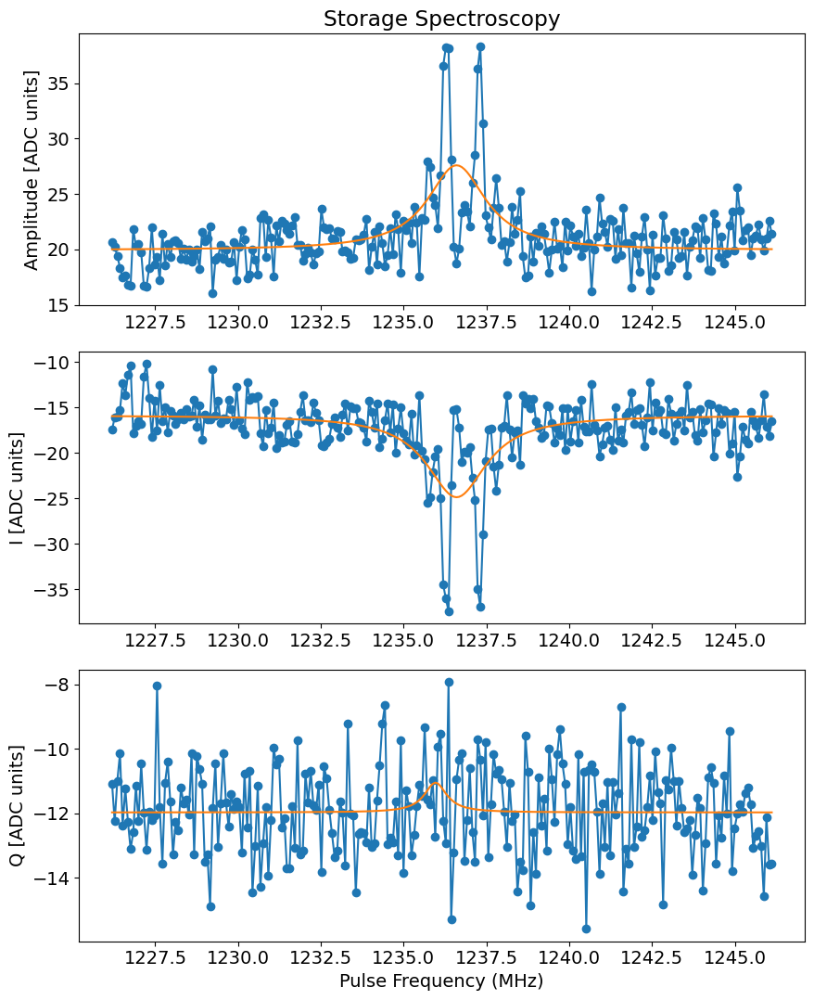

Found peak in amps at [MHz] 1236.598156591916, HWHM 1.0744065781221084
Found peak in I at [MHz] 1236.598842925028, HWHM 1.1037819736845618
Found peak in Q at [MHz] 1235.9624452852524, HWHM 0.41121659807451383


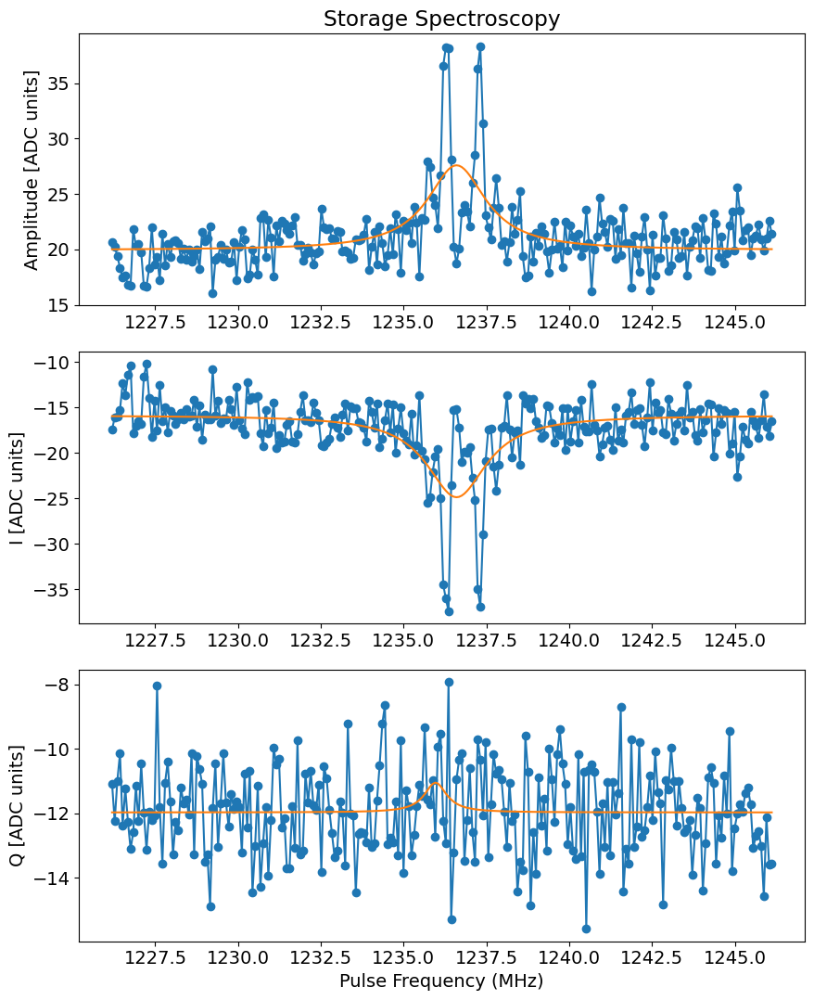

In [409]:
# Execute for all storage modes
if expts_to_run.get('stor_spectroscopy', False):
    stor_specs = {}
    # for stor_mode_no in range(1, 8):  # modes 1-7
    for stor_mode_no in [4, 5, 6]:  # modes 1-7
        print(f'Running storage spectroscopy for mode {stor_mode_no}')
        stor_specs[stor_mode_no] = stor_spec_runner.execute(
            man_mode_no=1,
            dump_mode_no =2,
            stor_mode_no=stor_mode_no,
            # coupler_current=coupler_current,
            flux_drive_gain=10000,
            flux_drive_duration=2,
            postproc=False,
            # expts = 800,
            reps = 400,
            # relax_delay = 800,
            bw = 20, #80
            # center_freq = 720
        )
        stor_specs[stor_mode_no].display()

In [350]:
station.update_all_station_snapshots()

[CONFIG] Reusing existing hardware_config version CFG-HW-20260817-00016
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Created new man1_storage_swap version CFG-M1-20260817-00043
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260814-00076
Config snapshots for current station:
  hardware_config: CFG-HW-20260817-00016
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260817-00043
  floquet_storage_swap: CFG-FL-20260814-00076


{'hardware_config': 'CFG-HW-20260817-00016',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260817-00043',
 'floquet_storage_swap': 'CFG-FL-20260814-00076'}

## Man-dump

In [261]:
def get_dump_mode_parameters(ds_storage, config_thisrun, man_mode_no, dump_mode_no):
    """Get pulse parameters for a given dump mode."""
    dump_name = 'M' + str(man_mode_no) + '-D' + str(dump_mode_no)
    freq = ds_storage.get_freq(dump_name)
    gain = ds_storage.get_gain(dump_name)
    pi_len = ds_storage.get_pi(dump_name)
    h_pi_len = ds_storage.get_h_pi(dump_name)
    flux_low_ch = config_thisrun.hw.soc.dacs.flux_low.ch
    flux_high_ch = config_thisrun.hw.soc.dacs.flux_high.ch
    # ch = flux_low_ch if freq < 1000 else flux_high_ch
    ch = 4 
    print('Flux channel manually set to 4')

    mm_base_dummy = MM_dual_rail_base(config_thisrun, soccfg=station.soccfg)
    # prepulse_spec = [['multiphoton', 'g0-e0', 'pi', 0],
    #                  ['multiphoton', 'e0-f0', 'pi', 0],
    #                  ['multiphoton', 'f0-g1', 'pi', 0]]
    # postpulse_spec = [['multiphoton', 'f0-g1', 'pi', 0],
    #                   ['multiphoton', 'e0-f0', 'pi', 0]]
    # prepulse = mm_base_dummy.get_prepulse_creator(prepulse_spec).pulse.tolist()
    # postpulse = mm_base_dummy.get_prepulse_creator(postpulse_spec).pulse.tolist()

    prep_man_pi = mm_base_dummy.prep_man_photon(man_mode_no)
    prepulse = mm_base_dummy.get_prepulse_creator(prep_man_pi).pulse.tolist()
    postpulse = mm_base_dummy.get_prepulse_creator(prep_man_pi[-1:-3:-1]).pulse.tolist()

    return freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse

In [262]:
station.ds_storage.get_freq('M1-D2')

2268.431329315397

### Spectroscopy

In [391]:
# Configuration defaults
dump_spec_defaults = AttrDict(dict(
    # step=0.5,  # span/expts = 100/200
    # step=0.2,  # span/expts = 100/200
    span=20,
    expts=200,
    reps=200,
    qubit=[0],
    flux_drive=[0, 1, 5000, 5],  # [ch, freq_placeholder, gain, length(us)]
    flux_gain=5000,
    flux_length=5,
    prepulse=True,
    postpulse=True,
    active_reset=False,
    man_reset=False,
    storage_reset=False,
    relax_delay=2500,
))

def dump_spec_preproc(station, default_expt_cfg, man_mode_no=1, dump_mode_no=1, **kwargs):
    """Preprocessor for dump spectroscopy."""
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    
    # Get dump mode parameters
    freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse = get_dump_mode_parameters(
        station.ds_storage, station.hardware_cfg, man_mode_no, dump_mode_no
    )
    print(f'Using dump mode parameters: freq={freq}, gain={gain}, pi_len={pi_len}, h_pi_len={h_pi_len}, ch={ch}')

    # freq = 2313.0 # Temporary fix for testing
    # freq = 2313
    # freq = 1426.889688
    c_freq = expt_cfg.get("center_freq", None)
    if c_freq is not None:
        freq = c_freq
    # Set sweep range centered on current frequency
    expt_cfg.step = expt_cfg.span / expt_cfg.expts
    expt_cfg.start = freq - expt_cfg.span/2
    print(f'Set sweep start to {expt_cfg.start} MHz with step {expt_cfg.step} MHz')
    
    # Set flux drive channel and prepulse/postpulse
    expt_cfg.flux_drive = ['high', expt_cfg.start, expt_cfg.flux_gain, expt_cfg.flux_length]
    expt_cfg.pre_sweep_pulse = prepulse
    expt_cfg.post_sweep_pulse = postpulse
    
    print(f'Dump spectroscopy for M{man_mode_no}-D{dump_mode_no}: freq={freq:.3f} MHz, span={expt_cfg.span} MHz, gain={expt_cfg.flux_gain}, length={expt_cfg.flux_length} us')
    
    return expt_cfg

def dump_spec_postproc(station, expt, man_mode_no=1, dump_mode_no=1):
    """Postprocessor for dump spectroscopy - updates frequency."""
    dump_name = f'M{man_mode_no}-D{dump_mode_no}'
    new_freq = expt.data['fit_avgi'][2]
    expt.display()
    station.ds_storage.update_freq(dump_name, new_freq)
    print(f'Updated frequency for {dump_name}: {new_freq:.4f} MHz')
    station.snapshot_man1_storage_swap(update_main=False)


Running dump spectroscopy for mode 2
Flux channel manually set to 4
Using dump mode parameters: freq=2267.950821509224, gain=7000, pi_len=50.0, h_pi_len=25.0, ch=4
Set sweep start to 2247.950821509224 MHz with step 0.4 MHz
Dump spectroscopy for M1-D2: freq=2267.951 MHz, span=40 MHz, gain=3000, length=20 us
Job submitted: JOB-20260817-00199 (queue position: 1)

[0.0s] Job JOB-20260817-00199: pending

[3.0s] Job JOB-20260817-00199: running
[WORKER] Loading FluxSpectroscopyF0g1Experiment from experiments.single_qubit.rf_flux_spectroscopy_f0g1
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00199_FluxSpectroscopyF0g1Experiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 97%|███████████████████████████████████████▊ | 97/100 [00:35<00:01,  2.74it/s]
[40.5s] Job JOB-20260817-00199: completed
100%|████████████████████████████████████████| 100/10

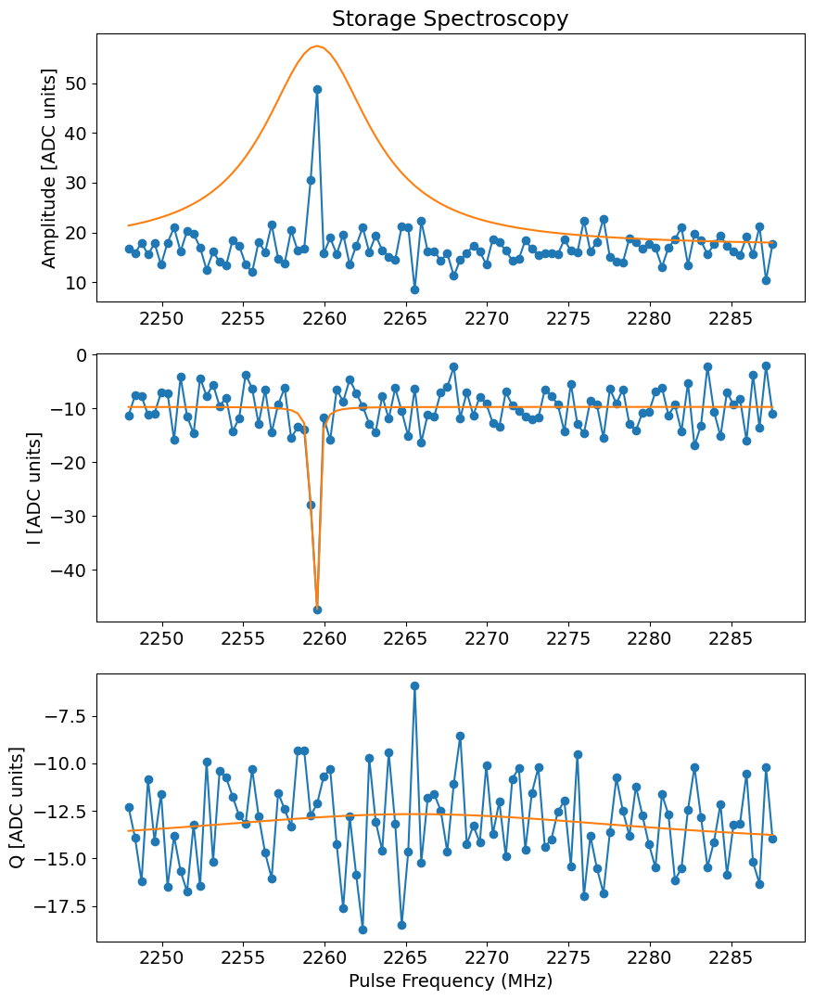

Found peak in amps at [MHz] 2259.550821509224, HWHM 3.959999999999991
Found peak in I at [MHz] 2259.395784133338, HWHM 0.10019756797177852
Found peak in Q at [MHz] 2265.547711249103, HWHM 19.07640121461822


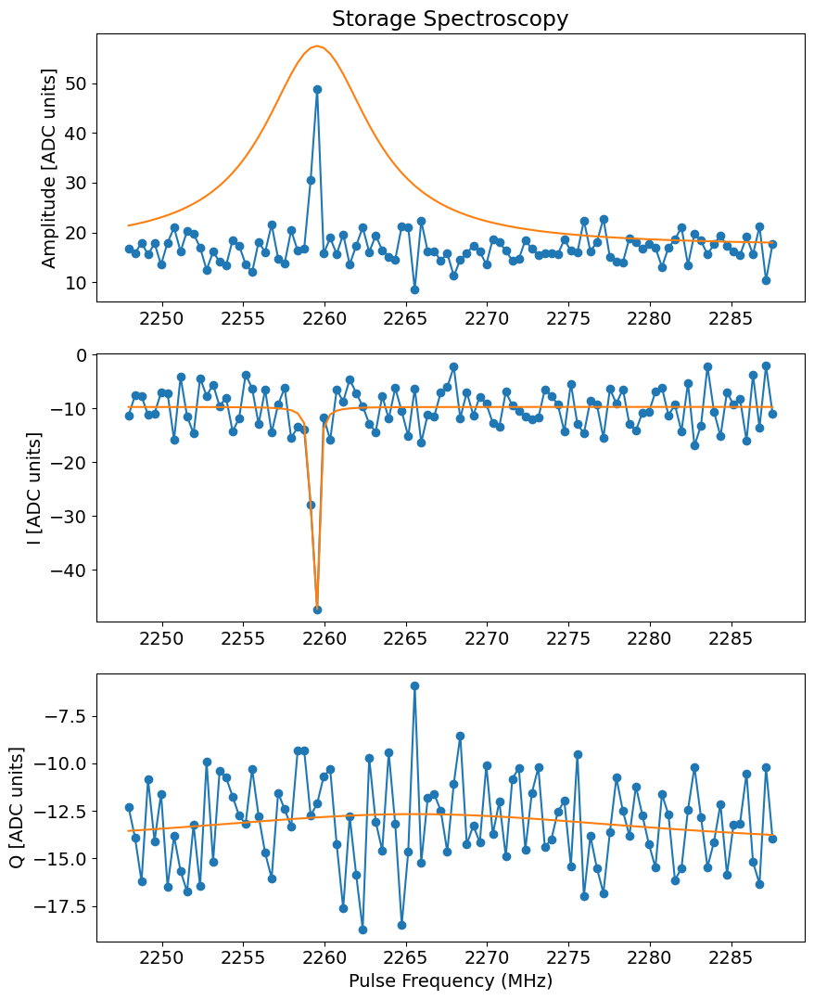

In [392]:
# Create runner
dump_spec_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.FluxSpectroscopyF0g1Experiment,
    default_expt_cfg=dump_spec_defaults,
    preprocessor=dump_spec_preproc,
    # postprocessor=dump_spec_postproc,
    job_client=client,
)

# Execute for dump modes
if expts_to_run.get('dump_spectroscopy', True):
    dump_specs = {}
    for dump_mode_no in [2]:  # specify which dump modes to run
        print(f'Running dump spectroscopy for mode {dump_mode_no}')
        dump_specs[dump_mode_no] = dump_spec_runner.execute(
            man_mode_no=1,
            dump_mode_no=dump_mode_no,
            flux_gain=3000,
            flux_length=20,
            # step=0.05,  # bw/expts = 100/200
            # span=30.0,
            # expts=600,
            span=40, #originally 20
            expts=100,
            # reps=300,
            # center_freq = 2200,
            # span=400, #originally 20
            # expts=4000*2,
            reps=100,
            # coupler_current=coupler_current,
        )
        dump_specs[dump_mode_no].display()

Found peak in amps at [MHz] 2259.550821509224, HWHM 3.959999999999991
Found peak in I at [MHz] 2259.395784133338, HWHM 0.10019756797177852
Found peak in Q at [MHz] 2265.547711249103, HWHM 19.07640121461822


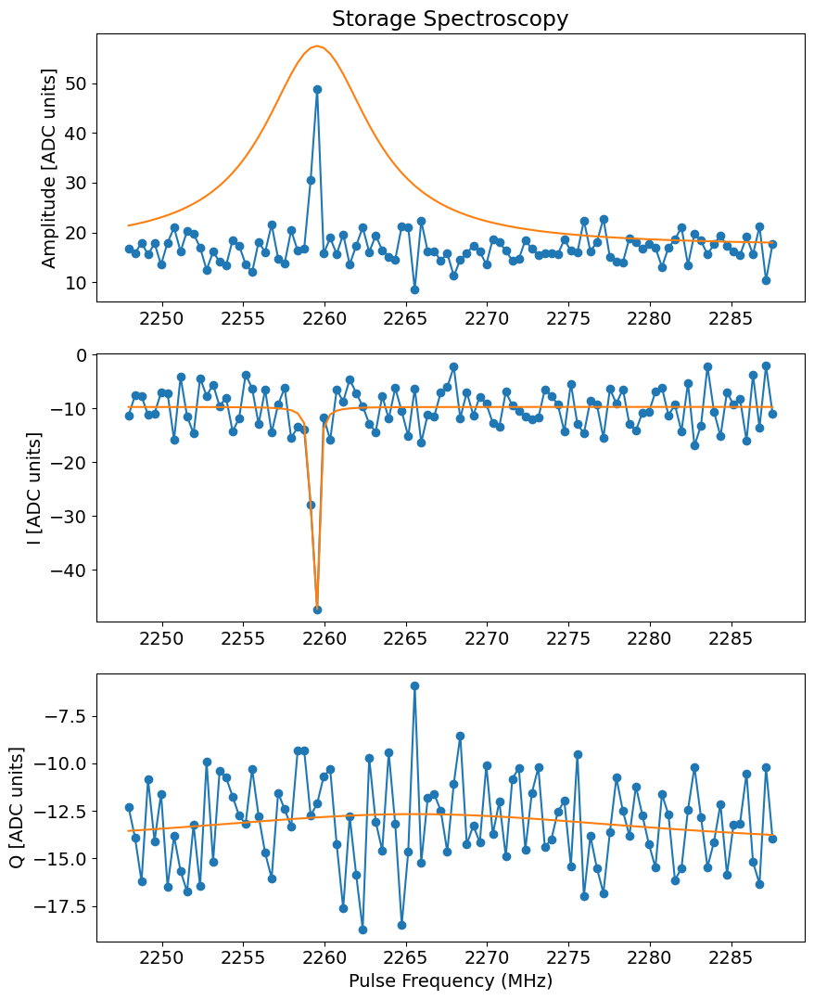

Updated frequency for M1-D2: 2259.3958 MHz
[CONFIG] Created new man1_storage_swap version CFG-M1-20260817-00064


In [393]:
dump_spec_postproc(station, dump_specs[2], man_mode_no=1,
            dump_mode_no=dump_mode_no)

In [ ]:
fig, ax = plt.subplots(figsize = (12, 4))
ax.plot(dump_specs[2].data['xpts'], dump_specs[2].data['avgi'])
# ax.set_xlim([2100, 2160])

In [ ]:
station.ds_storage.update_freq('M1-D2', 2295)


In [ ]:
station.ds_storage.get_freq('M1-D2')


In [ ]:
station.ds_storage.update_freq('M1-D2', 2254.2140925381445)
station.ds_storage.update_pi('M1-D2', 40.0)
station.ds_storage.update_h_pi('M1-D2', 20.0)
station.ds_storage.update_gain('M1-D2', 20000)


# station.ds_storage.update_pi('M1-S5', 0.0)
# station.ds_storage.update_h_pi('M1-S5', 0.0)
station.ds_storage.df
station.snapshot_man1_storage_swap(update_main=False)

### Dump chevron

Note that this experiment plays a flat top pulse by default while the spectroscopy plays a constant pulse.
The man reset code uses a flat top, so this is the one that should be used for the dump reset calibration!

In [394]:
from fitting.fit_display_classes import ChevronFitting
from datetime import datetime

# Configuration defaults for dump sideband sweep
dump_sideband_chevron_defaults = AttrDict(dict(
    start=0.007, # start time in us
    pi_len_sweep=2.0, # total sweep length in us
    expts=30, # num steps of time
    reps=50,
    rounds=1,
    qubit=0,
    qubits=[0],
    man_mode_no=1,
    prepulse=True,
    postpulse=True,
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    update_post_pulse_phase=[False, 0],
    relax_delay=2500,
))

def dump_sideband_chevron_preproc(station, default_expt_cfg, **kwargs):
    assert 'dump_mode_no' in kwargs
    
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    
    # Get dump mode parameters
    freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse = get_dump_mode_parameters(
        station.ds_storage, station.hardware_cfg, expt_cfg.man_mode_no, expt_cfg.dump_mode_no
    )

    print('Prepulse:', prepulse)
    print('Postpulse:', postpulse)

    dump_name = f'M{expt_cfg.man_mode_no}-D{expt_cfg.dump_mode_no}'
    
    pi_len_sweep = expt_cfg.pi_len_sweep
    expt_cfg.step = pi_len_sweep / (expt_cfg.expts - 1)
    if 'gain' in expt_cfg and expt_cfg.gain is not None:
        gain = expt_cfg.gain  # Override gain if provided
    
    # expt_cfg.flux_drive = [ch, freq, gain, 0]
    expt_cfg.flux_drive = ['high', freq, gain, 0]
    expt_cfg.pre_sweep_pulse = prepulse
    expt_cfg.post_sweep_pulse = postpulse
    
    print(f'Dump sideband chevron for {dump_name}: freq={freq:.3f} MHz, gain={gain}')
    
    return expt_cfg

def dump_sideband_chevron_postproc(station, mother_expt):
    expt_cfg = mother_expt.cfg.expt
    expt_cfg.man_mode_no = 1
    stor_name = f'M1-D{expt_cfg.dump_mode_no}'

    from fitting.fit_display_classes import ChevronFitting, Spectroscopy
    import fitting.fitting as fitter
    times = mother_expt.data['xpts'][0]
    freqs = mother_expt.data['freq_sweep']

    chevron_analysis = ChevronFitting(
        frequencies=freqs,
        time=times,
        response_matrix=mother_expt.data['avgi'],
        config=station.hardware_cfg,
        station=station,
    )
    # chevron_analysis.analyze() # we don't actually use the results of the analysis, just for plotting
    chevron_analysis.display_results()

    # Fit to spectroscopy sice decay dominates over rabi
    print("Fitting assumes single shot blobs are rotated correctly")
    signs = [1, -1, 1]
    fitting_data = dict(
        avgi=mother_expt.data['avgi'][:, -1],
        avgq=mother_expt.data['avgq'][:, -1],
        amps=mother_expt.data['amps'][:, -1],
        xpts=freqs
    )
    spec_analysis = Spectroscopy(fitting_data, signs=signs, config=station.hardware_cfg, station=station)
    spec_analysis.analyze(fit=True)
    mother_expt.analysis = spec_analysis
    t = times[-1]
    spec_analysis.display(title=f'Dump Mode Spectroscopy (t={t} us)')

    best_freq = spec_analysis.data["fit_avgi"][2]

    plt.figure(figsize=(5, 4))
    best_freq_cut_idx = np.argmin(np.abs(freqs - best_freq))
    best_freq_cut = mother_expt.data['avgi'][best_freq_cut_idx, :]
    plt.plot(times, best_freq_cut, '.-')

    # Fit to an exponential decay
    spec_analysis.data["fit_T1_avgi"], spec_analysis.data["fit_err_T1_avgi"] = fitter.fitexp(times, best_freq_cut, fitparams=None)
    best_freq_cut_fit = fitter.expfunc(times, *spec_analysis.data["fit_T1_avgi"])
    p = spec_analysis.data['fit_T1_avgi']
    pCov = spec_analysis.data['fit_err_T1_avgi']
    t1 = p[3]
    captionStr = f'$T_1$ fit [us]: {t1:.3} $\\pm$ {np.sqrt(pCov[3][3]):.3}'
    print("final avgi value at best frequency:", best_freq_cut[-1])
    plt.plot(times, best_freq_cut_fit, label=captionStr)
    plt.legend()
    plt.xlabel("Time (us)")
    plt.ylabel("avgi")
    plt.title(f"Response at Freq {freqs[best_freq_cut_idx]} MHz")
    plt.show()


    print(f"Best frequency found: {best_freq:.4f} MHz")
    station.ds_storage.update_freq(stor_name, best_freq)
    print(f"Updated {stor_name} frequency to {best_freq:.4f} MHz (ds_storage)")

    pi_len = 3 * t1
    station.ds_storage.update_pi(stor_name, pi_len)
    print('Updated the pi length to 3 T1:', pi_len, "(ds_storage)")

    station.ds_storage.update_h_pi(stor_name, pi_len / 2)
    print('Updated the h_pi length to:', pi_len / 2, "(ds_storage)")

    gain = expt_cfg.get('gain', station.ds_storage.get_gain(stor_name))
    station.ds_storage.update_gain(stor_name, gain)
    print('Updated gain to:', gain)

    station.snapshot_man1_storage_swap(update_main=False)


dump_sideband_chevron_runner = SweepRunner(
    station=station,
    ExptClass=meas.single_qubit.sideband_general.SidebandGeneralExperiment,
    default_expt_cfg=dump_sideband_chevron_defaults,
    sweep_param='freq',
    # sweep_param='gain',
    preprocessor=dump_sideband_chevron_preproc,
    postprocessor=dump_sideband_chevron_postproc,
    job_client=client,
)


Running dump sideband chevron for M1-D2
Flux channel manually set to 4
Prepulse: [[3566.089101467898, 3422.630777390371, 1992.653632685297], [9363, 7531, 8000], [0, 0, 0.5476647844018241], [0, 0, 0], [2, 2, 0], ['gauss', 'gauss', 'flat_top'], [0.035, 0.035, 0.005]]
Postpulse: [[1992.653632685297, 3422.630777390371], [8000, 7531], [0.5476647844018241, 0], [0, 0], [0, 2], ['flat_top', 'gauss'], [0.005, 0.035]]
Dump sideband chevron for M1-D2: freq=2259.396 MHz, gain=7000
Sweep: freq from 2258.895784133338 to 2259.895784133338 (11 pts)
  File: C:\experiments\260813_calibration_after_recooldown\data\00029_SidebandGeneralExperiment_sweep.h5
  Submitting 11 jobs...
Job submitted: JOB-20260817-00200 (queue position: 1)
Job submitted: JOB-20260817-00201 (queue position: 2)
Job submitted: JOB-20260817-00202 (queue position: 3)
Job submitted: JOB-20260817-00203 (queue position: 4)
Job submitted: JOB-20260817-00204 (queue position: 5)
Job submitted: JOB-20260817-00205 (queue position: 6)
Job subm

C:\python\multimode_expts\fitting\fit_display_classes.py:1962: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


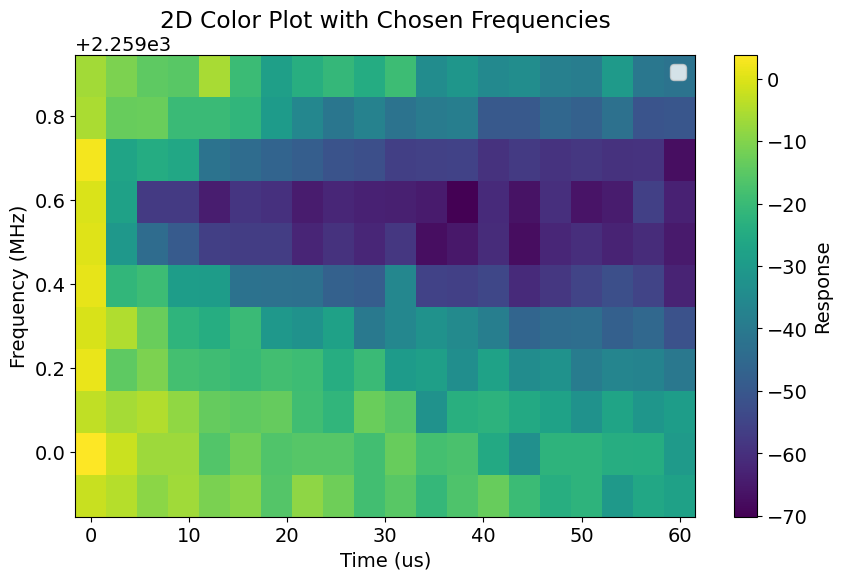

Fitting assumes single shot blobs are rotated correctly
Found peak in amps at [MHz] 2259.5469324612927, HWHM 0.4541437259488508
Found peak in I at [MHz] 2259.5556839167416, HWHM 0.3852639771468933
Found peak in Q at [MHz] 2259.395884277061, HWHM 0.0008344216854782659


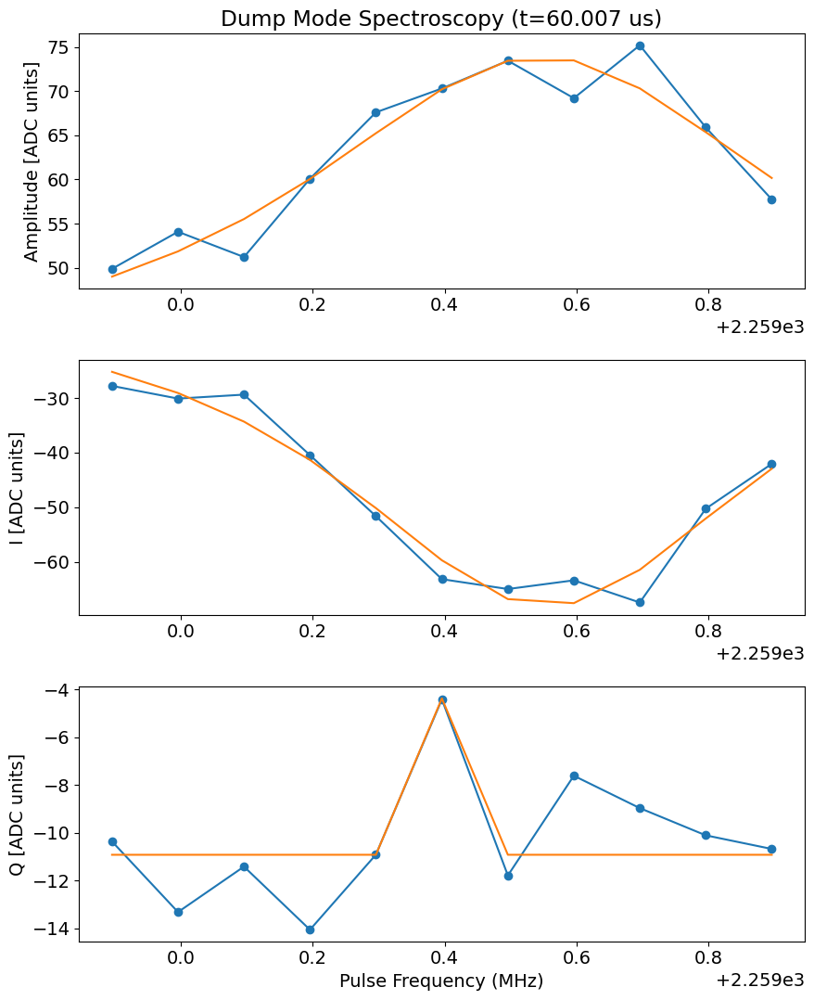

final avgi value at best frequency: -63.41775675675676


C:\python\multimode_expts\fitting\fitting.py:56: RuntimeWarning: overflow encountered in exp
  return y0 + yscale*np.exp(-(x-x0)/decay)


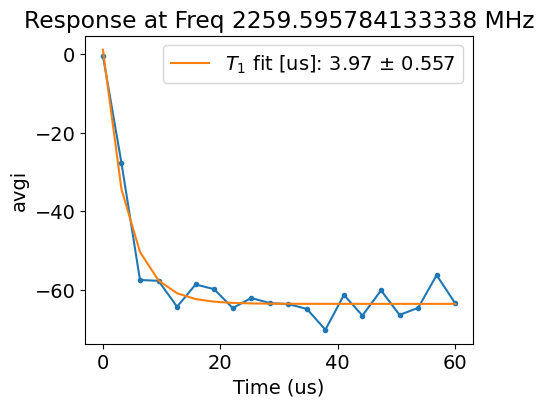

Best frequency found: 2259.5557 MHz
Updated M1-D2 frequency to 2259.5557 MHz (ds_storage)
Updated the pi length to 3 T1: 11.92408680463641 (ds_storage)
Updated the h_pi length to: 5.962043402318205 (ds_storage)
Updated gain to: 7000
[CONFIG] Created new man1_storage_swap version CFG-M1-20260817-00065
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid
uncertainty smells off, marking this line as invalid


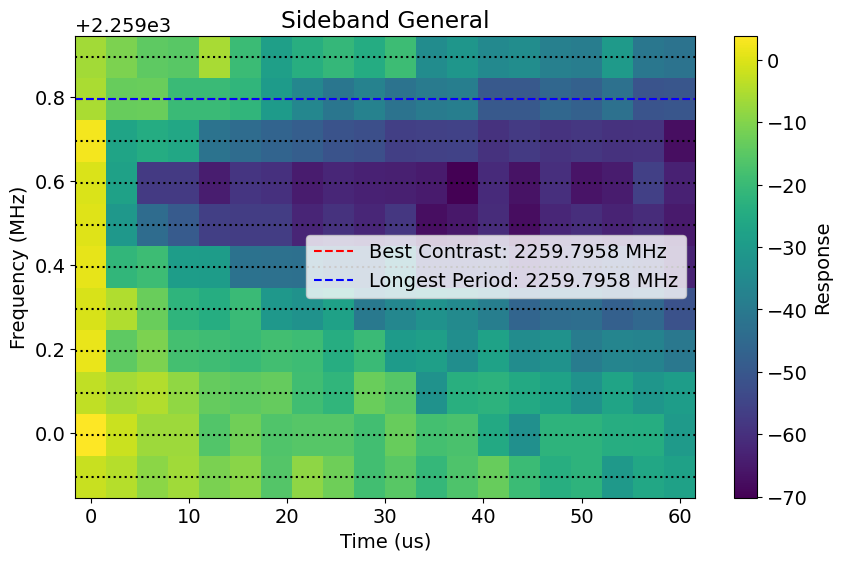

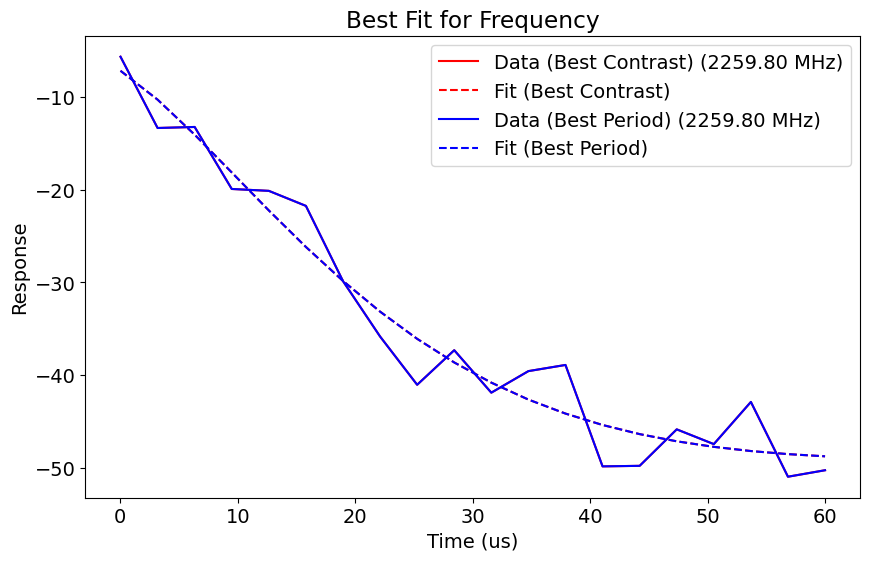

[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\Jonginn\QubitCalibration\2026\08\2026-08-17.md


In [395]:
# Run dump chevron for specified dump mode
dump_mode_no = 2
man_mode_no = 1

print(f'Running dump sideband chevron for M{man_mode_no}-D{dump_mode_no}')

# Get current frequency for sweep range
dump_name = f'M{man_mode_no}-D{dump_mode_no}'
center_freq = station.ds_storage.get_freq(dump_name)
# center_freq = 2314
freq_bw = 1 #10  # MHz bandwidth for frequency sweep
# freq_bw = 30  # MHz bandwidth for frequency sweep

dump_chevron = dump_sideband_chevron_runner.execute(
    dump_mode_no=dump_mode_no,
    man_mode_no=man_mode_no,
    sweep_start=center_freq - freq_bw/2,
    sweep_stop=center_freq + freq_bw/2,
    sweep_npts=11,
    pi_len_sweep=60.0,#100.0,
    expts=20,
    reps=100,
    gain=7000,
    # coupler_current=coupler_current,
    batch=True,
    # relax_delay=8000,
)


C:\python\multimode_expts\fitting\fit_display_classes.py:1962: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


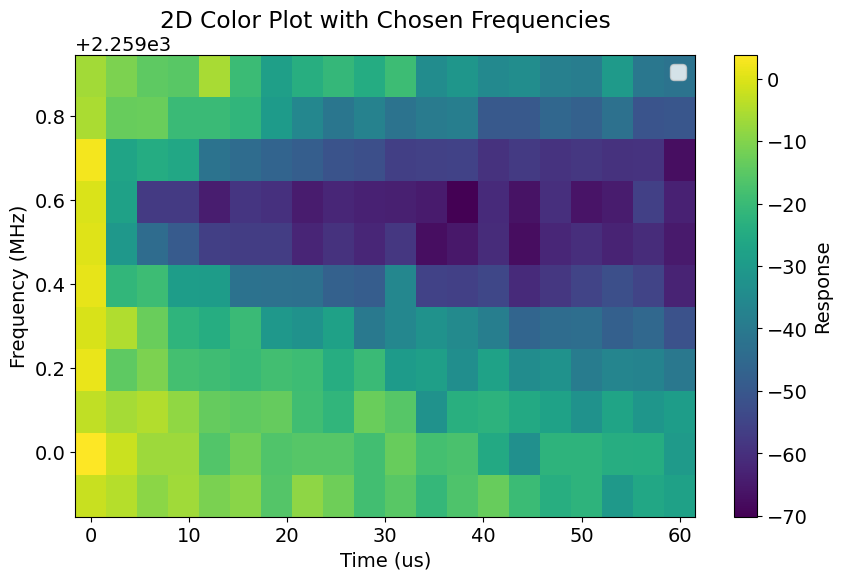

Fitting assumes single shot blobs are rotated correctly
Found peak in amps at [MHz] 2259.5469324612927, HWHM 0.4541437259488508
Found peak in I at [MHz] 2259.5556839167416, HWHM 0.3852639771468933
Found peak in Q at [MHz] 2259.395884277061, HWHM 0.0008344216854782659


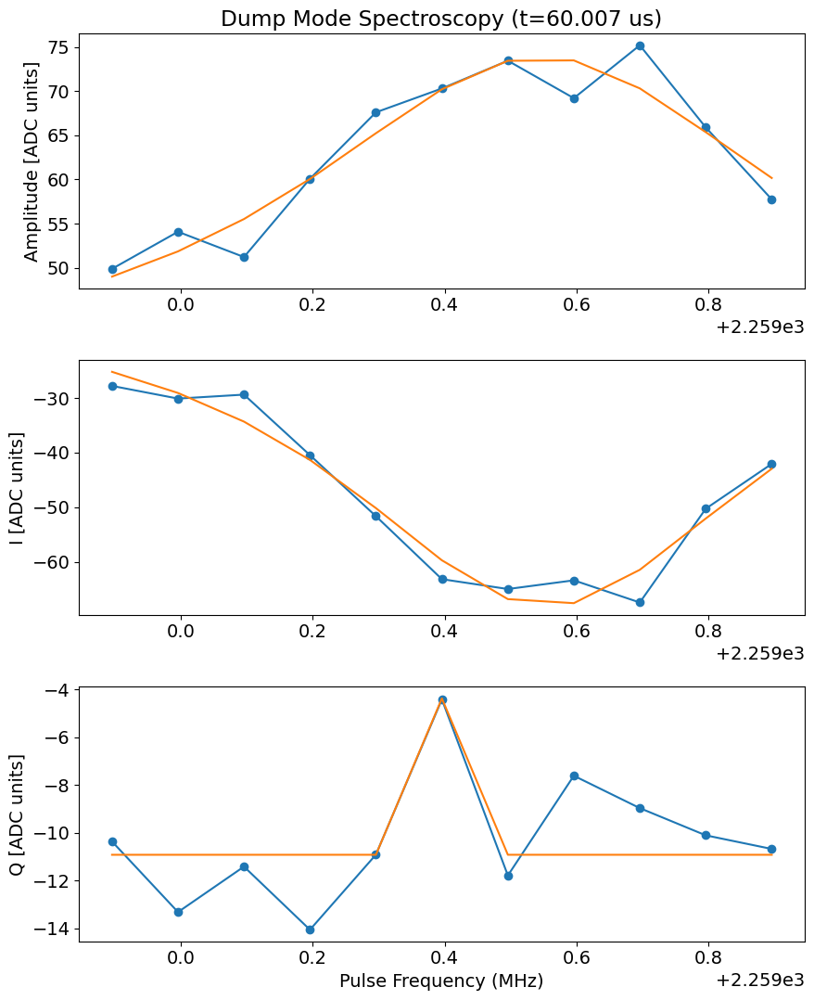

final avgi value at best frequency: -63.41775675675676


C:\python\multimode_expts\fitting\fitting.py:56: RuntimeWarning: overflow encountered in exp
  return y0 + yscale*np.exp(-(x-x0)/decay)


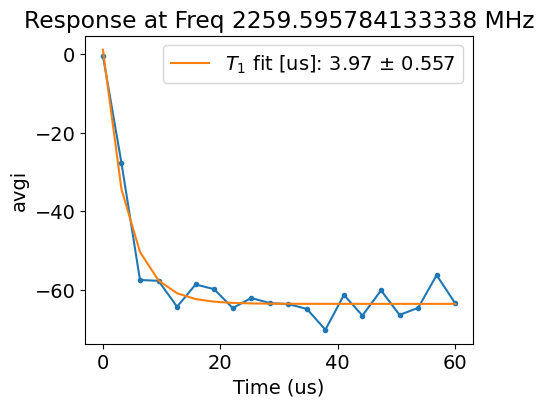

Best frequency found: 2259.5557 MHz
Updated M1-D2 frequency to 2259.5557 MHz (ds_storage)
Updated the pi length to 3 T1: 11.92408680463641 (ds_storage)
Updated the h_pi length to: 5.962043402318205 (ds_storage)
Updated gain to: 7000
[CONFIG] Created new man1_storage_swap version CFG-M1-20260817-00066


In [396]:
dump_sideband_chevron_postproc(station, dump_chevron)

In [397]:
station.ds_storage.update_pi('M1-D2', 50)
station.ds_storage.update_h_pi('M1-D2', 25)


In [398]:
station.update_all_station_snapshots()

[CONFIG] Reusing existing hardware_config version CFG-HW-20260817-00036
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Created new man1_storage_swap version CFG-M1-20260817-00067
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260814-00076
Config snapshots for current station:
  hardware_config: CFG-HW-20260817-00036
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260817-00067
  floquet_storage_swap: CFG-FL-20260814-00076


{'hardware_config': 'CFG-HW-20260817-00036',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260817-00067',
 'floquet_storage_swap': 'CFG-FL-20260814-00076'}

In [362]:
station.ds_storage.df

,stor_name,freq (MHz),precision (MHz),pi (mus),h_pi (mus),gain (DAC units),last_update,bs_rate_coeffs_g,bs_rate_coeffs_e,freq_coeffs_g,freq_coeffs_e,gain_range_g,gain_range_e,joint_parity,dr_ac_stark_rate,dr_jp_phase
0,M1-S1,345.951724,NaN,0.646111,0.323056,14804,2026-08-17 15:13:23.910769,"[2.71800440497595e-10, 3.5345716702085755e-05,...","[2.617101263255993e-10, 3.5294007231684914e-05...","[-5.581106410081517e-38, 3.497594370968036e-33...","[-5.787229142339564e-38, 3.802111265047564e-33...","[2823.494166114352, 10936.689003179721]","[2834.8504180018463, 11002.012121829115]","[352.95224967922866, 3259, 3.513105914802541, ...",NaN,NaN
1,M1-S2,517.184166,NaN,0.875106,0.437553,4958,2026-08-17 15:07:23.081405,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,M1-S3,709.035797,NaN,0.374665,0.187332,6000,2026-08-17 14:49:56.652892,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,M1-S4,872.782141,NaN,1.776124,0.888062,8058,2026-08-17 15:08:46.990974,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,M1-S5,1048.946435,NaN,2.372041,1.186021,7031,2026-08-17 15:10:08.528673,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,M1-S6,1240.703907,NaN,2.255071,1.127536,8056,2026-08-17 15:11:33.601278,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,M1-S7,1418.923656,NaN,1.350598,0.675299,11939,2026-08-17 15:15:07.536600,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,M1-S8,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,M1-S9,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,M1-S10,-1.000000,-1.00,-1.000000,-1.000000,-1,51:31.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
station.update_all_station_snapshots()

In [ ]:
sweep_start = center_freq - freq_bw/2
sweep_stop=center_freq + freq_bw/2
print(sweep_start)
print(sweep_stop)

In [ ]:
station.update_all_station_snapshots(update_main=False)

In [ ]:
station.ds_storage.df

### Check man-dump reset with parity delay

In [ ]:
mm_base_calib = MM_dual_rail_base(station.hardware_cfg, soccfg=station.soccfg)
parity_delay_defaults = AttrDict(dict(
    start=0.01,
    step=0.05,
    expts=50,
    reps=250,
    rounds=1,
    qubits=[0],
    parity_fast=True,
    normalize=False,
    active_reset=False,
    man_reset=True,
    gate_based=False,
    storage_reset=True,
    man_mode_no=1,
    relax_delay=2500, 
    param_to_calib='length', # length or ac_stark_shift 
    shift_sign=1, # 1 or -1 for ac stark shift direction
    reset_dump_mode = 1, # which dump mode to do a reset on before the parity
    ))


def parity_delay_preproc(station, default_expt_cfg, **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    if 'param_to_calib' in expt_cfg and expt_cfg.param_to_calib =='ac_stark_shift':
        expt_cfg.prepulse = False
        expt_cfg.pre_sweep_pulse = []
    elif 'param_to_calib' in expt_cfg and expt_cfg.param_to_calib =='length':
        expt_cfg.prepulse = True
        pre_sweep_pulse = mm_base_calib.prep_man_photon(man_no=expt_cfg.man_mode_no, photon_no=1)
        pre_sweep_pulse = mm_base_calib.get_prepulse_creator(pre_sweep_pulse, station.hardware_cfg).pulse.tolist()
        expt_cfg.pre_sweep_pulse = pre_sweep_pulse
    return expt_cfg

def parity_delay_postproc(station, expt):
    from fitting.fit_display_classes import LengthRabiFitting
    # Analyze the data
    length_rabi_analysis = LengthRabiFitting(expt.data, config = expt.cfg)
    length_rabi_analysis.analyze(fitparams = [100, 0.1, 0, None, None, None])
    length_rabi_analysis.display(title_str='Length Rabi General F0g1')
    expt_cfg = expt.cfg.expt
    man_mode_no = expt_cfg.man_mode_no
    shift_sign = expt_cfg.shift_sign


    if expt_cfg.param_to_calib == 'length':
        delay = length_rabi_analysis.results['pi_length']
        print(f'Fitted revival time: {delay} us')
        old_delay = station.hardware_cfg.device.manipulate.revival_time[man_mode_no - 1]
        station.hardware_cfg.device.manipulate.revival_time[man_mode_no - 1] = delay

        print("WARNING, NOT UPDATING ANY CONFIG PARAMS")
        # print(f'Updated revival time for mode {man_mode_no}: {old_delay} -> {station.hardware_cfg.device.manipulate.revival_time[man_mode_no - 1]}')

    elif expt_cfg.param_to_calib == 'ac_stark_shift': 
        freq = length_rabi_analysis.data['fit_avgi'][1]
        print(f'Fitted ac Stark shift: {freq} MHz')
        old_freq = station.hardware_cfg.device.manipulate.revival_stark_shift[man_mode_no - 1]

        print("WARNING, NOT UPDATING ANY CONFIG PARAMS")
        # station.hardware_cfg.device.manipulate.revival_stark_shift[man_mode_no - 1] += shift_sign * freq
        # print(f'Updated ac Stark shift for mode {man_mode_no}: {old_freq} -> {station.hardware_cfg.device.manipulate.revival_stark_shift[man_mode_no - 1]}')

In [ ]:
parity_delay_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ParityDelayExperiment,
    default_expt_cfg=parity_delay_defaults,
    # postprocessor=parity_delay_postproc,
    preprocessor=parity_delay_preproc,
    job_client=client,
)

parity_delay_ac_stark = parity_delay_runner.execute(
    param_to_calib='length', 
    # step=0.2,
    # expts=100,
    # reps=100,
    step=0.3,
    expts=20,
    reps=3000,
    shift_sign=+1,
    active_reset=True,
    man_reset=True,
    parity_fast=False,
    storage_reset=False,
    relax_delay=250,
)

In [ ]:
parity_delay_ac_stark.display(fit=False)

In [ ]:
parity_delay_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ParityDelayExperiment,
    default_expt_cfg=parity_delay_defaults,
    postprocessor=parity_delay_postproc,
    preprocessor=parity_delay_preproc,
    job_client=client,
)

parity_delay_ac_stark = parity_delay_runner.execute(
    param_to_calib='ac_stark_shift', 
    step=0.3,
    expts=20,
    reps=3000,
    shift_sign=+1,

    parity_fast=False,

    active_reset=True,
    man_reset=True,
    storage_reset=False,
    relax_delay=2500, 
)

In [ ]:
parity_delay_ac_stark.display(fit=False)

In [ ]:
data1 = meas.ParityDelayExperiment.from_h5file('D:\\experiments\\260206_dump_mode\\data\\JOB-20260212-00251_ParityDelayExperiment.h5')

data2 = meas.ParityDelayExperiment.from_h5file('D:\\experiments\\260206_dump_mode\\data\\JOB-20260212-00250_ParityDelayExperiment.h5')

plt.figure()
plt.plot(data1.data['xpts'], data1.data['amps'], label='No active reset')
plt.plot(data2.data['xpts'], data2.data['amps'], label='Active reset')
plt.legend()
plt.xlabel('Delay (us)')
plt.ylabel('Amplitude')
plt.show()

### Check man-dump reset with single shot

In [ ]:
station.ds_storage.get_pi('M1-D2')

In [ ]:
station.ds_storage.update_pi('M1-D2', 40)

In [ ]:
default_cfg = AttrDict(dict(
    expts=1,
    reps=100,
    rounds=1,
    qubits=[0],
    ro_stor=0, # storage mode number that gets read out in the end
    init_fock=False,
    perform_wigner=False,
    parity_fast=False,
    dummys=[0],
    swept_params = ['dummy'],
    normalize=False,
    active_reset=False,
    man_reset=False, 
    storage_reset=False, 
    parity_check = False,
    prepulse=False,
    postpulse=True,
    init_alpha = 0
))

man_dump_ver_relax_delay = 2000

def verification_preproc(station, 
                         default_expt_cfg, 
                         man_mode_no = 1,
                         **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    mm_base_dummy = MM_dual_rail_base(station.hardware_cfg, soccfg=station.soccfg)
    prep_man_pi = mm_base_dummy.prep_man_photon(man_mode_no) #pulse cfg for preparing man into 1: pi_ge -> pi_ef -> M_pi
    # prepulse = mm_base_dummy.get_prepulse_creator(prep_man_pi[-1:-3:-1]).pulse.tolist()
    # expt_cfg.pre_sweep_pulse = prepulse
    postpulse = mm_base_dummy.get_prepulse_creator(prep_man_pi[-1:-3:-1]).pulse.tolist() # M_pi-> pi_ef (mapping man 1 to e state)
    expt_cfg.post_sweep_pulse = postpulse
    return expt_cfg

debug_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    # ExptProgram=meas.qsim.t2_cavity_fluxexcursion.ActiveResetVerificationProgram,
    ExptProgram=meas.qsim.t2_cavity_fluxexcursion.MActiveResetVerificationProgram,
    default_expt_cfg=default_cfg,
    preprocessor=verification_preproc,
    postprocessor=None,
    job_client=client,
)

debug = debug_runner.execute(
    init_stor = 0,
    reps = 3000,
    relax_delay = man_dump_ver_relax_delay,
    active_reset=True,
    man_reset=False, 
    storage_reset=False
)

debug1 = debug_runner.execute(
    init_stor = 0,
    reps = 3000,
    relax_delay = man_dump_ver_relax_delay,
    active_reset=True,
    man_reset=True, 
    storage_reset=False,
    reset_dump_mode = 2
)


In [ ]:
np.shape(np.array(debug1.data['idata'][0]))

In [ ]:
plt.plot(np.array(debug.data['idata'])[0, 2::3], label = 'without active reset')
plt.plot(np.array(debug1.data['idata'])[0, 2::3], label = 'with active reset')
plt.legend()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

i_wo = np.array(debug.data['idata'])[0, 2::3]
q_wo = np.array(debug.data['qdata'])[0, 2::3]

i_w = np.array(debug1.data['idata'])[0, 2::3]
q_w = np.array(debug1.data['qdata'])[0, 2::3]

i_th = -25
q_th = -20

def calc_populations(i_data, q_data, i_th, q_th):
    total = len(i_data)
    
    cnt_left = np.sum(i_data < i_th)
    cnt_top_right = np.sum((i_data >= i_th) & (q_data >= q_th))
    cnt_bot_right = np.sum((i_data >= i_th) & (q_data < q_th))
    
    p_left = cnt_left / total * 100
    p_top_right = cnt_top_right / total * 100
    p_bot_right = cnt_bot_right / total * 100
    
    return p_left, p_top_right, p_bot_right

pop_wo = calc_populations(i_wo, q_wo, i_th, q_th)
pop_w = calc_populations(i_w, q_w, i_th, q_th)

title_wo = f"g: {pop_wo[0]:.1f}%, f: {pop_wo[1]:.1f}%, e: {pop_wo[2]:.1f}%"
title_w = f"g: {pop_w[0]:.1f}%, f: {pop_w[1]:.1f}%, e: {pop_w[2]:.1f}%"

fig, ax = plt.subplots(1, 3 , figsize = (24,8))
color_list = ['red', 'black']
transp = 0.5

ax[0].scatter(i_wo, q_wo, label = 'without active man reset', color = color_list[0], alpha = transp)
ax[0].scatter(i_w, q_w, label = 'with active man reset', color = color_list[1], alpha = transp)
ax[0].set_xlabel("I (ADC unt)")
ax[0].set_ylabel("Q (ADC unt)")
ax[0].set_title("Combined View")
ax[0].legend()

ax[1].scatter(i_wo, 
              q_wo, 
            #   label = 'without active reset', 
              color = color_list[0],
              alpha = transp)
ax[1].set_xlabel("I (ADC unt)")
ax[1].set_ylabel("Q (ADC unt)")
ax[1].set_title(f"Without Man Reset\n{title_wo}")

ax[2].scatter(i_w, 
              q_w, 
            #   label = 'with active reset', 
              color = color_list[1],
              alpha = transp)
ax[2].set_title(f"With Man Reset\n{title_w}")
ax[2].set_xlabel("I (ADC unt)")
ax[2].set_ylabel("Q (ADC unt)")

for axis in ax:
    axis.axvline(i_th, color='gray', linestyle='--', alpha=0.8)
    axis.hlines(q_th, xmin=i_th, xmax=axis.get_xlim()[1], color='gray', linestyle='--', alpha=0.8)


fig.tight_layout()
plt.show()

In [ ]:
station.update_all_station_snapshots(update_main=False)

### Man-Dump reset parameter optimization

In [ ]:
default_cfg = AttrDict(dict(
    expts=1,
    reps=100,
    rounds=1,
    qubits=[0],
    ro_stor=0, # storage mode number that gets read out in the end
    init_fock=False,
    perform_wigner=False,
    parity_fast=False,
    dummys=[0],
    swept_params = ['dummy'],
    normalize=False,
    active_reset=False,
    man_reset=False, 
    storage_reset=False, 
    parity_check = False,
    prepulse=False,
    postpulse=True,
    init_alpha = 0
))

man_dump_ver_relax_delay = 0.2
station.ds_storage.update_pi('M1-D2', 40)

def verification_preproc(station, 
                         default_expt_cfg, 
                         man_mode_no = 1,
                         **kwargs):
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    mm_base_dummy = MM_dual_rail_base(station.hardware_cfg, soccfg=station.soccfg)
    prep_man_pi = mm_base_dummy.prep_man_photon(man_mode_no) #pulse cfg for preparing man into 1: pi_ge -> pi_ef -> M_pi
    # prepulse = mm_base_dummy.get_prepulse_creator(prep_man_pi[-1:-3:-1]).pulse.tolist()
    # expt_cfg.pre_sweep_pulse = prepulse
    postpulse = mm_base_dummy.get_prepulse_creator(prep_man_pi[-1:-3:-1]).pulse.tolist() # M_pi-> pi_ef (mapping man 1 to e state)
    expt_cfg.post_sweep_pulse = postpulse
    return expt_cfg

debug_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.QsimBaseExperiment,
    # ExptProgram=meas.qsim.t2_cavity_fluxexcursion.ActiveResetVerificationProgram,
    ExptProgram=meas.qsim.t2_cavity_fluxexcursion.MActiveResetVerificationProgram,
    default_expt_cfg=default_cfg,
    preprocessor=verification_preproc,
    postprocessor=None,
    job_client=client,
)

debug1 = debug_runner.execute(
    init_stor = 0,
    reps = 30000,
    relax_delay = man_dump_ver_relax_delay,
    active_reset=True,
    man_reset=True, 
    storage_reset=False
)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

i_1 = np.array(debug1.data['idata'])[0, 0::3]
q_1 = np.array(debug1.data['qdata'])[0, 0::3]

i_2 = np.array(debug1.data['idata'])[0, 1::3]
q_2 = np.array(debug1.data['qdata'])[0, 1::3]

i_3 = np.array(debug1.data['idata'])[0, 2::3]
q_3 = np.array(debug1.data['qdata'])[0, 2::3]

i_list = [i_1, i_2, i_3]
q_list = [q_1, q_2, q_3]

i_th = -100
q_th = -200

def calc_populations(i_data, q_data, i_th, q_th):
    total = len(i_data)
    
    cnt_left = np.sum(i_data < i_th)
    cnt_top_right = np.sum((i_data >= i_th) & (q_data >= q_th))
    cnt_bot_right = np.sum((i_data >= i_th) & (q_data < q_th))
    
    p_left = cnt_left / total * 100
    p_top_right = cnt_top_right / total * 100
    p_bot_right = cnt_bot_right / total * 100
    
    return p_left, p_top_right, p_bot_right

# pop_1 = calc_populations(i_1, q_1, i_th, q_th)
# pop_2 = calc_populations(i_2, q_2, i_th, q_th)
# pop_3 = calc_populations(i_3, q_3, i_th, q_th)
pop_list = [calc_populations(i_list[i], q_list[i], i_th, q_th) for i in range(3)]
title_list = [f"g: {pop_list[i][0]:.1f}%, f: {pop_list[i][1]:.1f}%, e: {pop_list[i][2]:.1f}%" for i in range(3)]
label_list = [
    "After $\\pi_{ge}\\rightarrow\\pi_{ef}\\rightarrow M_{\\pi}$",
    "After ge active reset",
    "After $M_{\\pi}\\rightarrow\\pi_{ef}$"
]
# title_1 = f"g: {pop_1[0]:.1f}%, f: {pop_1[1]:.1f}%, e: {pop_1[2]:.1f}%"
# title_2 = f"g: {pop_2[0]:.1f}%, f: {pop_2[1]:.1f}%, e: {pop_2[2]:.1f}%"
# title_3 = f"g: {pop_3[0]:.1f}%, f: {pop_3[1]:.1f}%, e: {pop_3[2]:.1f}%"



fig, ax = plt.subplots(1, 3 , figsize = (24,8))
color_list = ['red', 'black']
transp = 0.05
for i in range(3):
    ax[i].scatter(i_list[i], 
                  q_list[i], 
                label = label_list[i], 
                color = color_list[0], 
                alpha = transp)
    ax[i].set_xlabel("I (ADC unt)")
    ax[i].set_ylabel("Q (ADC unt)")
    ax[i].set_title(label_list[i]+"\n"+title_list[i])
    ax[i].legend()

# ax[1].scatter(i_wo, 
#               q_wo, 
#             #   label = 'without active reset', 
#               color = color_list[0],
#               alpha = transp)
# ax[1].set_xlabel("I (ADC unt)")
# ax[1].set_ylabel("Q (ADC unt)")
# ax[1].set_title(f"Without Man Reset\n{title_wo}")

# ax[2].scatter(i_w, 
#               q_w, 
#             #   label = 'with active reset', 
#               color = color_list[1],
#               alpha = transp)
# ax[2].set_title(f"With Man Reset\n{title_w}")
# ax[2].set_xlabel("I (ADC unt)")
# ax[2].set_ylabel("Q (ADC unt)")

for axis in ax:
    axis.axvline(i_th, color='gray', linestyle='--', alpha=0.8)
    axis.hlines(q_th, xmin=i_th, xmax=axis.get_xlim()[1], color='gray', linestyle='--', alpha=0.8)


fig.tight_layout()
plt.show()

### Ringdown Analysis (to be deleted..)

In [ ]:
rlx_del_com_mda_list = np.linspace(0, 0.5, 51)
debug1_list = []
for rlx_del_com_mda in tqdm(rlx_del_com_mda_list):
    debug1 = debug_runner.execute(
        init_stor = 0,
        reps = 30000,
        relax_delay = rlx_del_com_mda,
        active_reset=True,
        man_reset=True, 
        storage_reset=False
    )
    debug1_list.append(debug1)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

i_th = -100
q_th = -200

g_population_first_stage = []
for debug1 in debug1_list:
    i_1 = np.array(debug1.data['idata'])[0, 0::3]
    q_1 = np.array(debug1.data['qdata'])[0, 0::3]

    i_2 = np.array(debug1.data['idata'])[0, 1::3]
    q_2 = np.array(debug1.data['qdata'])[0, 1::3]

    i_3 = np.array(debug1.data['idata'])[0, 2::3]
    q_3 = np.array(debug1.data['qdata'])[0, 2::3]

    i_list = [i_1, i_2, i_3]
    q_list = [q_1, q_2, q_3]

    pop_list = [calc_populations(i_list[i], q_list[i], i_th, q_th) for i in range(3)]
    title_list = [f"g: {pop_list[i][0]:.1f}%, f: {pop_list[i][1]:.1f}%, e: {pop_list[i][2]:.1f}%" for i in range(3)]
    label_list = [
        "After $\\pi_{ge}\\rightarrow\\pi_{ef}\\rightarrow M_{\\pi}$",
        "After ge active reset",
        "After $M_{\\pi}\\rightarrow\\pi_{ef}$"
    ]
    g_population_first_stage.append(pop_list[0][0])

fig, ax = plt.subplots()
ax.scatter(rlx_del_com_mda_list, 
           g_population_first_stage)
fig.tight_layout()
plt.show()

In [ ]:
station.ds_storage.get_pi('M1-D2')

In [ ]:
station.update_all_station_snapshots(update_main = False)

## Man-coupler (to be updated)

In [ ]:
def get_coupler_parameters(ds_storage, config_thisrun, man_mode_no):
    """
    Get pulse parameters for a given storage mode. 
    Also returns prepulse and postpulse (single photon prep and meas for ge meas)

    Args:
        ds_storage: Dataset object for managing frequency data.
        config_thisrun: Configuration dictionary for the current run.
        man_mode_no: Manipulation mode number.
        dump_mode_no: Dump mode number.

    Returns:
        A tuple containing freq, gain, ch, prepulse, and postpulse.
    """
    stor_name = 'M' + str(man_mode_no) + '-C'
    freq = ds_storage.get_freq(stor_name)
    gain = ds_storage.get_gain(stor_name)
    pi_len = ds_storage.get_pi(stor_name)
    h_pi_len = ds_storage.get_h_pi(stor_name)
    ch = 'low' if freq < 1000 else 'high'

    from experiments.MM_dual_rail_base import MM_dual_rail_base
    mm_base_dummy = MM_dual_rail_base(config_thisrun, soccfg=soc)
    prep_man_pi = mm_base_dummy.prep_man_photon(man_mode_no)
    prepulse = mm_base_dummy.get_prepulse_creator(prep_man_pi).pulse.tolist()
    postpulse = mm_base_dummy.get_prepulse_creator(prep_man_pi[-1:-3:-1]).pulse.tolist() # for ge meas, only do f0g1 and ef pi

    prepulse_overwrite = [['multiphoton', 'g0-e0', 'pi', 0],
                            ['multiphoton', 'e0-f0', 'pi', 0],
                            ['multiphoton', 'f0-g1', 'pi', 0]
                        ]
    postpulse_overwrite = [ ['multiphoton', 'f0-g1', 'pi', 0],
                            ['multiphoton', 'e0-f0', 'pi', 0]]
    prepulse = mm_base_dummy.get_prepulse_creator(prepulse_overwrite).pulse.tolist()
    postpulse = mm_base_dummy.get_prepulse_creator(postpulse_overwrite).pulse.tolist()

    return freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse


def do_coupler_spectroscopy(config_thisrun, 
                         ds_storage, 
                         expt_path, 
                         config_path, 
                         man_mode_no = 1, 
                         dump_no = 1,
                         flux_gain = 5000,
                         flux_length = 1):
    """
    Run the Flux Spectroscopy F0g1 Experiment.

    This function performs a flux spectroscopy experiment to measure the transition frequency
    between the f0 and g1 states of a qubit. It configures the experiment parameters, executes
    the experiment, and saves the results.

    Args:
        config_thisrun (AttrDict): Configuration dictionary for the current run.
        ds_storage (dataset.storage_man_swap_dataset): Dataset object for managing frequency data.
        expt_path (str): Path to save the experiment results.
        config_path (str): Path to the configuration file.
        man_mode_no (int, optional): Manipulation mode number (default is 1).
        dump_no (int, optional): Storage mode number (default is 1).

    Returns:
        FluxSpectroscopyF0g1Experiment: The experiment object containing the results.
    """
    flux_spec = meas.single_qubit.rf_flux_spectroscopy_f0g1.FluxSpectroscopyF0g1Experiment(
        soccfg=soc, path=expt_path, prefix='FluxSpectroscopyF0g1Experiment', config_file=config_path
    )

    flux_spec.cfg = AttrDict(deepcopy(config_thisrun))

    freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse = get_coupler_parameters(ds_storage, config_thisrun,
                                                                      man_mode_no)

    # freq = 420

    flux_spec.cfg.expt = dict(
        start=freq - 50,  # Start RF frequency [MHz]
        step=1,  # Step size [MHz]
        expts=100,  # Number of experiments
        reps=200,  # Number of averages per point
        qubit=[0],
        flux_drive=[ch, 1, flux_gain, flux_length],  # RF flux modulation parameters [low/high (ch), freq (will be overwritten), gain, length(us)]
        prepulse=True,
        postpulse=True,
        active_reset=False,
        man_reset=False,
        storage_reset=False,
        pre_sweep_pulse= prepulse,
        post_sweep_pulse= postpulse,
    )

    flux_spec.cfg.device.readout.relax_delay = [2500]  # Wait time between experiments [us]
    flux_spec.go(analyze=False, display=False, progress=True, save=True)
    return flux_spec


def update_dump_spectroscopy(flux_spec, ds_storage, man_mode_no = 1):
    """Update the configuration based on Flux Spectroscopy F0g1 experiment results."""
    # Update the dataset with the new frequency
    ds_storage.update_freq('M' + str(man_mode_no) + '-C', flux_spec.data['fit'][2])
    print(f"Updated frequency for M{man_mode_no}-C: {flux_spec.data['fit'][2]}")

ds_storage.update_freq('M' + str(1) + '-C', 919)

In [ ]:
spec = do_coupler_spectroscopy(config_thisrun, ds_storage, expt_path, config_path, man_mode_no=1,
                            flux_gain=10000, flux_length=2)
# analyze_and_display_stor_spectroscopy(spec)
# update_dump_spectroscopy(spec, ds_storage, 1, 1)
spec.analyze(fit=True)
spec.display()

## Freq Chevron

In [410]:
from datetime import datetime

# Configuration defaults for sideband sweep
sideband_chevron_defaults = AttrDict(dict(
    start=0.007, # start time in us
    pi_len_sweep=2.0, # total sweep length in us
    expts=25, # num steps of time
    reps=50,
    rounds=1,
    qubit=0,
    qubits=[0],
    man_mode_no=1,
    prepulse=True,
    postpulse=True,
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    update_post_pulse_phase=[False, 0],
    relax_delay=2500,
))

def sideband_chevron_preproc(station, default_expt_cfg, **kwargs):
    assert 'stor_mode_no' in kwargs
    
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    
    # Get storage mode parameters
    freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse = get_storage_mode_parameters(
        station.ds_storage, station.hardware_cfg, expt_cfg.man_mode_no, expt_cfg.stor_mode_no
    )

    stor_name = f'M{expt_cfg.man_mode_no}-S{expt_cfg.stor_mode_no}'
    
    pi_len_sweep = expt_cfg.pi_len_sweep
    expt_cfg.step = pi_len_sweep / (expt_cfg.expts - 1)
    if 'gain' in expt_cfg and expt_cfg.gain is not None:
        gain = expt_cfg.gain  # Override gain if provided
    if expt_cfg.get("freq", None) is not None:
        freq = expt_cfg.freq
        print(f"frequency overrided to {freq} MHz")
    expt_cfg.flux_drive = [ch, freq, gain, 0]
    expt_cfg.pre_sweep_pulse = prepulse
    expt_cfg.post_sweep_pulse = postpulse
    
    print(f'Sideband chevron for {stor_name}: freq={freq:.3f} MHz, gain={gain}')
    
    return expt_cfg

def sideband_chevron_postproc(station, mother_expt):
    expt_cfg = mother_expt.cfg.expt
    print('mom', expt_cfg)
    stor_name = f'M{expt_cfg.man_mode_no}-S{expt_cfg.stor_mode_no}'

    from fitting.fit_display_classes import ChevronFitting

    chevron_analysis = ChevronFitting(
        frequencies=mother_expt.data['freq_sweep'],
        time=mother_expt.data['xpts'][0],
        response_matrix=mother_expt.data['avgi'],
        config=station.hardware_cfg,
        station=station,
    )

    chevron_analysis.analyze()
    
    best_freq = chevron_analysis.results.get('best_frequency_contrast')
        
    if best_freq and not expt_cfg.get("skip_update", False):
        print(f"Best frequency found: {best_freq:.4f} MHz")
        station.ds_storage.update_freq(stor_name, best_freq)
        print(f"Updated {stor_name} frequency to {best_freq:.4f} MHz")
        pi_len = abs(np.pi / chevron_analysis.results['best_fit_params_period']['omega'])
        station.ds_storage.update_pi(stor_name, pi_len)
        print('Updated the pi length to:', pi_len)
        station.ds_storage.update_h_pi(stor_name, pi_len / 2)
        print('Updated the h_pi length to:', pi_len / 2)
        station.ds_storage.update_gain(stor_name, expt_cfg.flux_drive[2])
        print('Updated gain to:', expt_cfg.flux_drive[2])
    mother_expt.analysis = chevron_analysis
    # station.snapshot_man1_storage_swap(update_main=False)

sideband_chevron_runner = SweepRunner(
    station=station,
    ExptClass=meas.single_qubit.sideband_general.SidebandGeneralExperiment,
    default_expt_cfg=sideband_chevron_defaults,
    sweep_param='freq',
    preprocessor=sideband_chevron_preproc,
    postprocessor=sideband_chevron_postproc,
    job_client=client
)

Running sideband chevron for M1-S4
Sideband chevron for M1-S4: freq=868.706 MHz, gain=10000
Sweep: freq from 867.4559619351489 to 869.9559619351489 (11 pts)
  File: C:\experiments\260813_calibration_after_recooldown\data\00040_SidebandGeneralExperiment_sweep.h5
  Submitting 11 jobs...
Job submitted: JOB-20260817-00347 (queue position: 1)
Job submitted: JOB-20260817-00348 (queue position: 2)
Job submitted: JOB-20260817-00349 (queue position: 3)
Job submitted: JOB-20260817-00350 (queue position: 4)
Job submitted: JOB-20260817-00351 (queue position: 5)
Job submitted: JOB-20260817-00352 (queue position: 6)
Job submitted: JOB-20260817-00353 (queue position: 6)
Job submitted: JOB-20260817-00354 (queue position: 6)
Job submitted: JOB-20260817-00355 (queue position: 6)
Job submitted: JOB-20260817-00356 (queue position: 10)
Job submitted: JOB-20260817-00357 (queue position: 10)
  All 11 jobs submitted. Waiting for results...
  [1/11] freq=867.4560 [WORKER] Loading SidebandGeneralExperiment from

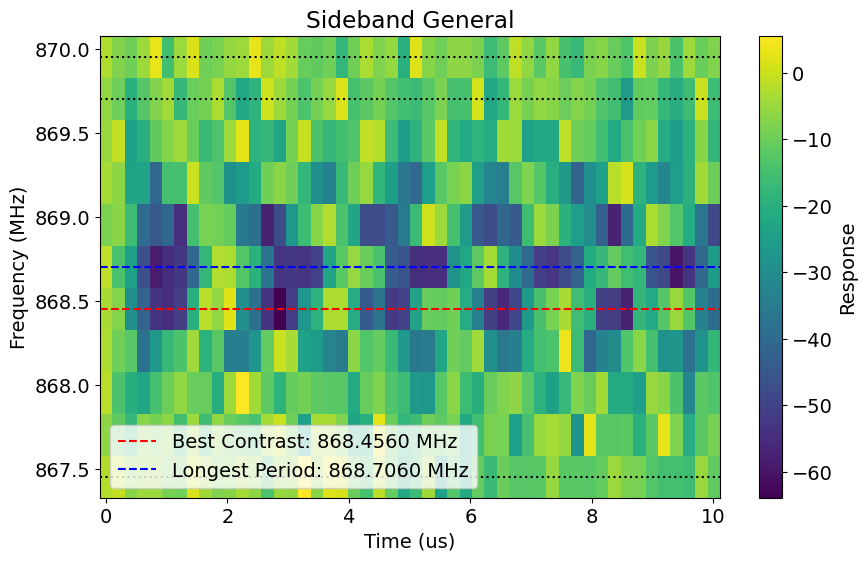

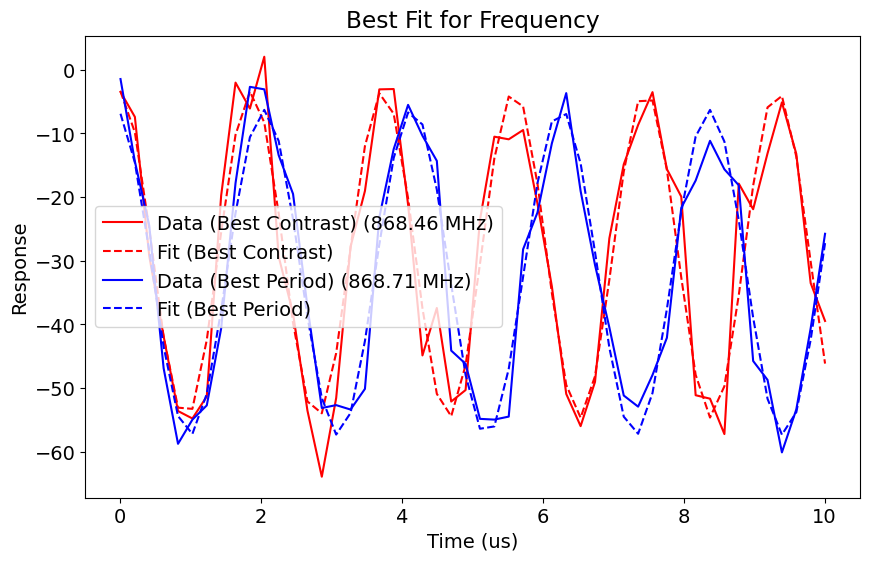

[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\Jonginn\QubitCalibration\2026\08\2026-08-17.md


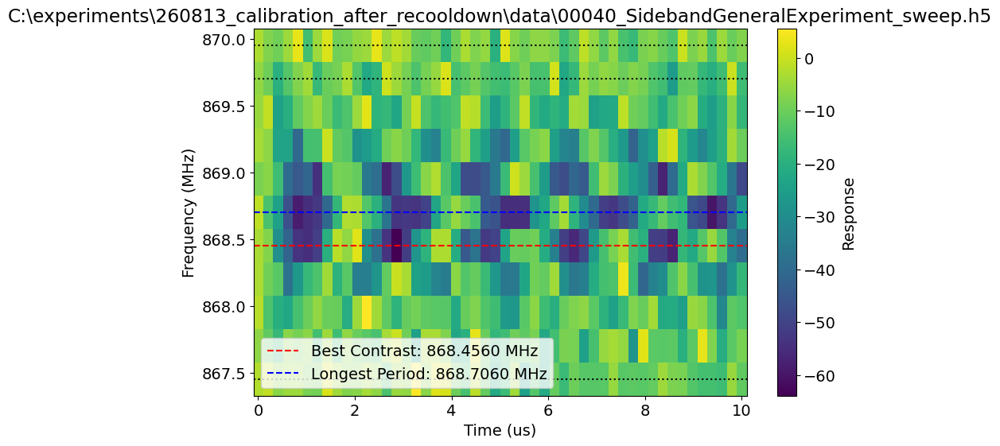

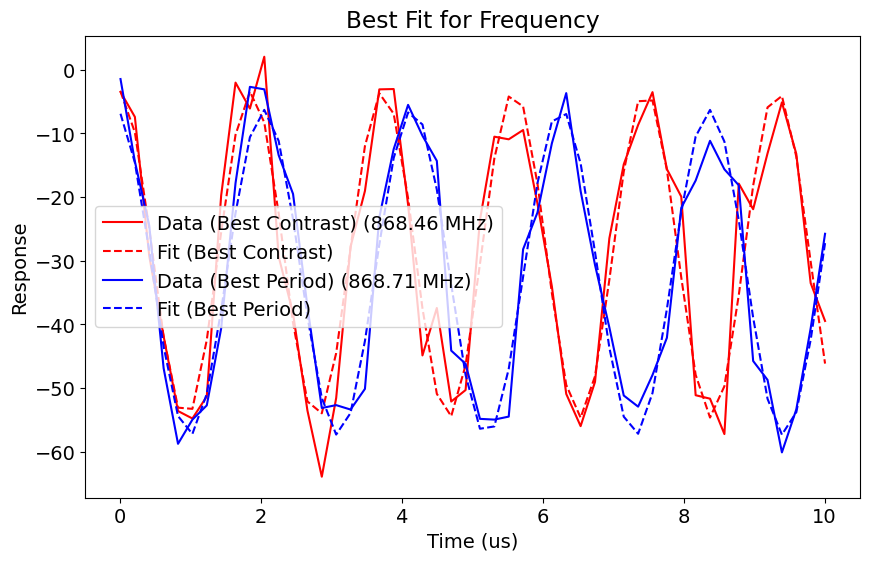

Running sideband chevron for M1-S5
Sideband chevron for M1-S5: freq=1044.951 MHz, gain=10000
Sweep: freq from 1043.7008184969184 to 1046.2008184969184 (11 pts)
  File: C:\experiments\260813_calibration_after_recooldown\data\00041_SidebandGeneralExperiment_sweep.h5
  Submitting 11 jobs...
Job submitted: JOB-20260817-00358 (queue position: 1)
Job submitted: JOB-20260817-00359 (queue position: 2)
Job submitted: JOB-20260817-00360 (queue position: 3)
Job submitted: JOB-20260817-00361 (queue position: 4)
Job submitted: JOB-20260817-00362 (queue position: 5)
Job submitted: JOB-20260817-00363 (queue position: 6)
Job submitted: JOB-20260817-00364 (queue position: 7)
Job submitted: JOB-20260817-00365 (queue position: 8)
Job submitted: JOB-20260817-00366 (queue position: 9)
Job submitted: JOB-20260817-00367 (queue position: 10)
Job submitted: JOB-20260817-00368 (queue position: 11)
  All 11 jobs submitted. Waiting for results...
  [1/11] freq=1043.7008 [WORKER] Loading SidebandGeneralExperiment 

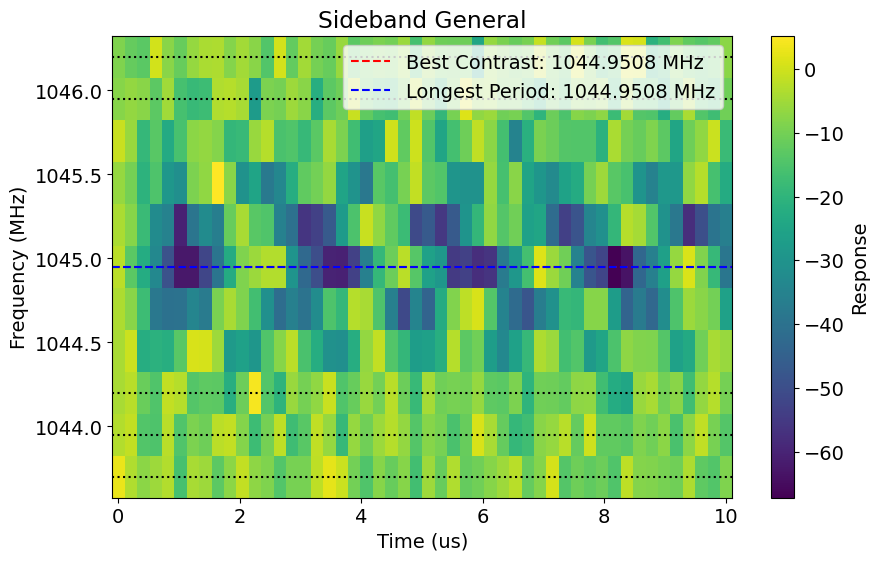

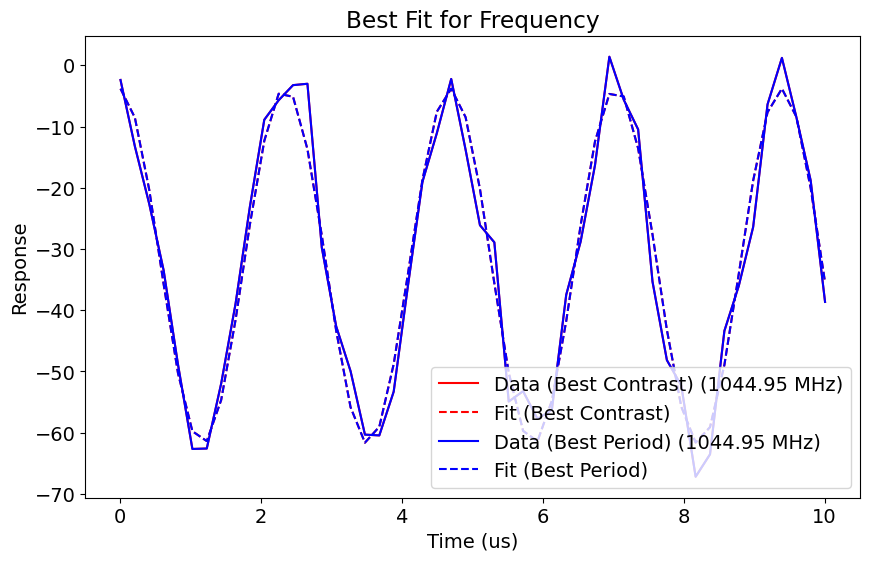

[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\Jonginn\QubitCalibration\2026\08\2026-08-17.md


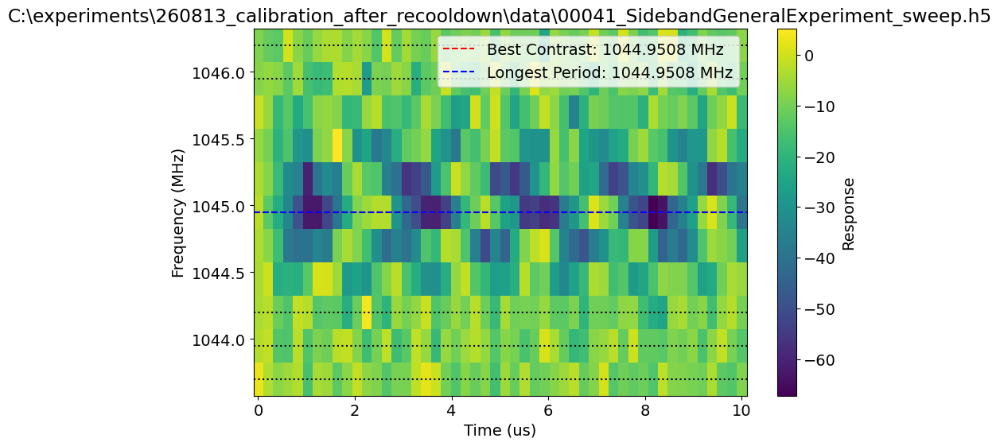

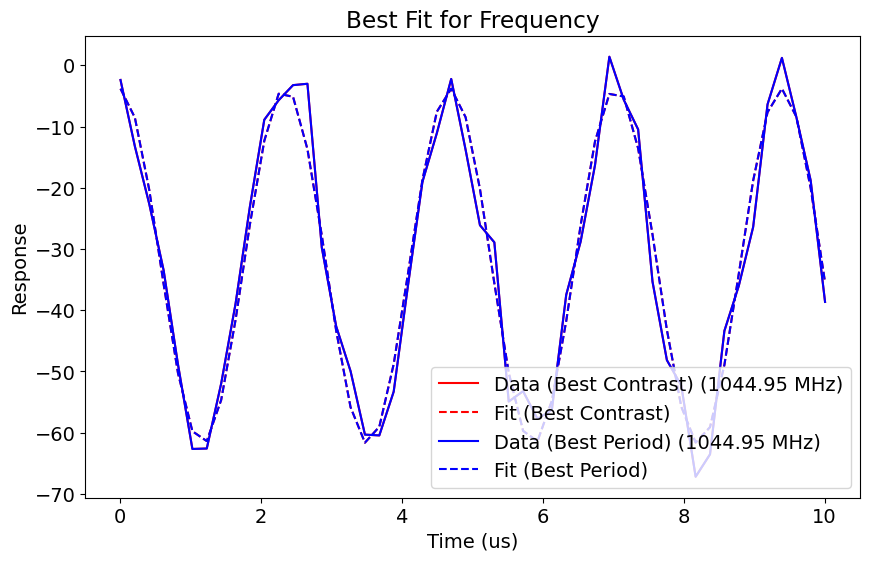

Running sideband chevron for M1-S6
Sideband chevron for M1-S6: freq=1236.599 MHz, gain=10000
Sweep: freq from 1235.348842925028 to 1237.848842925028 (11 pts)
  File: C:\experiments\260813_calibration_after_recooldown\data\00042_SidebandGeneralExperiment_sweep.h5
  Submitting 11 jobs...
Job submitted: JOB-20260817-00369 (queue position: 1)
Job submitted: JOB-20260817-00370 (queue position: 2)
Job submitted: JOB-20260817-00371 (queue position: 3)
Job submitted: JOB-20260817-00372 (queue position: 4)
Job submitted: JOB-20260817-00373 (queue position: 5)
Job submitted: JOB-20260817-00374 (queue position: 6)
Job submitted: JOB-20260817-00375 (queue position: 7)
Job submitted: JOB-20260817-00376 (queue position: 8)
Job submitted: JOB-20260817-00377 (queue position: 9)
Job submitted: JOB-20260817-00378 (queue position: 10)
Job submitted: JOB-20260817-00379 (queue position: 11)
  All 11 jobs submitted. Waiting for results...
  [1/11] freq=1235.3488 [WORKER] Loading SidebandGeneralExperiment fr

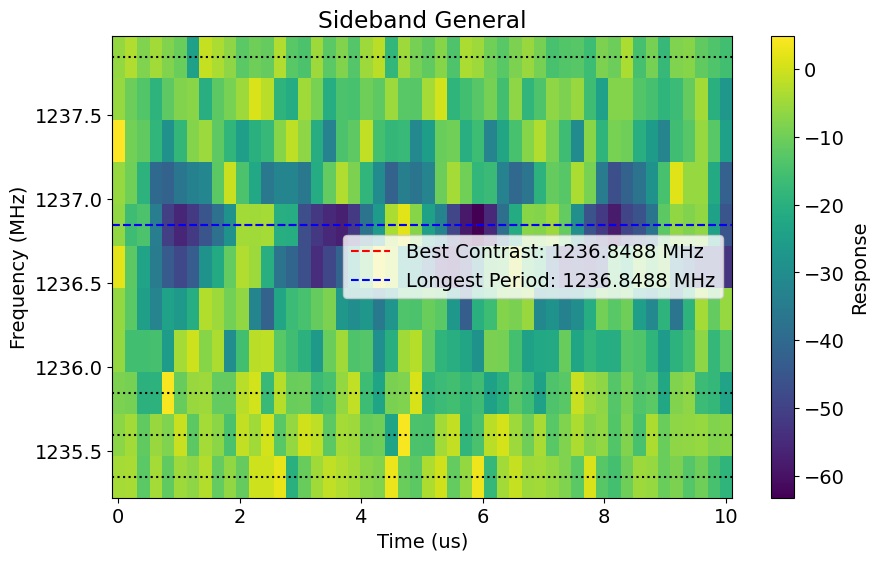

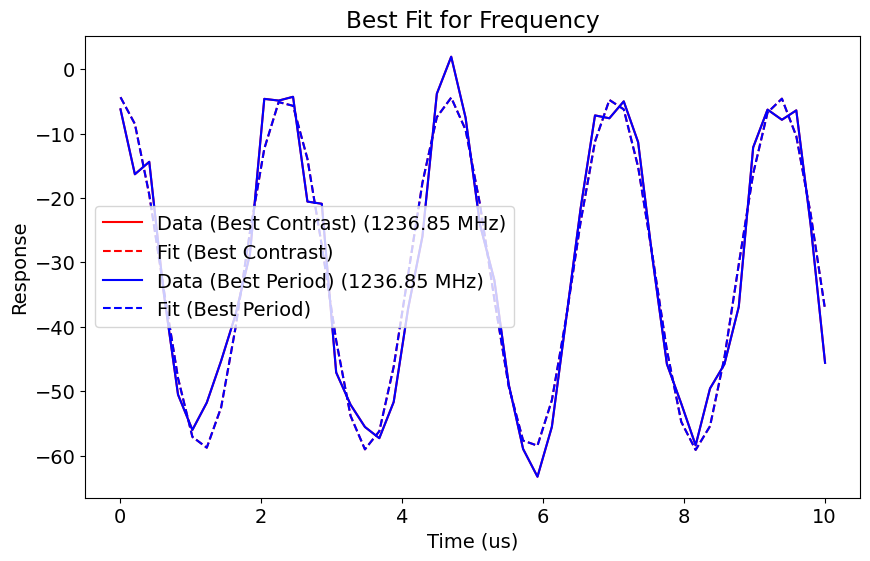

[log_measurement] Appended section to G:\Shared drives\SLab\Multimode\Lab\Jonginn\QubitCalibration\2026\08\2026-08-17.md


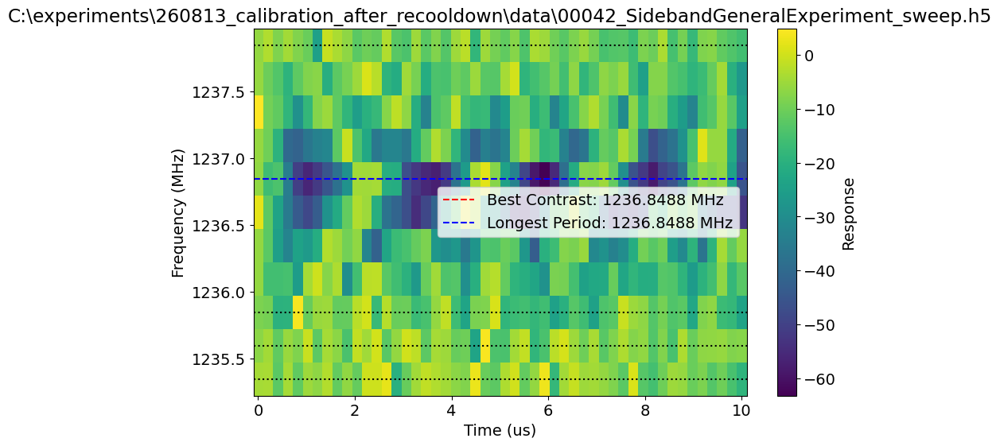

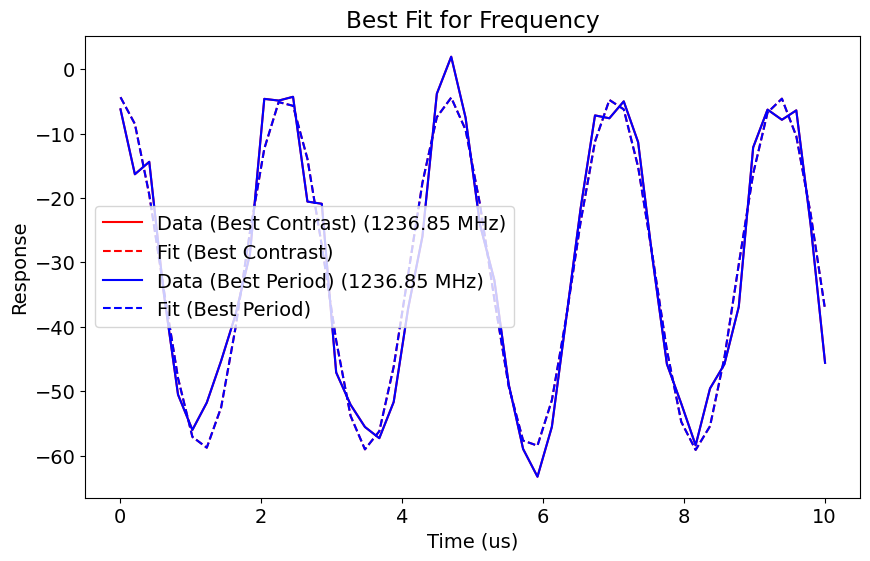

In [411]:
for stor_i in [4, 5, 6]: #range(1,8):
    stor_name = f'M1-S{stor_i}'
    rd = 3000
    
    
    manual_center_freq = None#None # #880.9
    manual_gain = 10000 #None #8000
    prefactor = 5
    pi_len_sweep = 10
    
    freq_span = 0.5*prefactor  # MHz
    freq_step = 0.05*prefactor
    
    # freq_span = 0.25*prefactor  # MHz
    # freq_step = 0.025*prefactor
    
    
    if manual_center_freq is None:
        sweep_start = station.ds_storage.get_freq(stor_name) - freq_span/2
        sweep_stop=station.ds_storage.get_freq(stor_name) + freq_span/2
    else:
        sweep_start=manual_center_freq - freq_span/2
        sweep_stop=manual_center_freq + freq_span/2
    if manual_gain is None:
        gain = station.ds_storage.get_gain(stor_name)
    else:
        gain = manual_gain
    
    
    print(f'Running sideband chevron for {stor_name}')
    chevron_analysis = sideband_chevron_runner.execute(
        reps=50,
        stor_mode_no=stor_i,
        
        sweep_start=sweep_start,
        sweep_stop=sweep_stop,
        sweep_npts=int(freq_span//freq_step + 1),
        pi_len_sweep=pi_len_sweep,
        
        expts=50, # num steps of time
        gain=gain,
        # freq = 1242.8,
        skip_update = False,
        batch = True,
        
        relax_delay = rd
        
    )
    chevron_analysis.analysis.display_results(title = chevron_analysis.fname)

In [282]:
station.update_all_station_snapshots()

[CONFIG] Reusing existing hardware_config version CFG-HW-20260814-00028
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Created new man1_storage_swap version CFG-M1-20260814-00090
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260722-00001
Config snapshots for current station:
  hardware_config: CFG-HW-20260814-00028
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260814-00090
  floquet_storage_swap: CFG-FL-20260722-00001


{'hardware_config': 'CFG-HW-20260814-00028',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260814-00090',
 'floquet_storage_swap': 'CFG-FL-20260722-00001'}

## Freq - Amplitude Chevron

In [ ]:

from datetime import datetime

# Configuration defaults for sideband sweep
sideband_chevron_defaults = AttrDict(dict(
    start=0, 
    expts=25, # num steps of time
    reps=50,
    rounds=1,
    qubit=0,
    qubits=[0],
    man_mode_no=1,
    prepulse=True,
    postpulse=True,
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    update_post_pulse_phase=[False, 0],
    relax_delay=2500,
))

def sideband_ampchevron_preproc(station, default_expt_cfg, **kwargs):
    assert 'stor_mode_no' in kwargs
    
    expt_cfg = deepcopy(default_expt_cfg)
    expt_cfg.update(kwargs)
    
    # Get storage mode parameters
    freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse = get_storage_mode_parameters(
        station.ds_storage, station.hardware_cfg, expt_cfg.man_mode_no, expt_cfg.stor_mode_no
    )

    stor_name = f'M{expt_cfg.man_mode_no}-S{expt_cfg.stor_mode_no}'
    
    # pi_len_sweep = expt_cfg.pi_len_sweep
    # expt_cfg.step = pi_len_sweep / (expt_cfg.expts - 1)
    expt_cfg.step = int(pi_gain_sweep/(expt_cfg.expts -1))
    
    expt_cfg.flux_drive = [ch, freq, 0, pi_len]
    expt_cfg.pre_sweep_pulse = prepulse
    expt_cfg.post_sweep_pulse = postpulse
    
    print(f'Sideband chevron for {stor_name}: freq={freq:.3f} MHz, gain={gain}')
    
    return expt_cfg

def sideband_ampchevron_postproc(station, mother_expt):
    expt_cfg = mother_expt.cfg.expt
    print('mom', expt_cfg)
    stor_name = f'M{expt_cfg.man_mode_no}-S{expt_cfg.stor_mode_no}'

    from fitting.fit_display_classes import ChevronFitting

    chevron_analysis = ChevronFitting(
        frequencies=mother_expt.data['freq_sweep'],
        time=mother_expt.data['xpts'][0],
        response_matrix=mother_expt.data['avgi'],
        config=station.hardware_cfg,
        station=station,
    )

    chevron_analysis.analyze()
    
    best_freq = chevron_analysis.results.get('best_frequency_contrast')
        
    # if best_freq:
    #     print(f"Best frequency found: {best_freq:.4f} MHz")
    #     station.ds_storage.update_freq(stor_name, best_freq)
    #     print(f"Updated {stor_name} frequency to {best_freq:.4f} MHz")
    #     pi_len = abs(np.pi / chevron_analysis.results['best_fit_params_period']['omega'])
    #     station.ds_storage.update_pi(stor_name, pi_len)
    #     print('Updated the pi length to:', pi_len)
    #     station.ds_storage.update_h_pi(stor_name, pi_len / 2)
    #     print('Updated the h_pi length to:', pi_len / 2)
    #     station.ds_storage.update_gain(stor_name, expt_cfg.flux_drive[2])
    #     print('Updated gain to:', expt_cfg.flux_drive[2])
    mother_expt.analysis = chevron_analysis
    # station.snapshot_man1_storage_swap(update_main=False)


sideband_chevron_runner = SweepRunner(
    station=station,
    ExptClass=meas.qsim.t2_cavity_fluxexcursion.SidebandGeneralAmpExperiment,
    default_expt_cfg=sideband_chevron_defaults,
    sweep_param='freq',
    preprocessor=sideband_ampchevron_preproc,
    postprocessor=sideband_ampchevron_postproc,
    job_client=client,
)

In [ ]:
for stor_i in [3]: #range(1,8):
    stor_name = f'M1-S{stor_i}'

    freq_span = 4  # MHz
    freq_step = 0.1
    pi_gain_sweep = 20000
    gain = station.ds_storage.get_gain(stor_name)
    
    print(f'Running sideband chevron for {stor_name}')
    chevron_analysis = sideband_chevron_runner.execute(
        reps=50,
        stor_mode_no=stor_i,
        sweep_start=station.ds_storage.get_freq(stor_name) - freq_span/2,
        sweep_stop=station.ds_storage.get_freq(stor_name) + freq_span/2,
        sweep_npts=int(freq_span//freq_step + 1),
        pi_gain_sweep=pi_gain_sweep,
        expts = 50,
    )
    chevron_analysis.analysis.display_results()

In [ ]:
idxes = [15, 16, 17, 18, 19, 20, 21, 22, 23]

fig, ax = plt.subplots(figsize = (24, 10))
x = chevron_analysis.data['xpts'][0]
for idx in idxes:
    y = chevron_analysis.data['freq_sweep'][idx]
    ax.plot(x, chevron_analysis.data['avgi'][idx], label = f"detuning = {y}")
ax.legend()

In [ ]:
station.ds_storage.update_freq('M1-S1', 347.57)

In [ ]:
station.ds_storage.update_freq('M1-S6', 1244.536721 - 1.261634)

In [ ]:
np.round(2266.797314 - 2265.535680, 6)

In [ ]:
station.ds_storage.df

In [ ]:
station.update_all_station_snapshots()

## Error amplification

In [413]:
error_amp_gain1 = [None] * len(expts_to_run['stor_modes'])
error_amp_freq1 = [None] * len(expts_to_run['stor_modes'])
error_amp_gain2 = [None] * len(expts_to_run['stor_modes'])
error_amp_freq2 = [None] * len(expts_to_run['stor_modes'])

In [414]:
error_amp_stor_defaults = AttrDict(dict(
    reps=50,
    rounds=1,
    qubits=[0],
    man_mode_no=1,
    stor_is_dump=False,
    active_reset=False,
    man_reset=True,
    storage_reset=True,
    relax_delay=2500, 
    expts=30,
)) # Shouldn't be modifying this on the fly!
# You can use kwargs in the run function to override these values

error_amp_gain_stor_coarse_defaults = AttrDict(dict(
    n_start=0,
    n_step=3,
    n_pulses=15,
    expts=50,
))

error_amp_freq_stor_coarse_defaults = AttrDict(dict(
    n_start=0,
    n_step=1,
    n_pulses=5,
    expts=50,
))


def error_amp_stor_preproc(station, default_expt_cfg, **kwargs):
    assert 'stor_mode_no' in kwargs
    assert 'parameter_to_test' in kwargs 

    # construct the defaults
    expt_cfg = deepcopy(default_expt_cfg)
    if kwargs['parameter_to_test'] == 'gain':
        expt_cfg.update(error_amp_gain_stor_coarse_defaults)
    elif kwargs['parameter_to_test'] == 'frequency':
        expt_cfg.update(error_amp_freq_stor_coarse_defaults)

    # override with the passed kwargs
    expt_cfg.update(kwargs)

    stor_mode_no = expt_cfg.stor_mode_no    
    man_mode_no = expt_cfg.man_mode_no

    freq, gain, pi_len, h_pi_len, ch, prepulse, postpulse = get_storage_mode_parameters(
        station.ds_storage, station.hardware_cfg, man_mode_no, stor_mode_no
        )
    print(f"Previous freq {freq}, gain {gain}, pi_len {pi_len}")

    if 'span' not in expt_cfg:
        if expt_cfg.parameter_to_test == 'gain':
            expt_cfg.span = int(gain * 0.3)
        elif expt_cfg.parameter_to_test == 'frequency':
            expt_cfg.span = 0.15 # MHz
  
    stor_name = f'M{man_mode_no}-S{stor_mode_no}'
    pulse_type = ['storage', stor_name, 'pi', 0]

    if expt_cfg.parameter_to_test == 'frequency':
        start = freq - expt_cfg.span / 2
        step = expt_cfg.span / (expt_cfg.expts - 1)
    elif expt_cfg.parameter_to_test == 'gain':
        start = int(gain - expt_cfg.span / 2)
        step = int(expt_cfg.span / (expt_cfg.expts - 1))
    else:
        raise ValueError("parameter_to_test must be either 'frequency' or 'gain'.")
    expt_cfg.start = start
    expt_cfg.step = step
    expt_cfg.pulse_type = pulse_type 
    return expt_cfg

def error_amp_stor_postproc(station, expt):
    expt.analyze(data=expt.data, state_fin='e')

    opt_gain = expt.data['fit_avgi'][2]
    stor_name = 'M1-S' + str(expt.cfg.expt.stor_mode_no)
    if expt.cfg.expt.parameter_to_test == 'gain':
        station.ds_storage.update_gain(stor_name, opt_gain)
    elif expt.cfg.expt.parameter_to_test == 'frequency':
        station.ds_storage.update_freq(stor_name, opt_gain)
    station.snapshot_man1_storage_swap(update_main=False)


error_amp_stor_runner = CharacterizationRunner(
    station=station,
    ExptClass=meas.ErrorAmplificationExperiment,
    default_expt_cfg=error_amp_stor_defaults,
    preprocessor=error_amp_stor_preproc,
    postprocessor=error_amp_stor_postproc,
    job_client=client,
)

### Coarse

Running M1-S1
Previous freq 342.0598457476649, gain 4998, pi_len 0.5576936922737649
Job submitted: JOB-20260817-00394 (queue position: 1)

[0.0s] Job JOB-20260817-00394: pending

[2.3s] Job JOB-20260817-00394: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00394_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:14<00:02,  2.97s/it]
[21.0s] Job JOB-20260817-00394: completed
100%|████████████████████████████████████████████| 6/6 [00:17<00:00,  2.97s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00394_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\

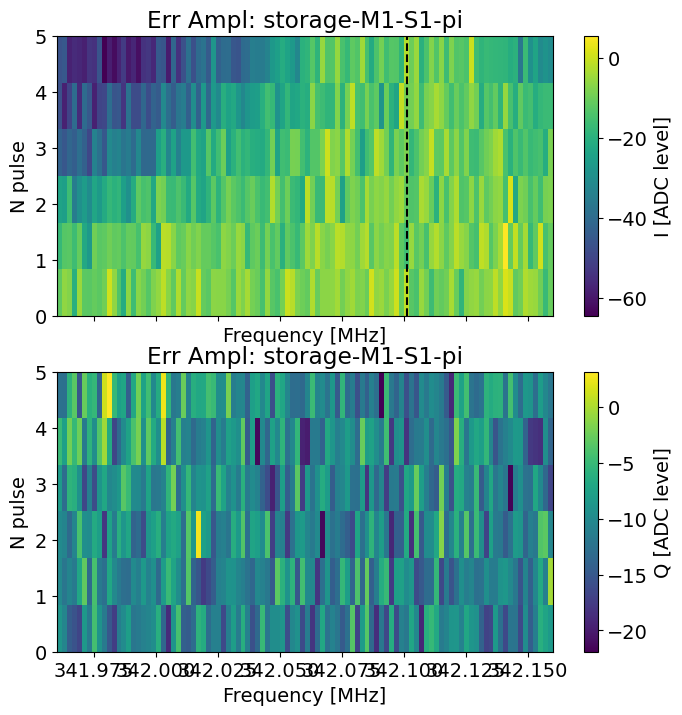

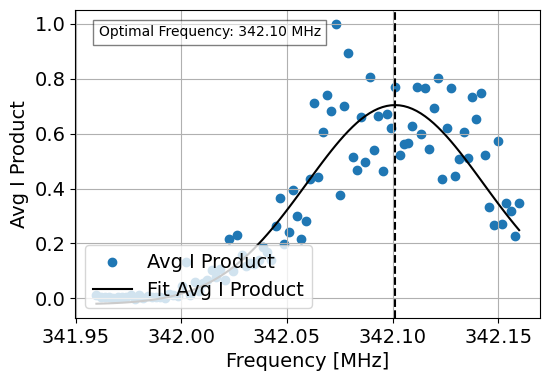

Previous freq 342.101122223236, gain 4998, pi_len 0.5576936922737649
Job submitted: JOB-20260817-00395 (queue position: 1)

[0.0s] Job JOB-20260817-00395: pending

[2.0s] Job JOB-20260817-00395: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00395_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:07<00:01,  1.55s/it]
[12.2s] Job JOB-20260817-00395: completed
100%|████████████████████████████████████████████| 6/6 [00:09<00:00,  1.55s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00395_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260817-00

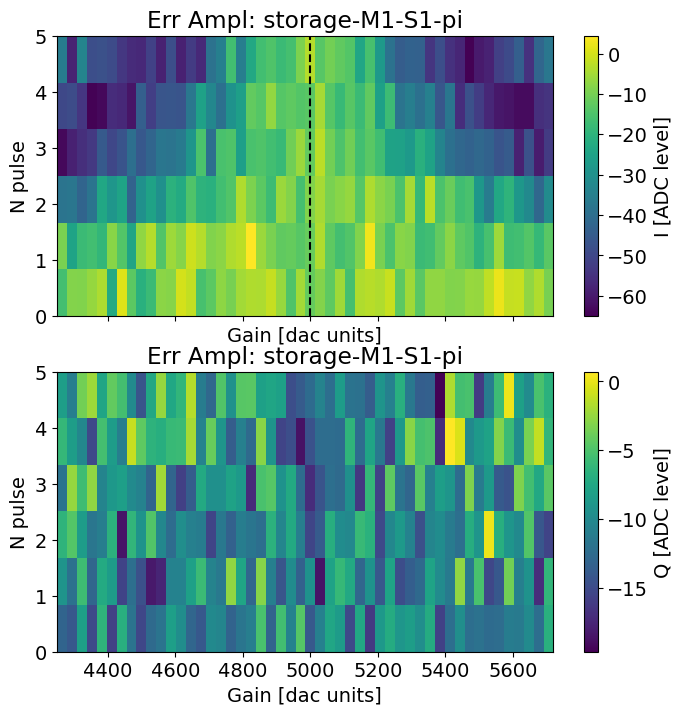

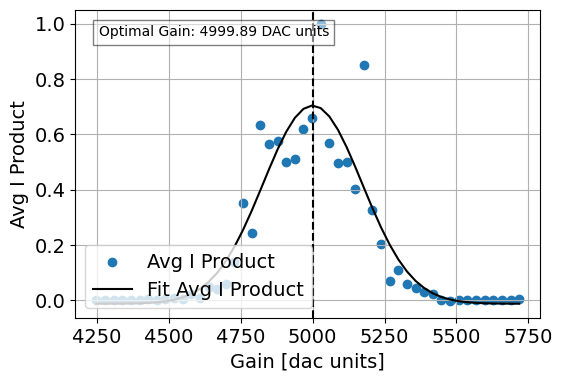

Running M1-S2
Previous freq 512.3638423176955, gain 4907, pi_len 0.7824967130074265
Job submitted: JOB-20260817-00396 (queue position: 1)

[0.0s] Job JOB-20260817-00396: pending

[2.1s] Job JOB-20260817-00396: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00396_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:14<00:02,  2.98s/it]
[19.4s] Job JOB-20260817-00396: completed
100%|████████████████████████████████████████████| 6/6 [00:17<00:00,  2.98s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00396_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\

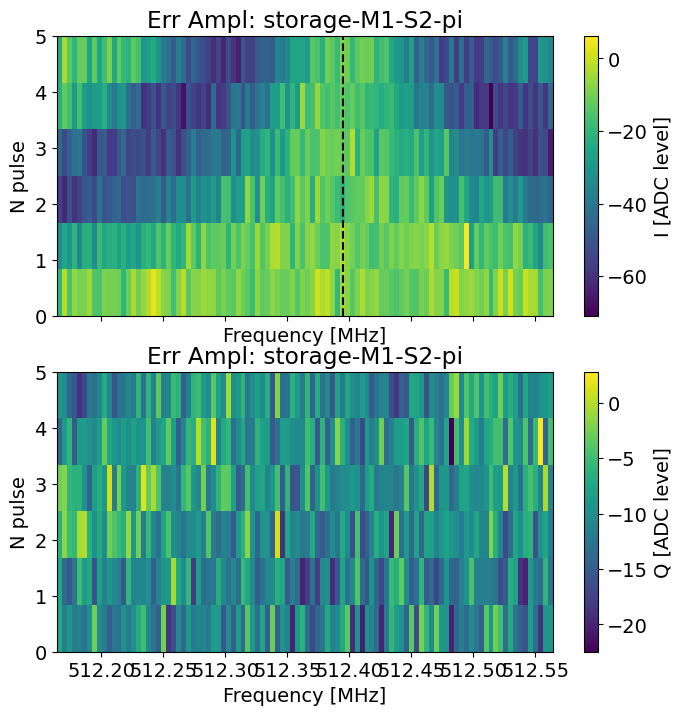

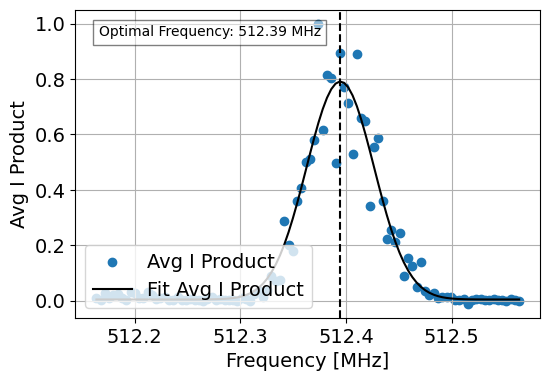

Previous freq 512.3946264181976, gain 4907, pi_len 0.7824967130074265
Job submitted: JOB-20260817-00397 (queue position: 1)

[0.0s] Job JOB-20260817-00397: pending

[3.1s] Job JOB-20260817-00397: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00397_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:07<00:01,  1.54s/it]
[12.1s] Job JOB-20260817-00397: completed
100%|████████████████████████████████████████████| 6/6 [00:09<00:00,  1.54s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00397_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260817-0

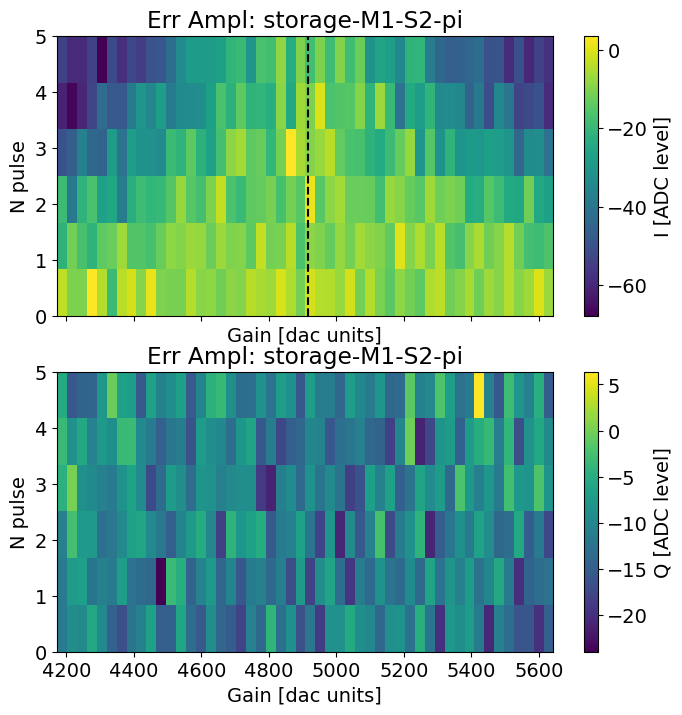

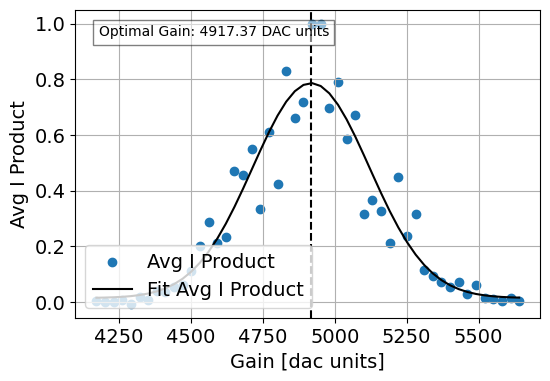

Running M1-S3
Previous freq 689.1093006440178, gain 4946, pi_len 0.8839490442464164
Job submitted: JOB-20260817-00398 (queue position: 1)

[0.0s] Job JOB-20260817-00398: pending

[2.8s] Job JOB-20260817-00398: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00398_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:15<00:02,  3.00s/it]
[21.7s] Job JOB-20260817-00398: completed
100%|████████████████████████████████████████████| 6/6 [00:18<00:00,  3.02s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00398_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\

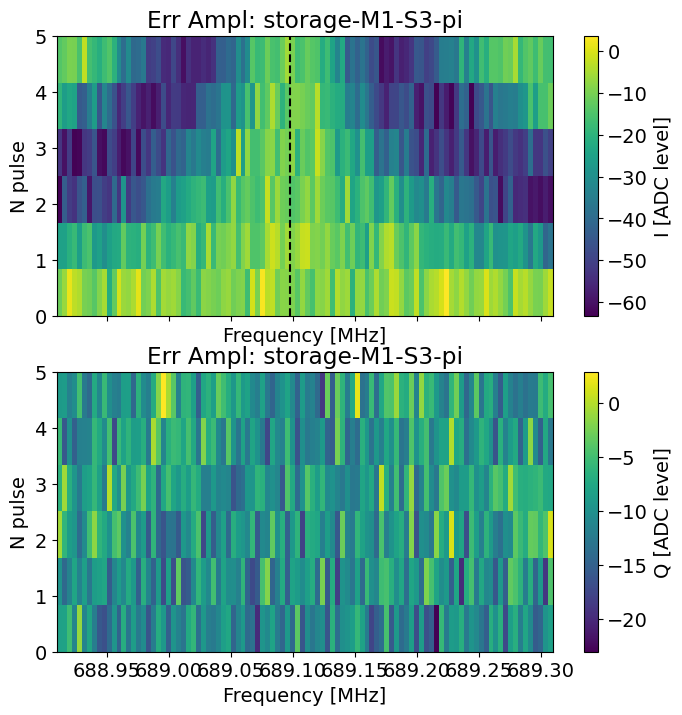

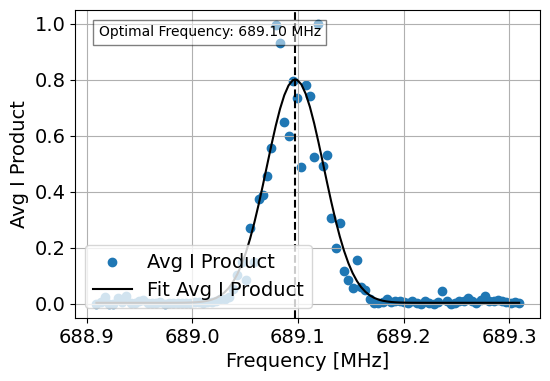

Previous freq 689.0974450523154, gain 4946, pi_len 0.8839490442464164
Job submitted: JOB-20260817-00399 (queue position: 1)

[0.0s] Job JOB-20260817-00399: pending

[2.7s] Job JOB-20260817-00399: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00399_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:07<00:01,  1.55s/it]
[11.6s] Job JOB-20260817-00399: completed
100%|████████████████████████████████████████████| 6/6 [00:09<00:00,  1.55s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00399_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260817-0

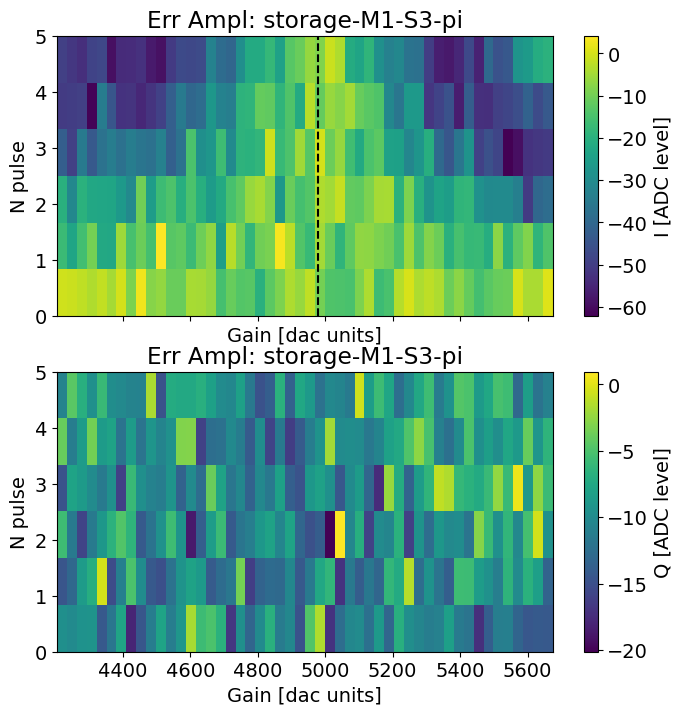

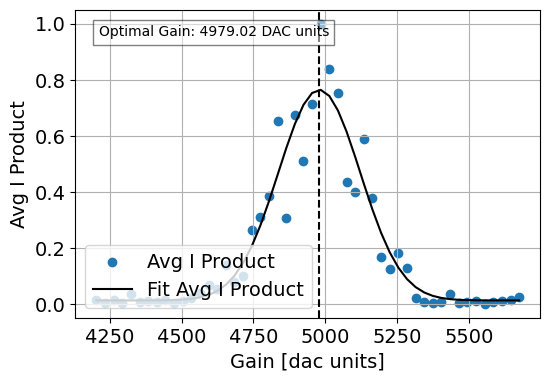

Running M1-S4
Previous freq 868.6517906118263, gain 9845, pi_len 1.0539914625230067
Job submitted: JOB-20260817-00400 (queue position: 1)

[0.0s] Job JOB-20260817-00400: pending

[2.7s] Job JOB-20260817-00400: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00400_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:14<00:02,  2.99s/it]
[22.0s] Job JOB-20260817-00400: completed
100%|████████████████████████████████████████████| 6/6 [00:17<00:00,  2.99s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00400_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\

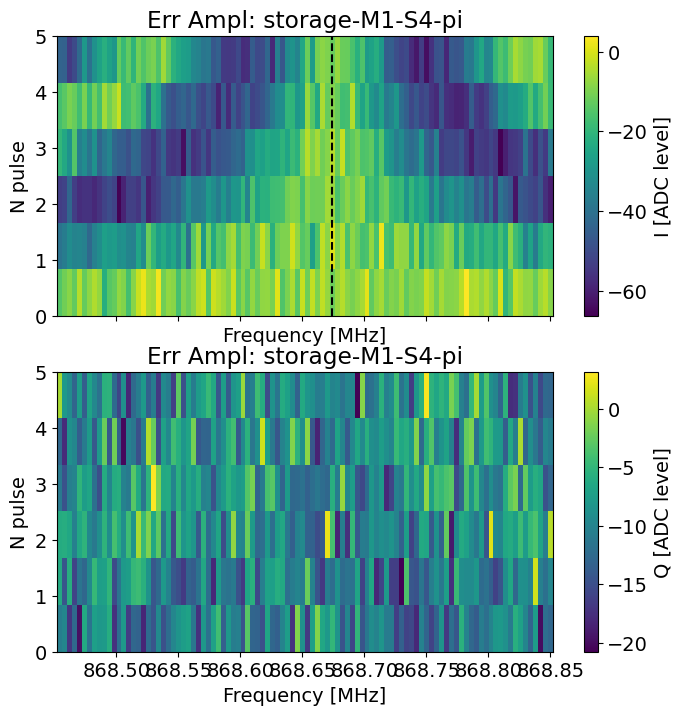

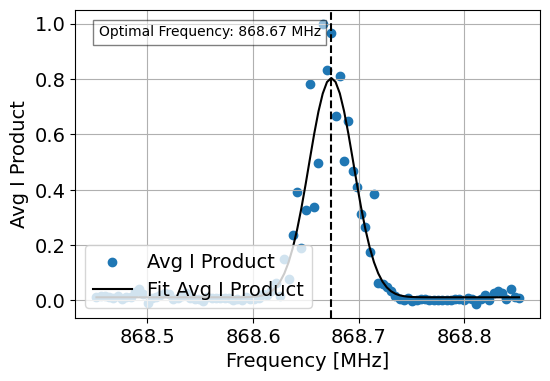

Previous freq 868.6740465003571, gain 9845, pi_len 1.0539914625230067
Job submitted: JOB-20260817-00401 (queue position: 1)

[0.0s] Job JOB-20260817-00401: pending

[2.3s] Job JOB-20260817-00401: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00401_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 50%|██████████████████████                      | 3/6 [00:04<00:04,  1.55s/it]
[11.5s] Job JOB-20260817-00401: completed
100%|████████████████████████████████████████████| 6/6 [00:09<00:00,  1.56s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00401_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260817-0

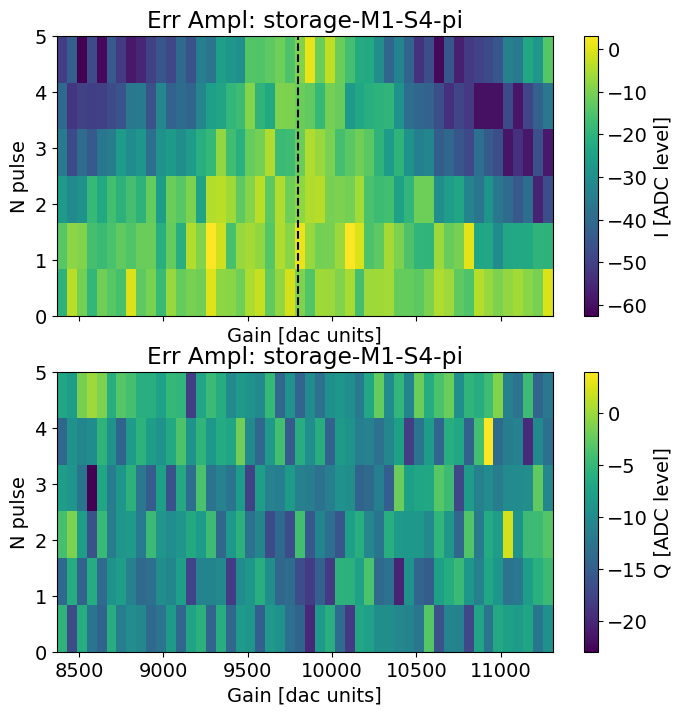

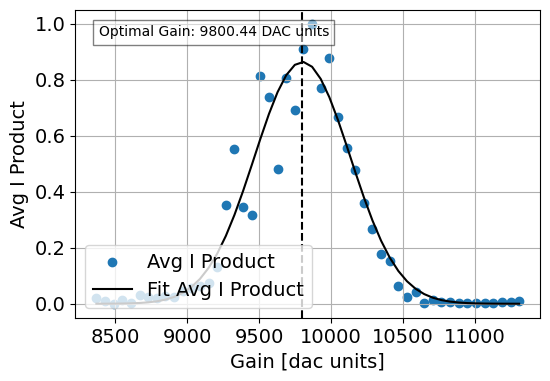

Running M1-S5
Previous freq 1044.9993092052753, gain 9993, pi_len 1.1739595620786587
Job submitted: JOB-20260817-00402 (queue position: 1)

[0.0s] Job JOB-20260817-00402: pending

[2.5s] Job JOB-20260817-00402: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00402_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:14<00:02,  3.00s/it]
[21.7s] Job JOB-20260817-00402: completed
100%|████████████████████████████████████████████| 6/6 [00:18<00:00,  3.00s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00402_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs

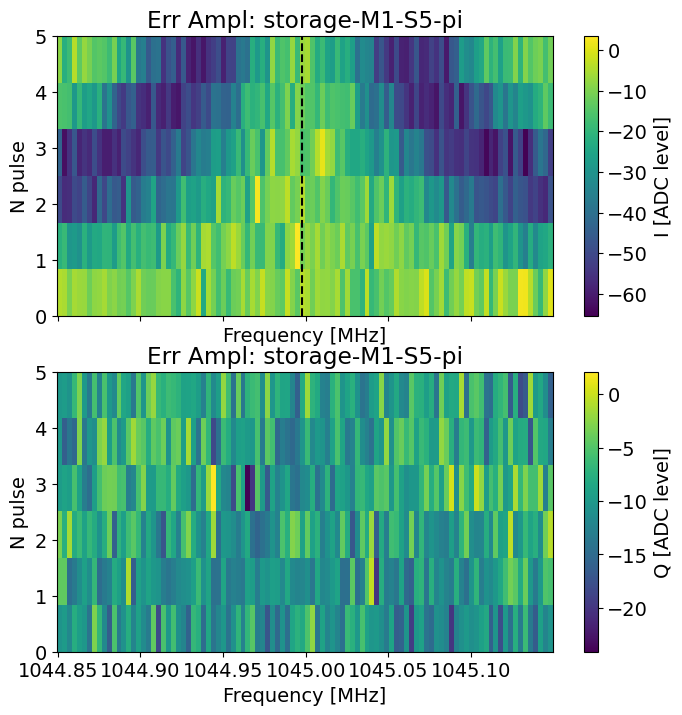

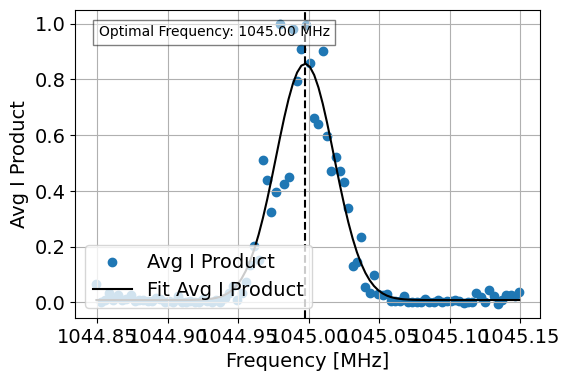

Previous freq 1044.9974057787665, gain 9993, pi_len 1.1739595620786587
Job submitted: JOB-20260817-00403 (queue position: 1)

[0.0s] Job JOB-20260817-00403: pending

[2.5s] Job JOB-20260817-00403: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00403_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 67%|█████████████████████████████▎              | 4/6 [00:06<00:03,  1.56s/it]
[11.8s] Job JOB-20260817-00403: completed
100%|████████████████████████████████████████████| 6/6 [00:09<00:00,  1.57s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00403_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260817-

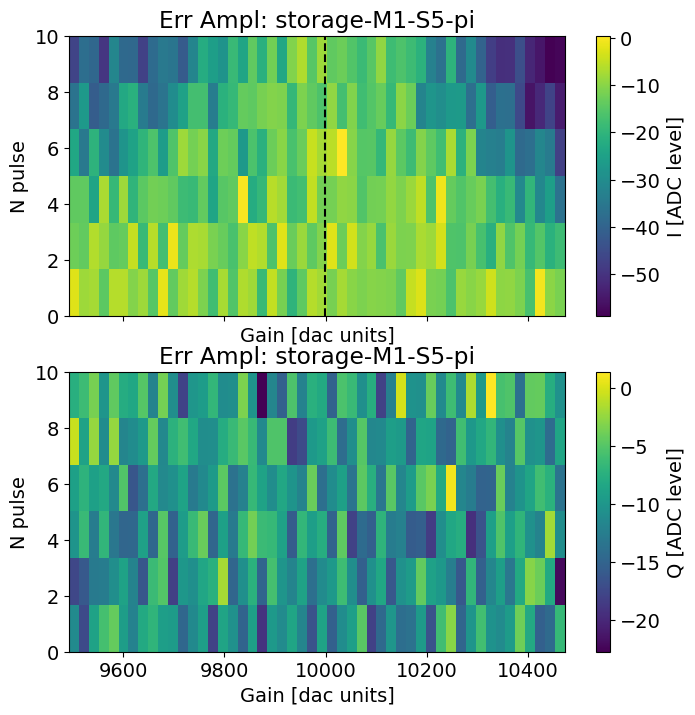

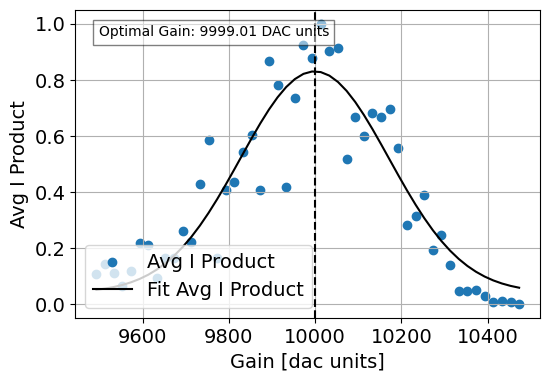

Running M1-S6
Previous freq 1236.77557708787, gain 10073, pi_len 1.1679089795097954
Job submitted: JOB-20260817-00404 (queue position: 1)

[0.0s] Job JOB-20260817-00404: pending

[2.4s] Job JOB-20260817-00404: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00404_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:14<00:03,  3.01s/it]
[20.9s] Job JOB-20260817-00404: completed
100%|████████████████████████████████████████████| 6/6 [00:17<00:00,  3.00s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00404_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\

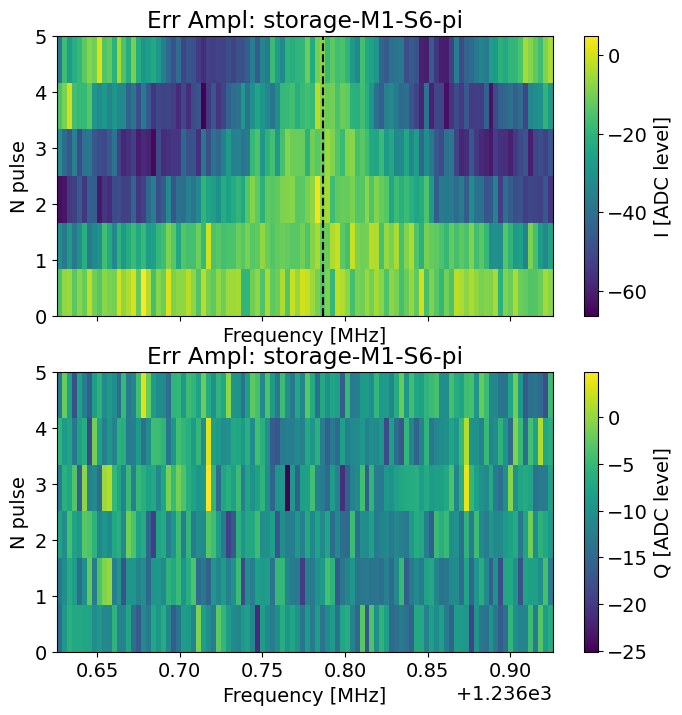

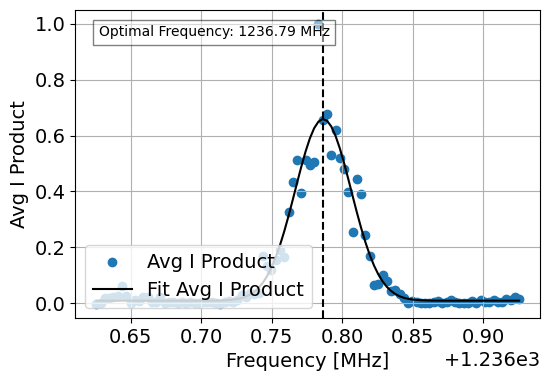

Previous freq 1236.786504590898, gain 10073, pi_len 1.1679089795097954
Job submitted: JOB-20260817-00405 (queue position: 1)

[0.0s] Job JOB-20260817-00405: pending

[2.3s] Job JOB-20260817-00405: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00405_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 50%|██████████████████████                      | 3/6 [00:04<00:04,  1.55s/it]
[11.5s] Job JOB-20260817-00405: completed
100%|████████████████████████████████████████████| 6/6 [00:09<00:00,  1.57s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00405_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260817-

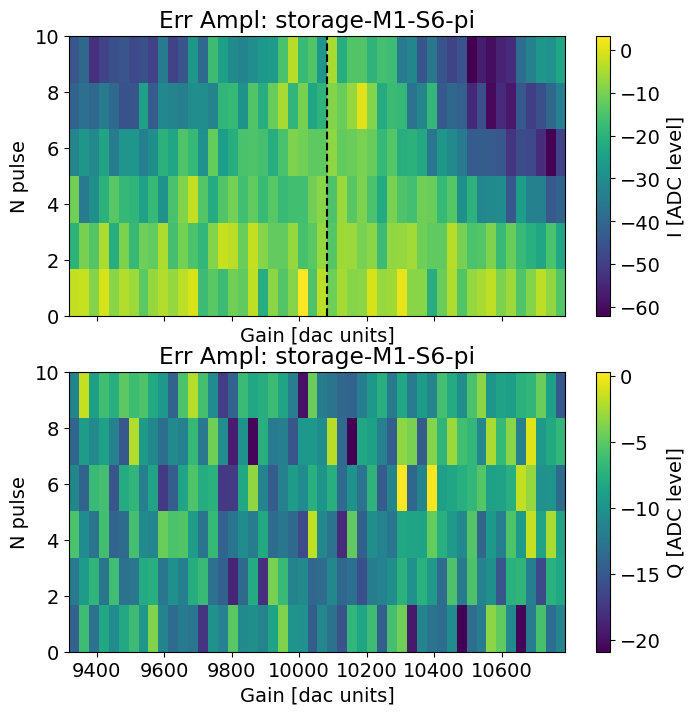

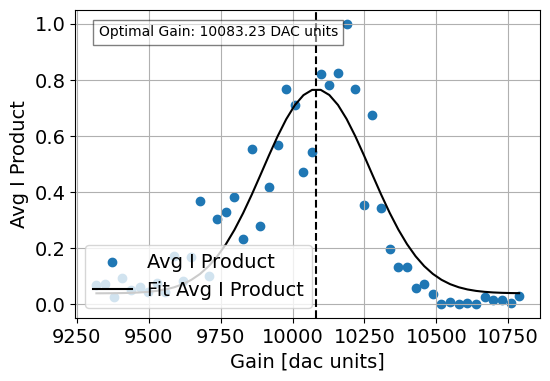

Running M1-S7
Previous freq 1414.6827178116635, gain 10295, pi_len 1.1513780994452723
Job submitted: JOB-20260817-00406 (queue position: 1)

[0.0s] Job JOB-20260817-00406: pending

[2.6s] Job JOB-20260817-00406: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00406_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:15<00:03,  3.07s/it]
[20.9s] Job JOB-20260817-00406: completed
100%|████████████████████████████████████████████| 6/6 [00:18<00:00,  3.02s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00406_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_obj

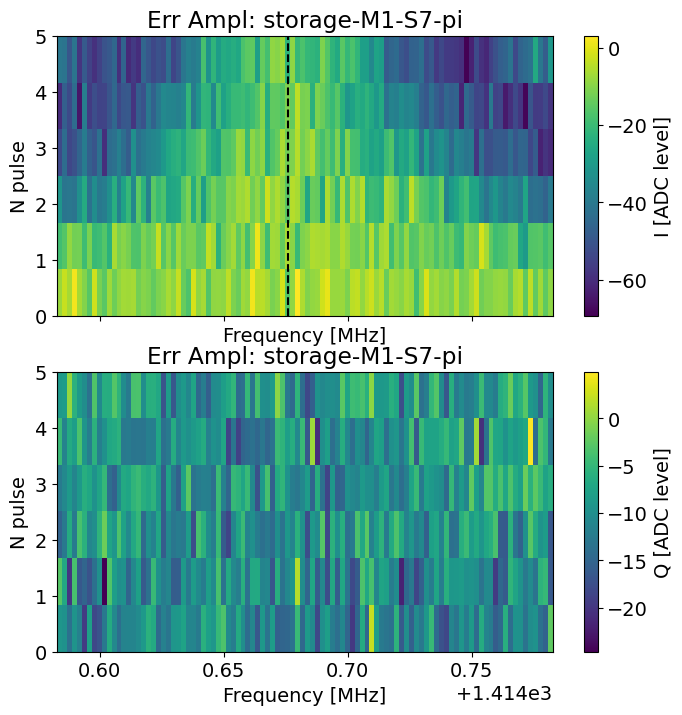

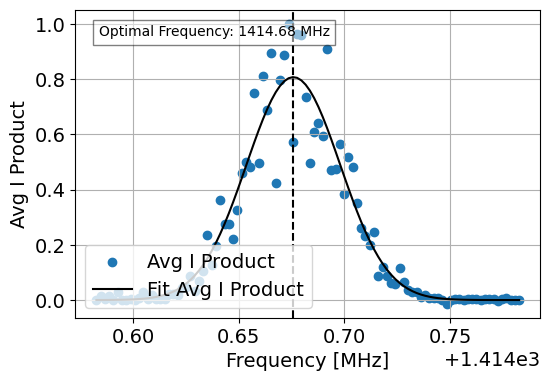

Previous freq 1414.675871547205, gain 10295, pi_len 1.1513780994452723
Job submitted: JOB-20260817-00407 (queue position: 1)

[0.0s] Job JOB-20260817-00407: pending

[3.4s] Job JOB-20260817-00407: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260817-00407_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.06999999999999999mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:07<00:01,  1.57s/it]
[12.6s] Job JOB-20260817-00407: completed
100%|████████████████████████████████████████████| 6/6 [00:09<00:00,  1.57s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260817-00407_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260817-

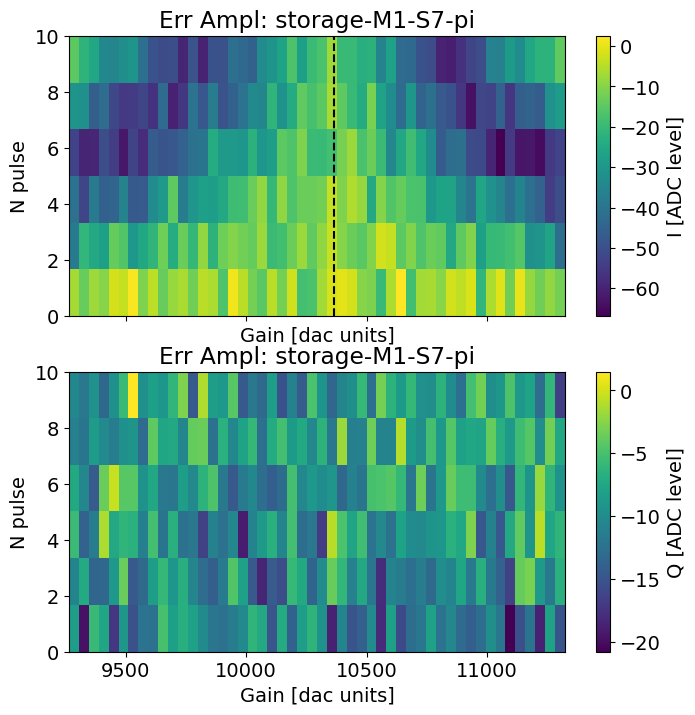

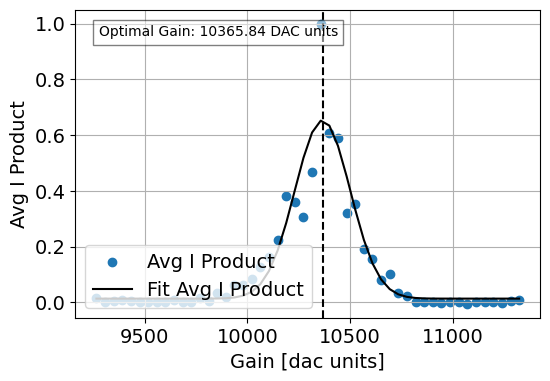

In [416]:
span_list        = [0.2 ,  0.4,  0.4,  0.4,  0.3,  0.3, 0.2]
gain_pref_list   = [None, None,  0.3,  0.3,  0.1, 0.15, 0.2] # should be less than 1.0


n_step_list_freq = [None, None, None, None, None, None, None]
n_step_list_gain = [None, None, None, None,    2,    2,    2]

do_freq_erroramp = True
do_gain_erroramp = True

dump_mode_no = 2

for i, stor_i in enumerate([1, 2, 3, 4, 5, 6, 7]):
    stor_idx = stor_i - 1
    
    prefactor = gain_pref_list[stor_idx]
    if prefactor is None:
        prefactor = 0.3
    
    n_step_freq = n_step_list_freq[stor_idx]
    n_step_gain = n_step_list_gain[stor_idx]
    if n_step_freq is None:
        n_step_freq = 1
    if n_step_gain is None:
        n_step_gain = 1
    n_pulses_freq = 5 * n_step_freq
    n_pulses_gain = 5 * n_step_gain
    stor_name = 'M1-S' + str(stor_i)
    print("Running", stor_name)
    if do_freq_erroramp == True:
        error_amp_freq1[i] = error_amp_stor_runner.execute(
            stor_mode_no=stor_i,
            parameter_to_test='frequency',
            span=span_list[stor_idx], #0.1
            expts=100,
            n_step = n_step_freq,
            n_pulses = n_pulses_freq,
            active_reset=True,
            man_reset=True,
            storage_reset=[stor_i],
            relax_delay = 200,
            reset_dump_mode = dump_mode_no
        )
        if not station.log_measurements:
            error_amp_freq1[i].display()
    if do_gain_erroramp == True:
        error_amp_gain1[i] = error_amp_stor_runner.execute(
            stor_mode_no=stor_i,
            parameter_to_test='gain',
            span = int(station.ds_storage.get_gain(stor_name) * prefactor), 
            n_step = n_step_gain,
            n_pulses=n_pulses_gain,
            active_reset=True,
            man_reset=True,
            storage_reset=[stor_i],
            relax_delay = 200,
            reset_dump_mode = dump_mode_no
        )
        if not station.log_measurements:
            error_amp_gain1[i].display()

In [417]:
station.update_all_station_snapshots()

[CONFIG] Reusing existing hardware_config version CFG-HW-20260817-00036
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260817-00113
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260814-00076
Config snapshots for current station:
  hardware_config: CFG-HW-20260817-00036
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260817-00113
  floquet_storage_swap: CFG-FL-20260814-00076


{'hardware_config': 'CFG-HW-20260817-00036',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260817-00113',
 'floquet_storage_swap': 'CFG-FL-20260814-00076'}

In [ ]:
# for i, stor_i in enumerate(expts_to_run['stor_modes']):
#     if stor_i != 4: continue
#     # if stor_i == 5: continue

#     stor_name = 'M1-S' + str(stor_i)
#     print(stor_name)
#     ds.update_gain(stor_name, ds_storage.get_gain(stor_name))
#     ds.update_freq(stor_name, ds_storage.get_freq(stor_name))
#     ds.update_pi(stor_name, ds_storage.get_pi(stor_name))
#     ds.update_h_pi(stor_name, ds_storage.get_h_pi(stor_name))

In [ ]:
for i in range(len(expts_to_run['stor_modes'])):
    print('Frequency for M1-S' + str(i+1) + ':', ds_storage.get_freq('M1-S' + str(i+1)))

In [ ]:
# #Update sweep data and analyze results

# temp_data, attrs, filename = prev_data(expt_path, prefix='sideband_general_sweep')
# print('File saved at:', filename)

# from fitting.fit_display_classes import ChevronFitting
# from datetime import datetime
# chevron_analysis = ChevronFitting(
#     frequencies=temp_data['freq_sweep'],
#     time=temp_data['xpts'][0],
#     response_matrix=temp_data['avgi'],
#     config = config_thisrun,
# )
# chevron_analysis.analyze()

# current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
# chevron_analysis.display_results(save_fig=True,  title=f'M{1}-S{7}_{current_time}')

In [ ]:
# i = 5
# print(f'Running fine sideband sweep for storage mode {i + 1}')
# freq_start = ds_storage.get_freq('M1-S' + str(i + 1)) - 1.5
# freq_stop = ds_storage.get_freq('M1-S' + str(i + 1)) + 1.5
# freq_step = 0.2
# sideband_chevrons_fine = do_sideband_general_sweep(
#     config_thisrun, ds_storage, expt_path, config_path, freq_start, freq_stop, freq_step, 
#     man_mode_no=1, stor_mode_no=i + 1, start_time=0.1, use_flux_low=True)
# # update_sideband_general_sweep(expt_path, config_thisrun, ds_storage, man_mode_no=1, stor_mode_no=i + 1, use_flux_low=True)

In [ ]:
# i = 5
# print(f'Running fine sideband sweep for storage mode {i + 1}')
# freq_start = ds_storage.get_freq('M1-S' + str(i + 1)) - 0.5
# freq_stop = ds_storage.get_freq('M1-S' + str(i + 1)) + 0.5
# freq_step = 0.2
# sideband_chevrons_fine = do_sideband_general_sweep(
#     config_thisrun, ds_storage, expt_path, config_path, freq_start, freq_stop, freq_step, 
#     man_mode_no=1, stor_mode_no=i + 1, start_time=0.1, use_flux_low=False)
# # update_sideband_general_sweep(expt_path, config_thisrun, ds_storage, man_mode_no=1, stor_mode_no=i + 1, use_flux_low=True)

### Fine

Running M1-S3
Previous freq 696.8518289289697, gain 3950, pi_len 1.4604850093590356
Job submitted: JOB-20260814-00413 (queue position: 1)

[0.0s] Job JOB-20260814-00413: pending

[2.9s] Job JOB-20260814-00413: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00413_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:15<00:03,  3.01s/it]
[19.7s] Job JOB-20260814-00413: completed
100%|████████████████████████████████████████████| 6/6 [00:18<00:00,  3.01s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00413_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260814-00

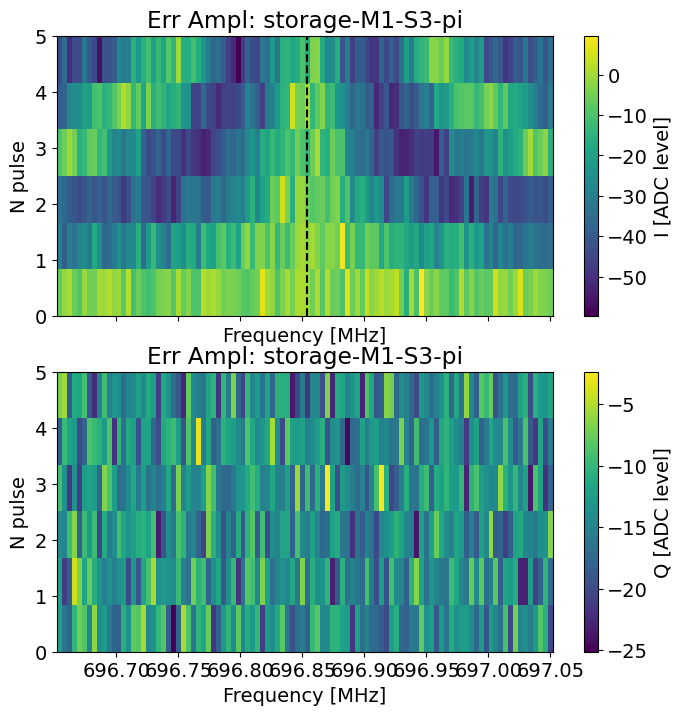

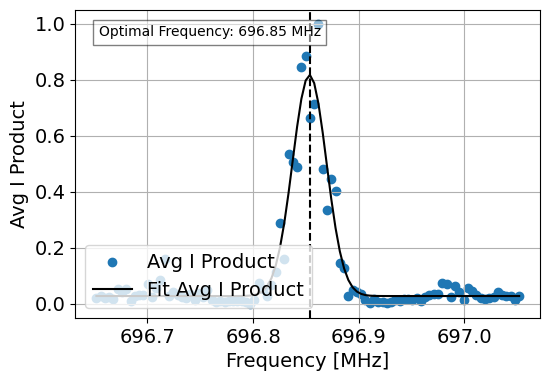

Previous freq 696.8534664360109, gain 3950, pi_len 1.4604850093590356
Job submitted: JOB-20260814-00414 (queue position: 1)

[0.0s] Job JOB-20260814-00414: pending

[3.0s] Job JOB-20260814-00414: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00414_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:07<00:01,  1.56s/it]
[12.4s] Job JOB-20260814-00414: completed
100%|████████████████████████████████████████████| 6/6 [00:09<00:00,  1.56s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00414_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260814-00414_expt.pkl



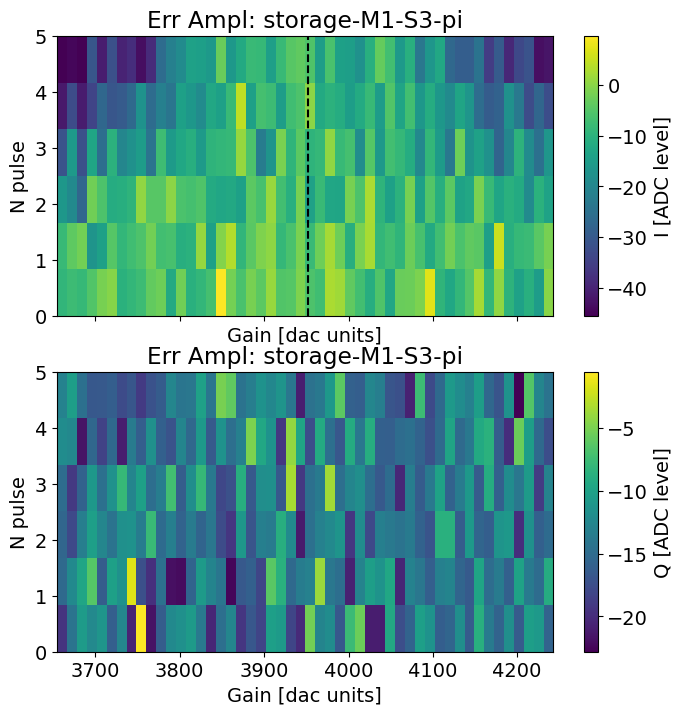

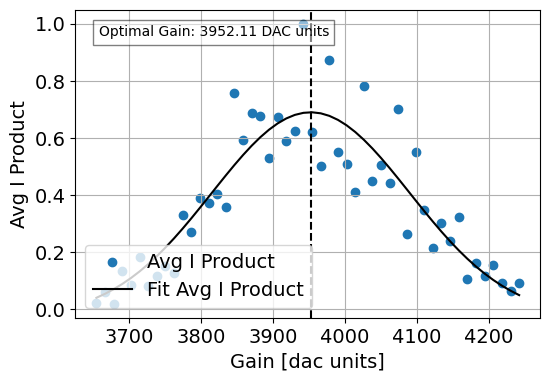

Running M1-S4
Previous freq 876.4764641240954, gain 8063, pi_len 1.7761242628150486
Job submitted: JOB-20260814-00415 (queue position: 1)

[0.0s] Job JOB-20260814-00415: pending

[2.3s] Job JOB-20260814-00415: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00415_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:14<00:03,  3.00s/it]
[21.4s] Job JOB-20260814-00415: completed
100%|████████████████████████████████████████████| 6/6 [00:18<00:00,  3.00s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00415_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260814-00

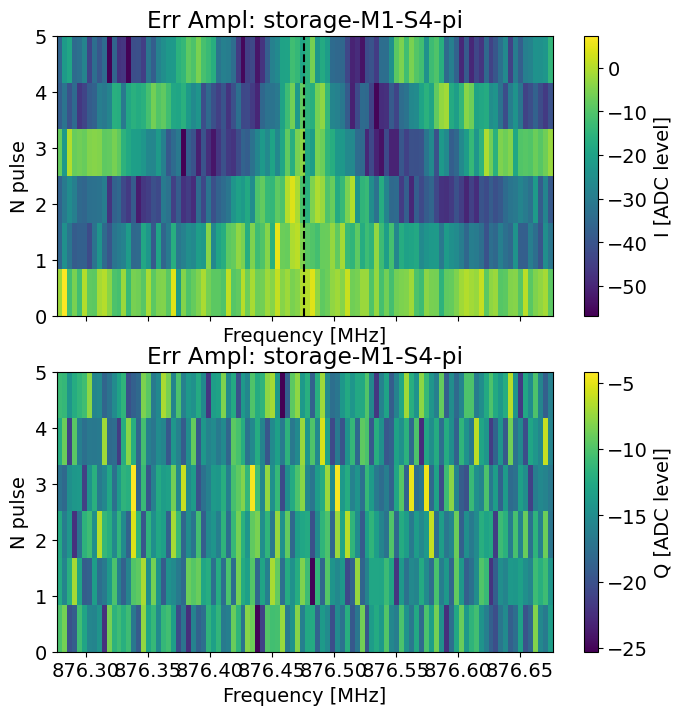

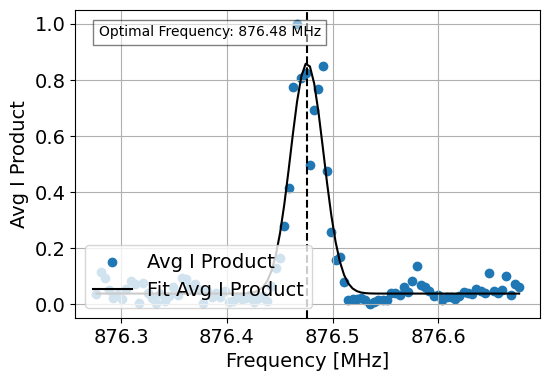

Previous freq 876.475775068169, gain 8063, pi_len 1.7761242628150486
Job submitted: JOB-20260814-00416 (queue position: 1)

[0.0s] Job JOB-20260814-00416: pending

[2.5s] Job JOB-20260814-00416: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00416_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 50%|██████████████████████                      | 3/6 [00:04<00:04,  1.55s/it]
[11.6s] Job JOB-20260814-00416: completed
100%|████████████████████████████████████████████| 6/6 [00:09<00:00,  1.56s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00416_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260814-00416_expt.pkl

J

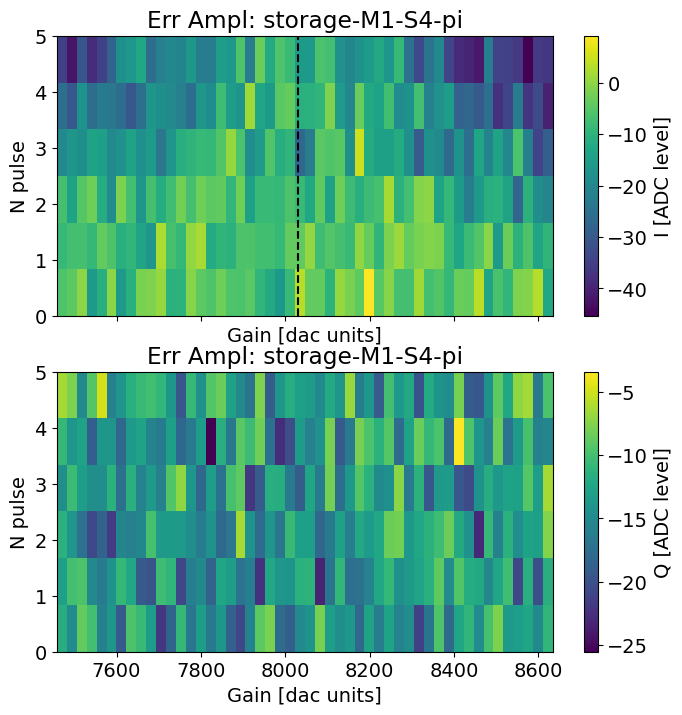

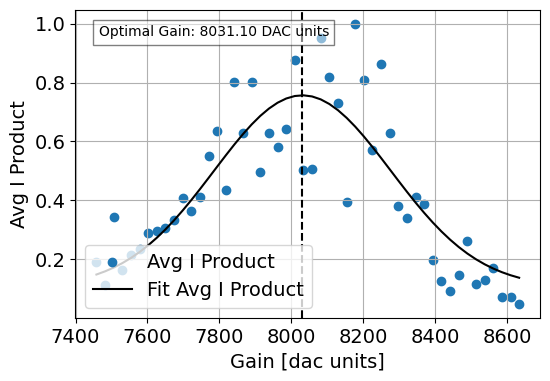

Running M1-S5
Previous freq 1053.5946864068508, gain 7160, pi_len 2.3720412274869522
Job submitted: JOB-20260814-00417 (queue position: 1)

[0.0s] Job JOB-20260814-00417: pending

[2.6s] Job JOB-20260814-00417: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00417_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:15<00:03,  3.03s/it]
[20.7s] Job JOB-20260814-00417: completed
100%|████████████████████████████████████████████| 6/6 [00:18<00:00,  3.02s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00417_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260814-0

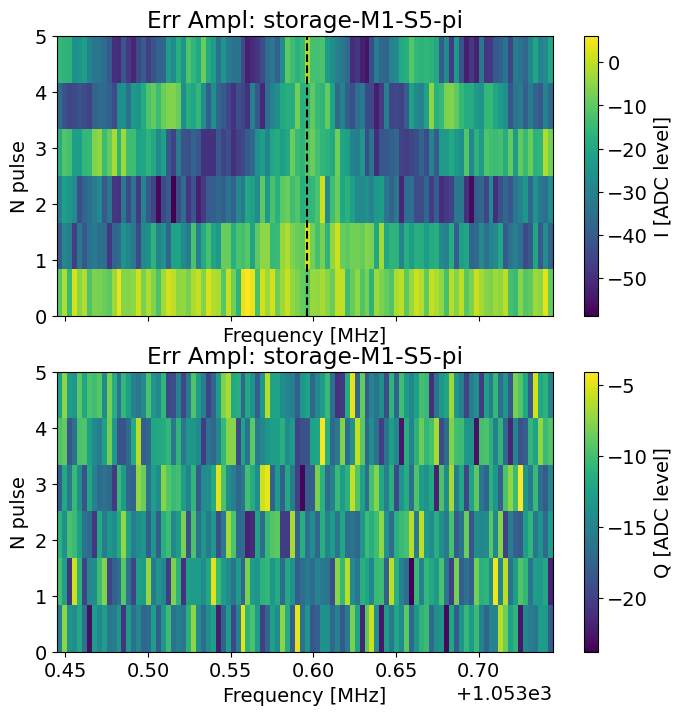

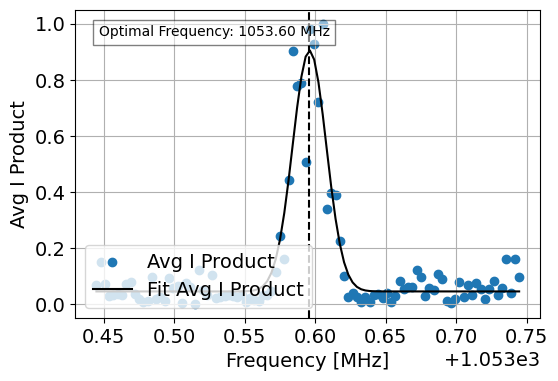

Previous freq 1053.5959013336583, gain 7160, pi_len 2.3720412274869522
Job submitted: JOB-20260814-00418 (queue position: 1)

[0.0s] Job JOB-20260814-00418: pending

[2.6s] Job JOB-20260814-00418: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00418_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 67%|█████████████████████████████▎              | 4/6 [00:06<00:03,  1.63s/it]
[11.7s] Job JOB-20260814-00418: completed
100%|████████████████████████████████████████████| 6/6 [00:09<00:00,  1.66s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00418_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260814-00418_expt.pkl


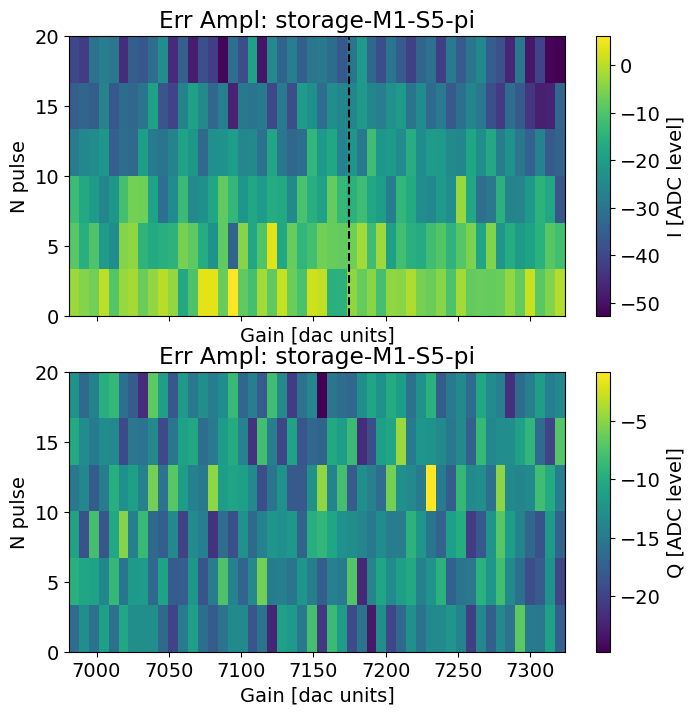

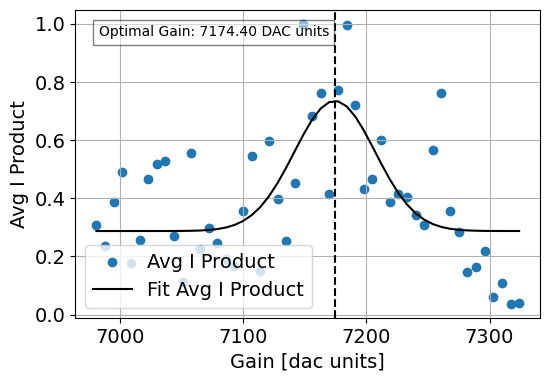

Running M1-S6
Previous freq 1245.1088598310716, gain 8087, pi_len 2.255071333698125
Job submitted: JOB-20260814-00419 (queue position: 1)

[0.0s] Job JOB-20260814-00419: pending

[2.6s] Job JOB-20260814-00419: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00419_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:15<00:03,  3.03s/it]
[22.0s] Job JOB-20260814-00419: completed
100%|████████████████████████████████████████████| 6/6 [00:18<00:00,  3.03s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00419_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260814-00

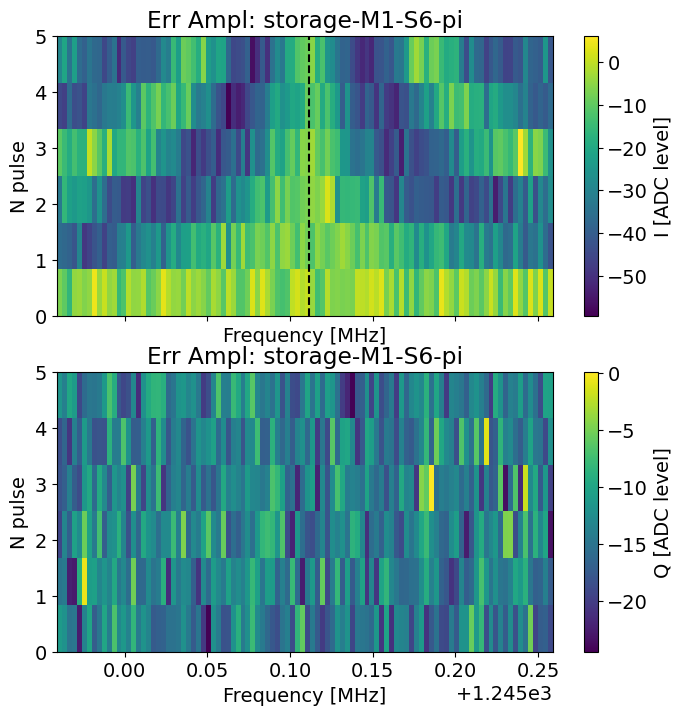

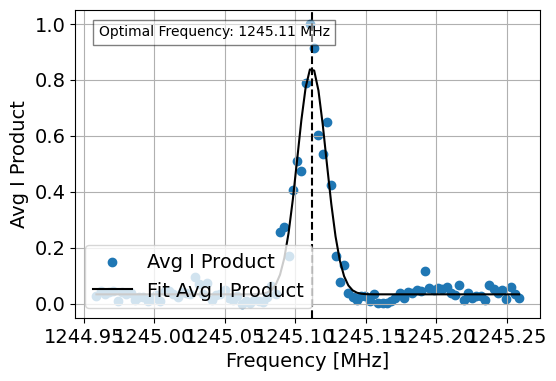

Previous freq 1245.1117177464434, gain 8087, pi_len 2.255071333698125
Job submitted: JOB-20260814-00420 (queue position: 1)

[0.0s] Job JOB-20260814-00420: pending

[2.1s] Job JOB-20260814-00420: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00420_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:07<00:01,  1.60s/it]
[11.4s] Job JOB-20260814-00420: completed
100%|████████████████████████████████████████████| 6/6 [00:09<00:00,  1.60s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00420_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260814-00420_expt.pkl



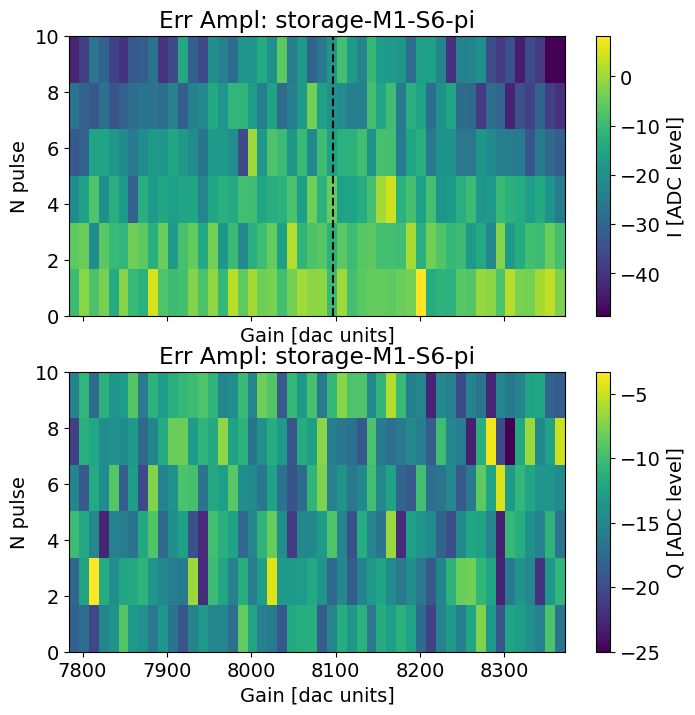

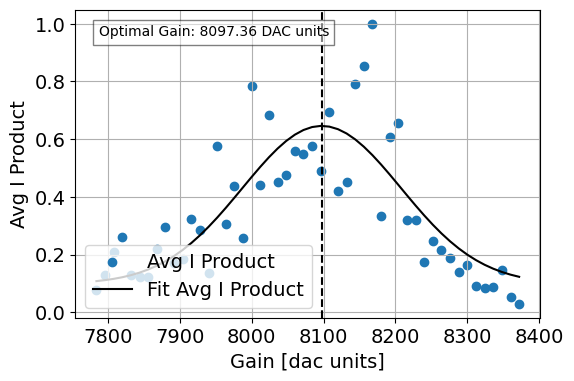

Running M1-S7
Previous freq 1423.4349230358034, gain 11950, pi_len 1.350598390354609
Job submitted: JOB-20260814-00421 (queue position: 1)

[0.0s] Job JOB-20260814-00421: pending

[2.2s] Job JOB-20260814-00421: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00421_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:15<00:03,  3.02s/it]
[21.5s] Job JOB-20260814-00421: completed
100%|████████████████████████████████████████████| 6/6 [00:18<00:00,  3.03s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00421_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260814-0

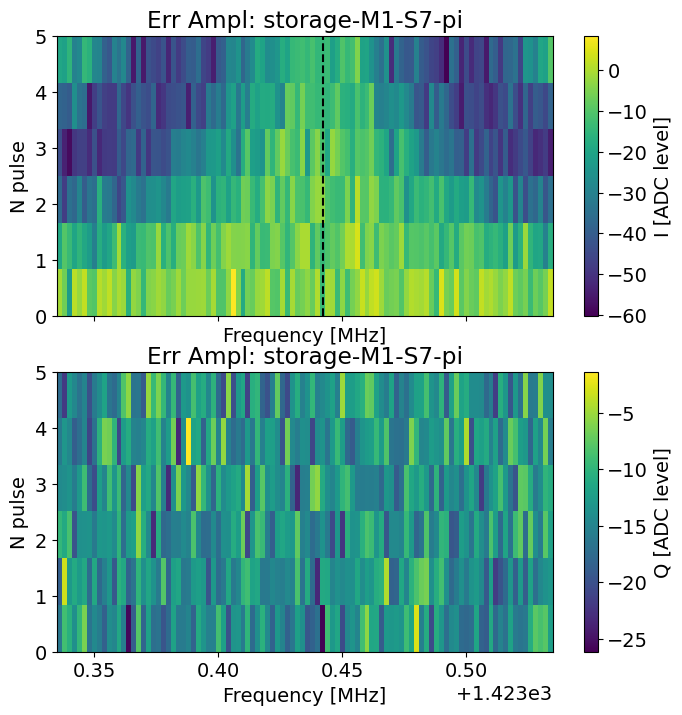

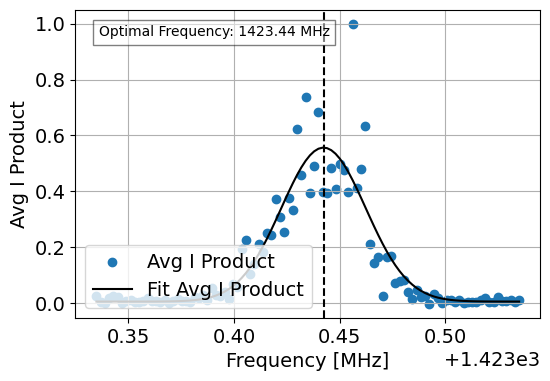

Previous freq 1423.4423639794097, gain 11950, pi_len 1.350598390354609
Job submitted: JOB-20260814-00422 (queue position: 1)

[0.0s] Job JOB-20260814-00422: pending

[2.6s] Job JOB-20260814-00422: running
[WORKER] Loading ErrorAmplificationExperiment from experiments.single_qubit.error_amplification
[WORKER] Creating experiment instance
[WORKER]   Data file: JOB-20260814-00422_ErrorAmplificationExperiment.h5
[WORKER] Running experiment...
[WORKER] Setting coupler yoko current to 0.25mA according to hardware_cfg yaml...
[WORKER] Done setting coupler current
 83%|████████████████████████████████████▋       | 5/6 [00:07<00:01,  1.58s/it]
[11.9s] Job JOB-20260814-00422: completed
100%|████████████████████████████████████████████| 6/6 [00:09<00:00,  1.57s/it]
Saving C:\experiments\260813_calibration_after_recooldown\data\JOB-20260814-00422_ErrorAmplificationExperiment.h5
[WORKER] Saving expt object to: C:\experiments\260813_calibration_after_recooldown\expt_objs\JOB-20260814-00422_expt.pkl


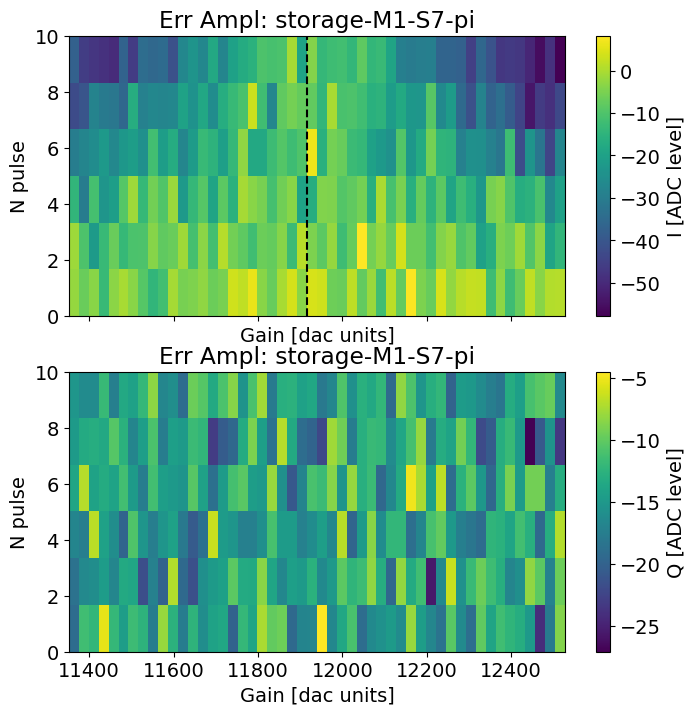

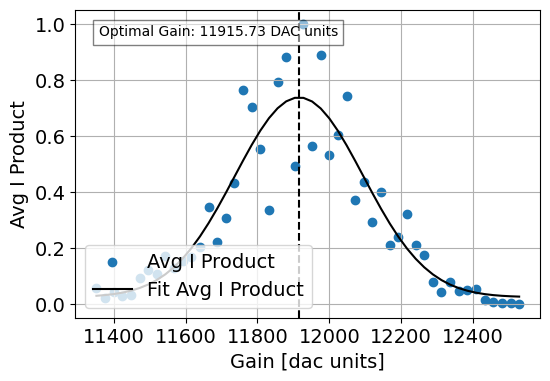

In [289]:
for i, stor_i in enumerate([3, 4, 5, 6, 7]):
    stor_idx = stor_i - 1
    
    prefactor = gain_pref_list[stor_idx]
    if prefactor is None:
        prefactor = 0.3
    prefactor *= 0.5
    n_step_freq = n_step_list_freq[stor_idx]
    n_step_gain = n_step_list_gain[stor_idx]
    if n_step_freq is None:
        n_step_freq = 1
    if n_step_gain is None:
        n_step_gain = 1
    n_pulses_freq = 5 * n_step_freq
    n_pulses_gain = 5 * n_step_gain
    stor_name = 'M1-S' + str(stor_i)
    print("Running", stor_name)
    if do_freq_erroramp == True:
        error_amp_freq1[i] = error_amp_stor_runner.execute(
            stor_mode_no=stor_i,
            parameter_to_test='frequency',
            span=span_list[stor_idx], #0.1
            expts=100,
            n_step = n_step_freq,
            n_pulses = n_pulses_freq,
            active_reset=True,
            man_reset=True,
            storage_reset=[stor_i],
            relax_delay = 200,
            reset_dump_mode = dump_mode_no
        )
        if not station.log_measurements:
            error_amp_freq1[i].display()
    if do_gain_erroramp == True:
        error_amp_gain1[i] = error_amp_stor_runner.execute(
            stor_mode_no=stor_i,
            parameter_to_test='gain',
            span = int(station.ds_storage.get_gain(stor_name) * prefactor), 
            n_step = n_step_gain,
            n_pulses=n_pulses_gain,
            active_reset=True,
            man_reset=True,
            storage_reset=[stor_i],
            relax_delay = 200,
            reset_dump_mode = dump_mode_no
        )
        if not station.log_measurements:
            error_amp_gain1[i].display()

In [290]:
station.update_all_station_snapshots()

[CONFIG] Reusing existing hardware_config version CFG-HW-20260814-00028
[CONFIG] Reusing existing multiphoton_config version CFG-MP-20260121-00001
[CONFIG] Reusing existing man1_storage_swap version CFG-M1-20260814-00120
[CONFIG] Reusing existing floquet_storage_swap version CFG-FL-20260722-00001
Config snapshots for current station:
  hardware_config: CFG-HW-20260814-00028
  multiphoton_config: CFG-MP-20260121-00001
  man1_storage_swap: CFG-M1-20260814-00120
  floquet_storage_swap: CFG-FL-20260722-00001


{'hardware_config': 'CFG-HW-20260814-00028',
 'multiphoton_config': 'CFG-MP-20260121-00001',
 'man1_storage_swap': 'CFG-M1-20260814-00120',
 'floquet_storage_swap': 'CFG-FL-20260722-00001'}

### Manually get the frequencies from the chevrons

In [ ]:
# file_list = [34,36,38,40,42,44,46]
# chevrons_stor_objects = [None]* len(file_list)
# name = '_sideband_general_sweep.h5'
# # name = '_storage_sideband_sweep.h5'
# for idx, file_no in enumerate(file_list):
#     full_name = str(file_no).zfill(5)+name
#     expt_path_mod = r"H:\Shared drives\SLab\Multimode\experiment\250505_craqm\data"
#     temp_data, attrs, filename = prev_data(expt_path_mod, full_name)  # ef

#     from fitting.fit_display_classes import ChevronFitting
#     chevron_analysis = ChevronFitting(
#         frequencies=temp_data['freq_sweep'],
#         time=temp_data['xpts'][0],
#         response_matrix=temp_data['avgi']
#     )
#     chevrons_stor_objects[idx] = chevron_analysis

In [ ]:
# i = 6
# # guess_freq = 1422.66
# anls = chevrons_stor_objects[i]
# anls.analyze()
# anls.display_results(save_fig=False, 
#                     directory=autocalib_path, 
#                     title=f'M1-S{i+1}')
#                 #  hlines = [guess_freq])
# ds_storage.update_freq('M1-S' + str(i+1), anls.results['best_frequency_period'])
# # or override manually 
# # ds_storage.update_freq('M1-S' + str(i+1), 1052.8026)

In [ ]:
# ds_storage.df

In [ ]:

# ds_storage.update_freq('M1-S' + str(i), guess_freq)

In [ ]:
# ds_storage.get_freq('M1-S3')

In [ ]:
# stor_mode_no = 1
# man_mode_no = 1
# len_rabi_storage = do_sideband_general(config_thisrun, expt_path, config_path, man_mode_no, stor_mode_no)
# update_sideband_general(len_rabi_storage, config_thisrun, ds_storage, man_mode_no, stor_mode_no)

## Randomized Benchmarking

In [ ]:
len([1, 5, 10, 15, 25, 50, 75, 100, 150, 200, 250, 400, 500, 600, 700, 850, 1000, 1250, 1500])

In [ ]:
# config_thisrun.device.storage.ramp_sigma
# man_mode_no = 1
# stor_mode_no = 7
# req = ds_storage.get_freq('M' + str(man_mode_no) + '-S' + str(stor_mode_no))
# gain = ds_storage.get_gain('M' + str(man_mode_no) + '-S' + str(stor_mode_no))
# hpi_length = ds_storage.get_h_pi('M' + str(man_mode_no) + '-S' + str(stor_mode_no))
# print("ramp_sigma:", config_thisrun.device.storage.ramp_sigma)
# print("man_mode_no:", man_mode_no)
# print("stor_mode_no:", stor_mode_no)
# print("freq:", req)
# print("gain:", gain)
# print("hpi_length:", hpi_length)

In [ ]:

def do_single_beam_splitter_rb_postselection_sweep_depth(config_thisrun, ds_storage, expt_path, config_path, exp_param_file, man_mode_no=1, stor_mode_no=1,
                                                         prev_data=None):
    """
    Run the SingleBeamSplitterRBPostSelection_sweep_depth experiment.
    """
    from multimode_expts.sequential_experiment_classes import MM_DualRailRB
    experiment_class = MM_DualRailRB
    sweep_experiment_name = 'SingleBeamSplitterRBPostSelection_sweep_depth'
    class_for_exp = experiment_class(
        soccfg=soc, path=expt_path, prefix=sweep_experiment_name, config_file=config_path, exp_param_file=exp_param_file, 
        prev_data=prev_data
    )

    class_for_exp.yaml_cfg = AttrDict(deepcopy(config_thisrun))
    # Customize bs_para for the given manipulation and storage mode using ds_storage directly
    freq = ds_storage.get_freq('M' + str(man_mode_no) + '-S' + str(stor_mode_no))
    gain = ds_storage.get_gain('M' + str(man_mode_no) + '-S' + str(stor_mode_no))
    hpi_length = ds_storage.get_h_pi('M' + str(man_mode_no) + '-S' + str(stor_mode_no))
    bs_para = [freq, gain, hpi_length, config_thisrun.device.storage.ramp_sigma]
    print('Beam splitter parameters:', bs_para)
    # Optionally, set up experiment parameters here if needed, e.g.:
    # class_for_exp.loaded[sweep_experiment_name] = dict(...)
    class_for_exp.loaded[sweep_experiment_name] = dict(
        depth_list=[1, 5, 10, 15, 25, 50, 75, 100, 150, 200, 250, 400, 500, 600, 700, 850, 1000, 1250, 1500, 2000],  # RB sequence depth list
        reps_list = [],
        qubits=[0],
        reps=0,  # doesn't matter

        single_shot_bef_expt=False,  # single shot before experiment
        singleshot_reps=2000,        # single shot measurement repetitions
        span=1000,                   # single shot plot span

        active_reset=False,          # for single shot post selection
        man_reset=True,              # for single shot post selection
        storage_reset=True,          # for single shot post selection
        threshold=None,              # for single shot post selection
        readout_per_round=4,         # for single shot post selection

        rb_active_reset=False,
        rb_man_reset=True,
        rb_storage_reset=True,
        rb_reps=1000,
        gates_per_wait=100000,       # ????
        parity_meas=True,            # If parity measurement is used, set to True; if False the reset arguments below should be false as well
        reset_qubit_after_parity=False,  # True # resetting via second parity str 
        reset_qubit_via_active_reset_after_first_meas=False,  # resetting via active reset after first parity str; the other reset should be false

        rounds=1,                    # always set to 1
        variations=10,                # number of different sequences
        rb_depth=10,                 # rb sequence depth
        IRB_gate_no=-1,              # IRB gate number, -1 means not using
        postselection_delay=2.0,     # in us, gap between two readout pulses
        bs_repeat=1,
        sync=False,
        setup=False,

        bs_para=bs_para,  # at 96  # beam splitter parameters [[frequency], [gain], [length (us)], [sigma]]
        prepulse=False,
        postpulse=False,
        f0g1_offset=0,               # offset phase in deg as a result of f0g1 prepulse/postpulse

        pre_sweep_pulse=[[None]],    # Gate based; prep f0g1 is done automatically ; RAM state prep is also automatic 
        ram_prepulse=[False, 6, [1], 1],  # [True/False, number of storage modes to be populated, [idx of modes to be skipped], variations]
        ram_prepulse_strs=None       # see SingleBeamSplitterRBPostSelection_sweep_depth_and_ram
    )
    

    class_for_exp.yaml_cfg.device.readout.relax_delay = [8000]  # Example, adjust as needed

    prefix, dir_path =eval('class_for_exp.run_sweep')(sweep_experiment_name=sweep_experiment_name)
    print('File saved at:', prefix)
    print('Directory path:', dir_path)

    # from fitting.fit_display_classes import MM_DualRailRBFitting
    # rb_analysis = MM_DualRailRBFitting(
    #     filename=None,
    #     file_prefix=prefix,
    #     config=yaml_cfg,
    #     expt_path=expt_path,
    #     title=f'M{man_mode_no}-S{stor_mode_no}',
    #     prev_data=prev_data,
    #     dir_path=dir_path
    # )
    # rb_analysis.show_rb(save_fig=True)
    # return rb_analysis


In [ ]:
if expts_to_run['RB']:
    storage_rbs = [None] * len(expts_to_run['stor_modes'])
    for i in range(len(expts_to_run['stor_modes'])):
        print(f'Running storage RB postselection sweep depth for storage mode {i + 1}')
        storage_rbs[i] = do_single_beam_splitter_rb_postselection_sweep_depth(
            config_thisrun,
            ds_storage,
            expt_path,
            config_path,
            exp_param_file=exp_param_file,
            man_mode_no=1,
            stor_mode_no=i + 1
        )

In [ ]:
# from fitting.fit_display_classes import MM_DualRailRBFitting
# dir_no = np.arange(72, 80, 1 )
# for idx, dir_no in enumerate(dir_no):
#     prefix = f"SingleBeamSplitterRBPostSelection_sweep_depth"
#     dir_name = f"{str(dir_no).zfill(5)}_SingleBeamSplitterRBPostSelection_sweep_depth" 
#     dir_path = r"H:\\\\Shared drives\\\\SLab\\\\Multimode\\\\experiment\\\\250505_craqm\\\\data\\\\" + dir_name
#     filepath = dir_path
#     # Initialize RB analysis
#     rb_analysis = MM_DualRailRBFitting(
#         filename=None,
#         file_prefix=prefix,
#         config=yaml_cfg,
#         expt_path=expt_path,
#         title=f"M1-S{idx + 1} RB Analysis",
#         prev_data=prev_data,
#         dir_path=filepath
#     )
#     rb_analysis.show_rb(save_fig=True)



In [ ]:
dir_no = 78
dir_name = f"{str(dir_no).zfill(5)}_SingleBeamSplitterRBPostSelection_sweep_depth" 
dir_path = r"H:\\\\Shared drives\\\\SLab\\\\Multimode\\\\experiment\\\\250505_craqm\\\\data\\\\" + dir_name
temp_data, attrs, filename = prev_data(dir_path, prefix='SingleBeamSplitterRBPostSelection_sweep_depth')

In [ ]:
atrrs = AttrDict(attrs)
attrs['config']['device']['qubit']['f_ge']

In [ ]:
# storage_rb

In [ ]:
expt_test = Experiment(
            path=expt_path,
            prefix="yoyoyo",
            config_file=config_path,
        )

In [ ]:
expt_test.data = {}
f = expt_test.save_data()

In [ ]:
if expts_to_run['RB']:
    filename = expt_test.fname
    #create a directory with the filename but no .h5 extension
    import os
    directory = filename
    if directory.lower().endswith('.h5'):
        directory = directory[:-3]
    if not os.path.exists(directory):
        # Only create the directory if it is not the same as the filename (i.e., filename is not a directory itself)
        # Make sure the directory name does not have a .h5 extension
        os.makedirs(directory)

In [ ]:
# directory
# filename_only = os.path.basename(expt_test.fname)
# filename_only

In [ ]:
if expts_to_run['RB']:
    from fitting.fit_display_classes import MM_DualRailRBFitting
    rb_analysis = MM_DualRailRBFitting(file_prefix = "SingleBeamSplitterRBPostSelection_sweep_depth", 
                                    config=config_thisrun, expt_path=expt_path, title='M1_S1', 
                                    prev_data= prev_data)
    rb_analysis.show_rb()

In [ ]:
if expts_to_run['RB']:
    temp_data, attrs, filename = prev_data(expt_path, '00036_SingleBeamSplitterRBPostSelection_sweep_depth.h5')

In [ ]:
attrs['config'].keys()

In [ ]:
temp_data.keys()

In [ ]:
num_entries = len(temp_data['Idata'])
print(f"Number of entries in 'Idata': {num_entries}")

In [ ]:
temp_data['sequences']

# Shock TLS Function

In [ ]:
from multimode_expts.experiments.single_qubit.pulse_probe_f0g1_spectroscopy import PulseProbeF0g1SpectroscopyExperiment

def do_pulse_probe_f0g1_spectroscopy(config_thisrun, expt_path, config_path, 
                                     start=2007, step=0.02, expts=300, reps=100,
                                       rounds=1, length=1, gain=5000, pulse_type='gaussian',
                                         qubit_f=True, qubits=[0], prepulse=False, pre_sweep_pulse=None):
    """
    Run the PulseProbeF0g1SpectroscopyExperiment with specified parameters.
    """
    
    expt = PulseProbeF0g1SpectroscopyExperiment(
        soccfg=soc, path=expt_path, prefix='PulseProbeF0g1SpectroscopyExperiment', config_file=config_path
    )
    expt.cfg = AttrDict(deepcopy(config_thisrun))
    expt.cfg.expt = dict(
        start=start,
        step=step,
        expts=expts,
        reps=reps,
        rounds=rounds,
        length=length,
        gain=gain,
        pulse_type=pulse_type,
        qubit_f=qubit_f,
        qubits=qubits,
        prepulse=prepulse,
        pre_sweep_pulse=pre_sweep_pulse
    )
    expt.cfg.device.readout.relax_delay = [5]  # Wait time between experiments [us]
    expt.go(analyze=True, display=True, progress=True, save=True)
    return expt

In [ ]:
# t2ramsey_ge_check = None
# while True: 
#     #close previous plots 
#     # import matplotlib.pyplot as plt
#     #each iteration is 5 minutes
#     # do_pulse_probe_f0g1_spectroscopy(
#     #     config_thisrun, expt_path, config_path,
#     #     start=3300, step=0.04, expts=10000, reps=100,
#     #     rounds=5, length=50, gain=30000, pulse_type='gaussian',
#     #     qubit_f=False, qubits=[0], prepulse=False, pre_sweep_pulse=None
#     # )

#     do_pulse_probe_ge(config_thisrun, start = 3300, 
#                       step = 0.04, expts = 10000, reps = 100, rounds = 5,
#                       length = 50, gain = 30000)
#     from IPython.display import clear_output
#     # from fitting.fit_display_classes import SidebandFitting
#     clear_output(wait=True)
#     plt.close('all')  # Close all existing figures
#     t2ramsey_ge_check = do_t2_ramsey_ge(config_thisrun, expt_path, config_path)
#     t2ramsey_ge_check.analyze()
#     t2ramsey_ge_check.display(title_str='T2_ge_TLS')


In [ ]:
from experiments.MM_base import MMAveragerProgram
from multimode_expts.experiments.qsim.utils import ensure_list_in_cfg

class ShockTLSProgram(MMAveragerProgram):
    def initialize(self):
        self.MM_base_initialize()
        
        
    def body(self):
        self.reset_and_sync()

        self.setup_and_pulse(
            ch=0,
            style='const',
            freq=self.freq2reg(1918, gen_ch=0),
            length=50,
            phase=0,
            gain=30000,
        )
    def update(self):
        print('Updating frequency...')
        print('Current frequency (MHz):', self.reg2freq(self.r_freq2, gen_ch=0))
        print('Frequency step (MHz):', self.f_step)
        self.mathi(self.q_rp, self.r_freq2, self.r_freq2, '+', self.f_step) # update frequency list index


class ShockTLSExperiment(Experiment):
    def acquire(self, progress):
        ensure_list_in_cfg(self.cfg)
        
        self.prog = ShockTLSProgram(soccfg=self.soccfg, cfg=self.cfg)
        self.prog.acquire(self.im[self.cfg.aliases.soc],
                         threshold=None,
                         load_pulses=True,
                         progress=progress,
                         debug=False)
    

### ShockTLS !!!

In [ ]:
shockTLS_bool = False # Set to FALSE to avoid running!!!!!!
if shockTLS_bool:    
    scktls = ShockTLSExperiment(soccfg=soc, path=expt_path, prefix='shockTLS',
                            config_file=config_path)
    scktls.cfg = AttrDict(deepcopy(config_thisrun))

    scktls.cfg.expt = dict(expts=2000, reps=2000, rounds=100000, qubit=[0])

    scktls.cfg.device.readout.relax_delay = [50] # Wait time between experiments [us]
    for kk in range(50):
        scktls.go(analyze=False, display=False, progress=True, save=False)

# Update Config and Dataset

In [ ]:
def convert_attrdict_to_dict(attrdict):
    """
    Recursively converts an AttrDict or a nested dictionary into a standard Python dictionary.
    Converts np.float64 values to standard Python float.

    Args:
        attrdict (AttrDict or dict): The input AttrDict or dictionary to be converted.

    Returns:
        dict: A standard Python dictionary with all nested AttrDicts or dictionaries converted.
    """
    if isinstance(attrdict, AttrDict):
        return {key: convert_attrdict_to_dict(value) for key, value in attrdict.items()}
    elif isinstance(attrdict, dict):
        return {key: convert_attrdict_to_dict(value) for key, value in attrdict.items()}
    elif isinstance(attrdict, np.float64):
        return float(attrdict)
    else:
        return attrdict


def convert_numbers_to_float(data):
    """
    Recursively converts all numbers in a dictionary to float.

    Args:
        data (dict): The input dictionary.

    Returns:
        dict: A dictionary with all numbers converted to float.
    """
    if isinstance(data, dict):
        return {key: convert_numbers_to_float(value) for key, value in data.items()}
    elif isinstance(data, list):
        return [convert_numbers_to_float(item) for item in data]
    elif isinstance(data, float):
        return float(data)
    elif isinstance(data, int):
        return int(data)
    else:
        return data

## Dataset comparison for man1_storage_swap_dataset

In [ ]:
#compare the two datsets
differences = ds_storage.compare_with(ds)
# Filter out differences related to 'last_update' column
filtered_differences = [diff for diff in differences if diff['column'] != 'last_update']
# Update labels and calculate differences
for diff in filtered_differences:
    if np.isnan(diff['self_value']) and np.isnan(diff['other_value']):
        diff['difference'] = None
        continue
    diff['label'] = f"New value: {diff['self_value']}, Old value: {diff['other_value']}"
    diff['difference'] = diff['self_value'] - diff['other_value'] if isinstance(diff['self_value'], (int, float)) and isinstance(diff['other_value'], (int, float)) else None

# Group differences by storage name
grouped_differences = {}
for diff in filtered_differences:
    stor_name = diff['stor_name']
    if stor_name not in grouped_differences:
        grouped_differences[stor_name] = []
    grouped_differences[stor_name].append(diff)

# Print grouped differences
for stor_name, diffs in grouped_differences.items():
    print(f"In {stor_name}:")
    for diff in diffs:
        if np.isnan(diff['self_value']) and np.isnan(diff['other_value']):
            continue
        print(f"  Column '{diff['column']}': new_value = {diff['self_value']}, old_value = {diff['other_value']}, difference = {diff['difference']}")
    grouped_differences[stor_name].append(diff)


In [ ]:
ds_storage.df["gain (DAC units)"] = ds_storage.df["gain (DAC units)"].astype(int)

In [ ]:
ds_storage.df

### set TRUE to update dataset for man1_storage_swap_dataset

In [ ]:
# stor new datset at old file path
updateDataset = True # Set to FALSE after this run!!!!!!
if updateDataset:
    # store old dataset  into autocalib_path with date-time in the name
    current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    old_dataset_path = os.path.join(autocalib_path, f'old_dataset_{current_time}.h5')
    ds_storage.save_to_file(old_dataset_path)
    print('Old dataset saved to:', old_dataset_path)

    # save new dataset to current_dataset path
    ds_storage.save_to_file(ds.filename)
    # ds = copy(ds_storage)
    print('New dataset saved to old file path!')

## Config comparison for hardware_config_202505

In [ ]:
from pprint import pprint
print("Comparing configurations:")

def recursive_compare(d1, d2, path=""):
    for key in d1.keys():
        current_path = f"{path}.{key}" if path else key
        if key not in d2:
            print(f"Key '{current_path}' is missing in config2.")
        elif isinstance(d1[key], dict) and isinstance(d2[key], dict):
            recursive_compare(d1[key], d2[key], current_path)
        elif d1[key] != d2[key]:
            print(f"Key '{current_path}' differs:")
            if isinstance(d1[key], list) and len(d1[key]) == 1:
                print(f"  Old value (config1): {d1[key][0]}")
                print(f"  New value (config2): {d2[key][0]}")
            else:
                print(f"  Old value (config1): {d1[key]}")
                print(f"  New value (config2): {d2[key]}")
    for key in d2.keys():
        current_path = f"{path}.{key}" if path else key
        if key not in d1:
            print(f"Key '{current_path}' is missing in config1.")

recursive_compare(yaml_cfg, config_thisrun)

In [ ]:
# Copy contents from config_thisrun to yaml_cfg except for the storage_man_file
def update_yaml_config(yaml_cfg, config_thisrun):
    """
    Update the yaml_cfg with values from config_thisrun, excluding the storage_man_file.
    """
    updated_config = deepcopy(config_thisrun)
    updated_config.device.storage.storage_man_file = yaml_cfg.device.storage.storage_man_file
    return updated_config

def save_configurations(yaml_cfg, config_thisrun, autocalib_path, config_path):
    """
    Save the old and updated configurations to their respective files.
    """
    # Save old configuration
    current_time = datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
    old_config_path = os.path.join(autocalib_path, f'old_config_{current_time}.yaml')
    old_config = convert_numbers_to_float(convert_attrdict_to_dict(yaml_cfg) )
    with open(old_config_path, 'w') as cfg_file:
        yaml.dump(old_config, cfg_file, default_flow_style=False, indent=4, width=80, canonical=False,
                  explicit_start=True, explicit_end=False, sort_keys=False, line_break=True)

    # Save updated configuration
    updated_config = convert_numbers_to_float(convert_attrdict_to_dict(update_yaml_config(yaml_cfg, config_thisrun)))
    with open(config_path, 'w') as f:
        yaml.dump(updated_config, f, default_flow_style=False, indent=4, width=80, canonical=False,
                  explicit_start=True, explicit_end=False, sort_keys=False, line_break=True)

### set TRUE to update hardware_config!!

In [ ]:
# Main logic
updateConfig_bool = True # Set to FALSE after this run!!!!!!
updated_config = update_yaml_config(yaml_cfg, config_thisrun)
if updateConfig_bool:
    save_configurations(yaml_cfg, updated_config, autocalib_path, config_path)
    yaml_cfg = updated_config
    updateConfig_bool = False
    print("Configuration updated and saved, excluding storage_man_file. \n!!!!Please set updateConfig to False after this run!!!!!!.")

# Loopbackprogram

In [ ]:
class LoopbackProgram(AveragerProgram):
    def initialize(self):
        cfg=self.cfg   
        res_ch = cfg["res_ch"]

        # set the nyquist zone
        self.declare_gen(ch=cfg["res_ch"], nqz=1)
        
        # configure the readout lengths and downconversion frequencies (ensuring it is an available DAC frequency)
        for ch in cfg["ro_chs"]:
            self.declare_readout(ch=ch, length=self.cfg["readout_length"],
                                 freq=self.cfg["pulse_freq"], gen_ch=cfg["res_ch"])

        # convert frequency to DAC frequency (ensuring it is an available ADC frequency)
        freq = self.freq2reg(cfg["pulse_freq"],gen_ch=res_ch, ro_ch=cfg["ro_chs"][0])
        phase = self.deg2reg(cfg["res_phase"], gen_ch=res_ch)
        gain = cfg["pulse_gain"]
        self.default_pulse_registers(ch=res_ch, freq=freq, phase=phase, gain=gain)

        style=self.cfg["pulse_style"]

        if style in ["flat_top","arb"]:
            sigma = cfg["sigma"]
            self.add_gauss(ch=res_ch, name="measure", sigma=sigma, length=sigma*5)
            
        if style == "const":
            self.set_pulse_registers(ch=res_ch, style=style, length=cfg["length"])
        elif style == "flat_top":
            # The first half of the waveform ramps up the pulse, the second half ramps down the pulse
            self.set_pulse_registers(ch=res_ch, style=style, waveform="measure", length=cfg["length"])
        elif style == "arb":
            self.set_pulse_registers(ch=res_ch, style=style, waveform="measure")
        
        self.synci(200)  # give processor some time to configure pulses
    
    def body(self):
        # fire the pulse
        # trigger all declared ADCs
        # pulse PMOD0_0 for a scope trigger
        # pause the tProc until readout is done
        # increment the time counter to give some time before the next measurement
        # (the syncdelay also lets the tProc get back ahead of the clock)
        self.measure(pulse_ch=self.cfg["res_ch"], 
                     adcs=self.ro_chs,
                     pins=[0], 
                     adc_trig_offset=self.cfg["adc_trig_offset"],
                     wait=True,
                     syncdelay=self.us2cycles(self.cfg["relax_delay"]))

In [ ]:
GEN_CH = 5
RO_CH = 0
config={"res_ch":GEN_CH, # --Fixed
        "ro_chs":[RO_CH], # --Fixed
        "reps":1, # --Fixed
        "relax_delay":1.0, # --us
        "res_phase":0, # --degrees
        "pulse_style": "const", # --Fixed
        
        "length":20, # [Clock ticks]
        # Try varying length from 10-100 clock ticks
        
        "readout_length":100, # [Clock ticks]
        # Try varying readout_length from 50-1000 clock ticks

        "pulse_gain":3000, # [DAC units]
        # Try varying pulse_gain from 500 to 30000 DAC units

        "pulse_freq": 750, # [MHz]
        # In this program the signal is up and downconverted digitally so you won't see any frequency
        # components in the I/Q traces below. But since the signal gain depends on frequency, 
        # if you lower pulse_freq you will see an increased gain.

        "adc_trig_offset": 100, # [Clock ticks]
        # Try varying adc_trig_offset from 100 to 220 clock ticks

        "soft_avgs":100
        # Try varying soft_avgs from 1 to 200 averages

       }

###################
# Try it yourself !
###################

prog =LoopbackProgram(soc, config)
iq_list = prog.acquire_decimated( soc = im[config_thisrun.aliases.soc], progress=True)

In [ ]:
iq_list

In [ ]:
# Plot results.
plt.figure(1)
for ii, iq in enumerate(iq_list):
    plt.plot(iq[0], label="I value, ADC %d"%(config['ro_chs'][ii]))
    plt.plot(iq[1], label="Q value, ADC %d"%(config['ro_chs'][ii]))
    plt.plot(np.abs(iq[0]+1j*iq[1]), label="mag, ADC %d"%(config['ro_chs'][ii]))
plt.ylabel("a.u.")
plt.xlabel("Clock ticks")
plt.title("Averages = " + str(config["soft_avgs"]))
plt.legend();

## Example: Initialize and run pulse-probe f0g1 DC flux sweep


## f0g1 spectroscopy vs flux (2D)
This section wraps the new `PulseProbeF0g1SpectroscopyFluxSweepExperiment` into a convenience function using the same config approach as the 1D f0g1 example.

In [ ]:
# Helper: do_f0g1_versus_flux_spectroscopy()
from pathlib import Path
from typing import Optional
from copy import deepcopy
import yaml
from slab import AttrDict
from experiments.single_qubit.pulse_probe_f0g1_spectroscopy import (
    PulseProbeF0g1SpectroscopyFluxSweepExperiment,
)

def do_f0g1_versus_flux_spectroscopy(
    *,
    config_thisrun,
    ds_storage,
    man_mode_no: int = 1,
    prefix: str = "PulseProbeF0g1SpectroscopyFluxSweep",
    # DC current sweep
    curr_start: float = -1,
    curr_step: float = 0.001,
    curr_expts: int = 21,
    yokogawa_address: str = "192.168.137.148",
    sweeprate: float = 2,
    safety_limit: float = 10,
    # frequency sweep overrides (optional, follow the 1D example)
    freq_start: Optional[float] = None,
    freq_step: Optional[float] = None,
    freq_expts: Optional[int] = None,
    # book-keeping
    save: bool = True,
    progress: bool = False,
    qubit_f: bool = True,
    qubits: list = [0],
    prepulse: bool = False,
    pre_sweep_pulse: Optional[list] = None,
):
    """
    Configure and run the 2D f0g1 spectroscopy vs flux using the same conventions
    as the 1D PulseProbeF0g1SpectroscopyExperiment above. Returns the saved H5 filename.
    """
    # Resolve frequency defaults from dataset if not provided
    if freq_start is None:
        try:
            base_f = ds_storage.get_freq('M' + str(man_mode_no))
        except Exception:
            base_f = ds_storage.get_freq('M1')
        if base_f is None:
            raise ValueError("Could not resolve base frequency from ds_storage.")
        freq_start = base_f - 5  # MHz offset similar to 1D convention
    if freq_step is None:
        freq_step = 1.0
    if freq_expts is None:
        freq_expts = 51

    # Build optional prepulse if requested and not provided
    print(pre_sweep_pulse, prepulse)
    if prepulse and pre_sweep_pulse is None:
        # mm_base_calib is prepared earlier in the notebook alongside config_thisrun/ds_storage
        mm_base_dummy = MM_dual_rail_base(config_thisrun, soccfg=soc)
        pre = mm_base_dummy.prep_man_photon(man_no=man_mode_no, photon_no=0)
        pre.append(['multiphoton', 'g0-e0', 'pi', 0])
        pre.append(['multiphoton', 'e0-f0', 'pi', 0])
        pre_sweep_pulse = mm_base_dummy.get_prepulse_creator(pre, config_thisrun).pulse.tolist()
        print('prep pulse', pre_sweep_pulse)


    # Instantiate the 2D experiment. Use global paths/config used elsewhere in the notebook
    exp = PulseProbeF0g1SpectroscopyFluxSweepExperiment(
        soccfg=soc if 'soc' in globals() else None,
        path=str(expt_path),
        prefix=prefix,
        config_file=str(config_file),
    )

    # Attach this-run configuration and expt overrides
    exp.cfg = AttrDict(deepcopy(config_thisrun))

    ex_overrides = dict(
        # Frequency sweep (inner axis)
        start=freq_start,
        step=freq_step,
        expts=freq_expts,
        reps=250,
        rounds=1,
        length=1,
        gain=5000,
        pulse_type='gaussian',
        qubit_f=bool(qubit_f),
        qubits=list(qubits),
        prepulse=bool(prepulse),
        pre_sweep_pulse=(pre_sweep_pulse if prepulse else []),
        # Current sweep (outer axis)
        curr_start=curr_start,
        curr_step=curr_step,
        curr_expts=curr_expts,
        yokogawa_address=yokogawa_address,
        sweeprate=sweeprate,
        safety_limit=safety_limit,
    )

    # Ensure an expt section exists and populate overrides
    if not hasattr(exp.cfg, 'expt') or exp.cfg.expt is None:
        exp.cfg.expt = AttrDict()
    for k, v in ex_overrides.items():
        try:
            exp.cfg.expt[k] = v
        except Exception:
            setattr(exp.cfg.expt, k, v)

    exp.go(analyze=False, display=True, progress=progress, save=save)
    return exp

In [ ]:
# Call example: run the 2D f0g1 vs flux experiment

f_start = 1970
f_stop = 2025
f_expt = 500
freq_step = (f_stop - f_start)/f_expt

c_start = 0.30
c_stop = 1
# c_stop = 1 
c_expt = 10
c_step = np.abs(c_stop - c_start)/c_expt


prefix_2d = "PulseProbeF0g1SpectroscopyFluxSweep"
fname_2d = do_f0g1_versus_flux_spectroscopy(
    config_thisrun=config_thisrun,
    ds_storage=ds_storage,
    man_mode_no=1,
    prefix=prefix_2d,
    # DC current sweep
    curr_start=c_start,  # -10 mA
    curr_step=c_step,    # 1 mA steps
    curr_expts=c_expt,      # total points
    # Frequency sweep (mirror the 1D example defaults; override if needed)
    # freq_start=..., freq_step=..., freq_expts=...,
    save=True,
    progress=True,
    qubit_f=True,
    qubits=[0],
    prepulse=True,
    freq_start=f_start,
    freq_step = freq_step,
    freq_expts=f_expt,
)
# print("Saved:", fname_2d)

# JPA Calibration

In [ ]:
def do_jpa_current_sweep( config_thisrun,
    expt_path,
    config_path,
    jpa_current_start=-8,
    jpa_current_step=0.1,
    jpa_current_stop = -2,
    qubits=[0],
    reps=5000,
    check_f=False,
    active_reset=False,
    man_reset=False,
    storage_reset=False,
    qubit=0,
    pulse_manipulate=False,
    cavity_freq=4984.373226159381,
    cavity_gain=800,
    cavity_length=2,
    prepulse=False,
    pre_sweep_pulse=None,
    gate_based=True,
    relax_delay=2500
):
    """Run the single shot experiment with configurable parameters."""
    from multimode_expts.sequential_experiment_classes import histogram_sweep_class
    experiment_class = histogram_sweep_class
    sweep_experiment_name = 'histogram_jpa_current_sweep'
    class_for_exp = experiment_class(soccfg=soc, path=expt_path, prefix=sweep_experiment_name, config_file=config_path, exp_param_file=exp_param_file)

    class_for_exp.yaml_cfg = AttrDict(deepcopy(config_thisrun))
    
    class_for_exp.loaded[sweep_experiment_name] =  {
        'qubits': qubits,
        'reps': reps,
        'check_f': check_f,
        'active_reset': active_reset,
        'man_reset': man_reset,
        'storage_reset': storage_reset,
        'qubit': qubit,
        'pulse_manipulate': pulse_manipulate,
        'cavity_freq': cavity_freq,
        'cavity_gain': cavity_gain,
        'cavity_length': cavity_length,
        'prepulse': prepulse,
        'pre_sweep_pulse': pre_sweep_pulse,
        'gate_based': gate_based,
        'jpa_current_start': jpa_current_start,
        'jpa_current_step': jpa_current_step,
        'jpa_current_stop': jpa_current_stop,
        'relax_delay': relax_delay
    }

   
    class_for_exp.yaml_cfg.device.readout.relax_delay = [relax_delay]  # Wait time between experiments [us]

    return eval('class_for_exp.run_sweep')( sweep_experiment_name = sweep_experiment_name)

In [ ]:
do_jpa_current_sweep(config_thisrun, expt_path,
                                   config_path, reps=1000,
                                   jpa_current_start=-5.0,
                                   jpa_current_stop=-4.0,
                                   jpa_current_step=0.05,
                                    #  jpa_current_start=0., jpa_current_step=0.2,
                                    #    jpa_current_stop=10., 
                                      #  active_reset=True,
                                         relax_delay=5)

In [ ]:
from slab.instruments import YokogawaGS200
dcflux = YokogawaGS200(address="192.168.137.149")
dcflux.set_output(True)
dcflux.set_mode('current')

jpa_current = -1.875 # mA
jpa_current = 0 # mA
current = jpa_current * 1e-3  # Convert from mA to A
dcflux.set_current(current)

print(1e3 * dcflux.get_current(), 'mA')

#### Sweep both gain and current

In [ ]:
def do_jpa_current_gain_sweep( config_thisrun,
    expt_path,
    config_path,
    jpa_current_start=3.7,
    jpa_current_step=0.005,
    jpa_current_stop = 3.8,
    jpa_gain_start=-15,
    jpa_gain_step=0.5,
    jpa_gain_stop = -11,
    qubits=[0],
    reps=1000,
    check_f=False,
    active_reset=False,
    man_reset=False,
    storage_reset=False,
    qubit=0,
    pulse_manipulate=False,
    cavity_freq=4984.373226159381,
    cavity_gain=800,
    cavity_length=2,
    prepulse=False,
    pre_sweep_pulse=None,
    gate_based=True,
    relax_delay=2500
):
    """Run the single shot experiment with configurable parameters."""
    from multimode_expts.sequential_experiment_classes import histogram_sweep_class
    experiment_class = histogram_sweep_class
    sweep_experiment_name = 'histogram_jpa_gain_current_sweep'
    class_for_exp = experiment_class(soccfg=soc, path=expt_path, prefix=sweep_experiment_name, config_file=config_path, exp_param_file=exp_param_file)

    class_for_exp.yaml_cfg = AttrDict(deepcopy(config_thisrun))
    
    class_for_exp.loaded[sweep_experiment_name] =  {
        'qubits': qubits,
        'reps': reps,
        'check_f': check_f,
        'active_reset': active_reset,
        'man_reset': man_reset,
        'storage_reset': storage_reset,
        'qubit': qubit,
        'pulse_manipulate': pulse_manipulate,
        'cavity_freq': cavity_freq,
        'cavity_gain': cavity_gain,
        'cavity_length': cavity_length,
        'prepulse': prepulse,
        'pre_sweep_pulse': pre_sweep_pulse,
        'gate_based': gate_based,
        'jpa_current_start': jpa_current_start,
        'jpa_current_step': jpa_current_step,
        'jpa_current_stop': jpa_current_stop,
        'jpa_gain_start': jpa_gain_start,
        'jpa_gain_step': jpa_gain_step,
        'jpa_gain_stop': jpa_gain_stop,
    }

    print('relax delay set to:', relax_delay)
    class_for_exp.yaml_cfg.device.readout.relax_delay = [relax_delay]  # Wait time between experiments [us]

    return eval('class_for_exp.run_sweep')( sweep_experiment_name = sweep_experiment_name)

In [ ]:
sweep_func = do_jpa_current_gain_sweep(config_thisrun, expt_path,
                                        config_path, reps=1000, 
                                        jpa_current_start=-5.5,
                                        jpa_current_step=-0.1,
                                        jpa_current_stop=-4.5,
                                        jpa_gain_start=-15,
                                        jpa_gain_step=0.5,
                                        jpa_gain_stop=-5,
                                        # active_reset=True, relax_delay=5
                                        )